## check out data

In [1]:
%matplotlib inline

import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy import ndimage

In [2]:
def imread(path):
    img = ndimage.imread(path)
    #img = cv2.imread(path)
    #img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [6]:
!ls -1 train/ | wc -l
!ls -1 train_masks/ | wc -l
!ls -1 test/ | wc -l

5088
5088
100064


In [5]:
!identify -format "%wx%h\n" train/* | uniq
!identify -format "%wx%h\n" train_masks/* | uniq
#!identify -format "%wx%h\n" test/* | uniq

1918x1280
1918x1280


In [6]:
!find test/ -print0 | xargs -0 identify -format "%wx%h\n" | uniq

identify: no decode delegate for this image format `' @ error/constitute.c/ReadImage/501.
1918x1280


In [3]:
!cat metadata.csv | head

"id","year","make","model","trim1","trim2"
"0004d4463b50","2014","Acura","TL","TL","w/SE"
"00087a6bd4dc","2014","Acura","RLX","RLX","w/Tech"
"000aa097d423","2012","Mazda","MAZDA6","MAZDA6","i Sport"
"000f19f6e7d4","2016","Chevrolet","Camaro","Camaro","SS"
"00144e887ae9","2015","Acura","TLX","TLX","SH-AWD V6 w/Advance Pkg"
"001a04be361e","2014","BMW","3 Series","3 Series","320i"
"002a1d2005bb","2014","BMW","X1","X1","xDrive28i"
"002b362dee46","2014","Chevrolet","Volt","Volt","Premium"
"00322b309335","2013","BMW","1 Series","1 Series","128i w/ Premium Pkg"
cat: write error: Broken pipe


(1280, 1918, 3)
uint8


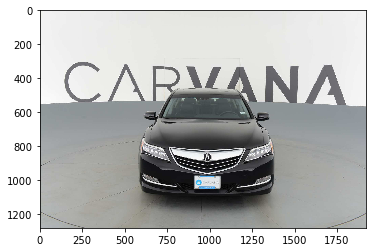

In [4]:
img = imread('train/00087a6bd4dc_01.jpg')
print(img.shape)
print(img.dtype)
plt.imshow(img)

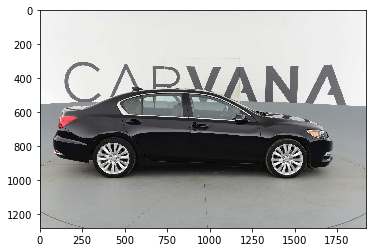

In [5]:
plt.imshow(imread('train/00087a6bd4dc_13.jpg'))

In [6]:
!ls train_masks | head -20

00087a6bd4dc_01_mask.gif
00087a6bd4dc_02_mask.gif
00087a6bd4dc_03_mask.gif
00087a6bd4dc_04_mask.gif
00087a6bd4dc_05_mask.gif
00087a6bd4dc_06_mask.gif
00087a6bd4dc_07_mask.gif
00087a6bd4dc_08_mask.gif
00087a6bd4dc_09_mask.gif
00087a6bd4dc_10_mask.gif
00087a6bd4dc_11_mask.gif
00087a6bd4dc_12_mask.gif
00087a6bd4dc_13_mask.gif
00087a6bd4dc_14_mask.gif
00087a6bd4dc_15_mask.gif
00087a6bd4dc_16_mask.gif
02159e548029_01_mask.gif
02159e548029_02_mask.gif
02159e548029_03_mask.gif
02159e548029_04_mask.gif
ls: write error: Broken pipe


(1280, 1918)
float32


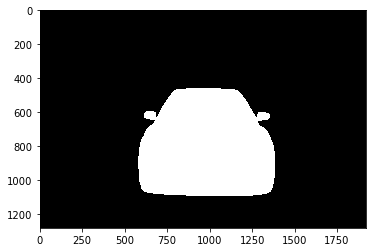

In [7]:
mask = imread('train_masks/00087a6bd4dc_01_mask.gif')
mask = mask[:,:,0].astype(np.float32) / 255
print(mask.shape)
print(mask.dtype)

plt.gray()
plt.imshow(mask)

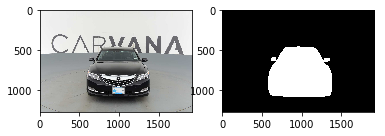

In [8]:
plt.subplot(121)
plt.imshow(img)

plt.subplot(122)
plt.imshow(mask)
plt.show()

## read data

In [41]:
import glob

train_data = np.array(list(zip(sorted(glob.glob('train/*')), sorted(glob.glob('train_masks/*')))))

np.random.shuffle(train_data)
train_data, validation_data = np.split(train_data, [int(train_data.shape[0] * .9)])

## data pipeline

In [9]:
import tensorflow as tf

In [30]:
logs_dir = './logs'
logs_subdir = '/2_dilate'

In [149]:
tf.reset_default_graph()
if tf.get_default_session() is not None:
    tf.get_default_session().close()
sess = tf.InteractiveSession()

In [150]:
# batch_size = 8

# #file_reader = tf.WholeFileReader()

# # image_file_queue = tf.train.string_input_producer(train_imgs, shuffle=False)
# # _, image_file = image_reader.read(image_file_queue)
# # image = tf.reshape(tf.image.decode_image(image_file), [1280, 1918, 3])

# # mask_file_queue = tf.train.string_input_producer(train_masks, shuffle=False)
# # _, mask_file = image_reader.read(mask_file_queue)
# # mask = tf.image.decode_image(mask_file)
# # mask = tf.reshape(tf.squeeze(mask[0,:,:,0]), [1280, 1918]) / 255

# input_queue = tf.train.slice_input_producer([train_data.transpose()[0],
#                                              train_data.transpose()[1]],
#                                             shuffle=True)
# image_name = input_queue[0]
# image_file = tf.read_file(image_name)
# image = tf.image.decode_image(image_file)
# image = tf.reshape(image, [1280, 1918, 3])
# mask_name = input_queue[1]
# mask_file = tf.read_file(mask_name)
# mask = tf.image.decode_image(mask_file)
# mask = tf.reshape(tf.squeeze(mask[0,:,:,0]), [1280, 1918]) / 255

# images, masks = tf.train.batch([image, mask], batch_size=batch_size, name='batch')

# tf.train.start_queue_runners()

In [151]:
# i, m = sess.run([images, masks])
# print(i.shape)
# print(m.shape)

In [152]:
# sess.run([input_queue[0], input_queue[1]])

In [153]:
iterator = tf.contrib.data.Iterator.from_structure((tf.uint8, tf.uint8), ([None, 1280, 1918, 3], [None, 1280, 1918]))
next_element = iterator.get_next()
images = next_element[0]
masks = next_element[1]

In [154]:
batch_size = 16

def read_files(image_fn, mask_fn):
    image_file = tf.read_file(image_fn)
    image = tf.image.decode_image(image_file)
    image = tf.reshape(image, [1280, 1918, 3])
    mask_file = tf.read_file(mask_fn)
    mask = tf.image.decode_image(mask_file)
    # one frame gif, binary mask
    mask = tf.reshape(tf.squeeze(mask[0,:,:,0]), [1280, 1918])
    mask = tf.cast(tf.cast(mask, tf.bool), tf.uint8)
    return image, mask

train_dataset = tf.contrib.data.Dataset.from_tensor_slices((train_data.transpose()[0], train_data.transpose()[1]))
train_dataset = train_dataset.map(read_files).batch(batch_size).repeat()
train_init_op = iterator.make_initializer(train_dataset)

val_dataset = tf.contrib.data.Dataset.from_tensor_slices((validation_data.transpose()[0], validation_data.transpose()[1]))
val_dataset = val_dataset.map(read_files).batch(batch_size)
val_init_op = iterator.make_initializer(val_dataset)

## create model
multi-scale: input pyramid -> mask pyramid

refinement: small mask -> recurrent mask + downsampled input -> smaller(??) mask

learnable upsampling (transposed convolution)

In [155]:
#images = tf.placeholder(tf.int8, (None, 1280, 1918, 3))
#masks = tf.placeholder(tf.int8, (None, 1280, 1918))

global_step = tf.Variable(0, name='global_step', trainable=False)

input = tf.cast(images, tf.float32, name='input')
out = input / 255

with tf.variable_scope('conv'):
    out = tf.layers.conv2d(out, 4, 3, 2, padding='same', activation=tf.nn.relu)
    out = tf.layers.batch_normalization(out)
    out = tf.layers.conv2d(out, 8, 3, 2, padding='same', activation=tf.nn.relu)
    out = tf.layers.batch_normalization(out)
    out = tf.layers.conv2d(out, 16, 3, 2, padding='same', activation=tf.nn.relu)
    out = tf.layers.batch_normalization(out)
    out = tf.layers.conv2d(out, 32, 3, 1, padding='same', activation=tf.nn.relu)
    out = tf.layers.batch_normalization(out)

with tf.variable_scope('dilated_conv'):
    out = tf.layers.conv2d(out, 32, 3, dilation_rate=2, padding='same', activation=tf.nn.relu)
    out = tf.layers.batch_normalization(out)
    out = tf.layers.conv2d(out, 32, 3, dilation_rate=4, padding='same', activation=tf.nn.relu)
    out = tf.layers.batch_normalization(out)

with tf.variable_scope('dense'):
    out = tf.layers.dense(out, 32)
    out = tf.layers.batch_normalization(out)

with tf.variable_scope('deconv'):
    out = tf.layers.conv2d_transpose(out, 16, 3, 1, padding='same', activation=tf.nn.relu)
    out = tf.layers.batch_normalization(out)
    out = tf.layers.conv2d_transpose(out, 8, 3, 2, padding='same', activation=tf.nn.relu)
    out = tf.layers.batch_normalization(out)
    out = tf.layers.conv2d_transpose(out, 4, 3, 2, padding='same', activation=tf.nn.relu)
    out = tf.layers.batch_normalization(out)
    out = tf.layers.conv2d_transpose(out, 1, 3, 2, padding='same', activation=None)
    out = tf.layers.batch_normalization(out)

with tf.variable_scope('pred'):
    pred_logits = tf.squeeze(out[:,:,1:-1], axis=-1)
    pred = tf.sigmoid(pred_logits, name='pred')
    assert pred.shape.as_list()[1:] == [1280, 1918]
saver = tf.train.Saver()

## training

In [156]:
with tf.variable_scope('train'):
    label = tf.cast(masks, tf.float32)
    loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels = label, logits = pred_logits), name='loss')
    #loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(labels = tf.expand_dims(label, axis=-1), logits = tf.expand_dims(pred_logits, axis=-1)))
    train = tf.train.AdamOptimizer(epsilon=1e-04).minimize(loss, global_step=global_step, name='train')

    positive = tf.reduce_sum(tf.cast(tf.logical_and(tf.equal(tf.round(pred), 1), tf.equal(masks, 1)), tf.int32))
    precision = tf.identity(positive / tf.reduce_sum(tf.cast(tf.equal(tf.round(pred), 1), tf.int32)), name='precision')
    recall = tf.identity(positive / tf.reduce_sum(tf.cast(tf.equal(masks, 1), tf.int32)), name='recall')
    f1 = tf.identity(2 * precision * recall / (precision + recall), name='f1')
    accuracy = tf.identity(tf.reduce_sum(tf.cast(tf.equal(tf.cast(tf.round(pred), tf.uint8), masks), tf.int32)) / tf.size(masks), name='accuracy')

    tf.add_to_collection('metrics', loss)
    tf.add_to_collection('metrics', precision)
    tf.add_to_collection('metrics', recall)
    tf.add_to_collection('metrics', f1)
    tf.add_to_collection('metrics', accuracy)
#     tf.summary.scalar('loss', loss)
#     tf.summary.scalar('precision', precision)
#     tf.summary.scalar('recall', recall)
#     tf.summary.scalar('f1', f1)
#     tf.summary.scalar('accuracy', accuracy)
#     merged = tf.summary.merge_all()

train_writer = tf.summary.FileWriter(logs_dir + logs_subdir + '/train', sess.graph)
val_writer = tf.summary.FileWriter(logs_dir + logs_subdir + '/val')

In [157]:
def log_validation():
    with tf.Session() as val_sess:
        saver.restore(val_sess, 'model/model')
        val_sess.run(val_init_op)
        val_losses = []
        val_precs = []
        val_recall = []
        val_f1 = []
        val_accs = []

        print('evaluating validation set')
        while True:
            try:
                l, p, r, f, a = val_sess.run(tf.get_collection('metrics'))
                val_losses.append(l)
                val_precs.append(p)
                val_recall.append(r)
                val_f1.append(f)
                val_accs.append(a)
            except tf.errors.OutOfRangeError:
                break

        summary = tf.Summary()
        summary.value.add(tag='loss', simple_value=np.mean(val_losses))
        summary.value.add(tag='precision', simple_value=np.mean(val_precs))
        summary.value.add(tag='recall', simple_value=np.mean(val_recall))
        summary.value.add(tag='f1', simple_value=np.mean(val_f1))
        summary.value.add(tag='accuracy', simple_value=np.mean(val_accs))

        val_writer.add_summary(summary, global_step.eval())
        val_writer.flush()

In [158]:
sess.run(tf.global_variables_initializer())
sess.run(train_init_op)
#sess.run(['pred/pred', 'batch:1', 'train/loss', 'train/train'])

In [159]:
# saver.restore(sess, 'model/model')

INFO:tensorflow:Restoring parameters from model/model


313 0.200371


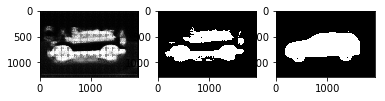

314 0.292211


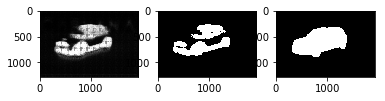

315 0.271473


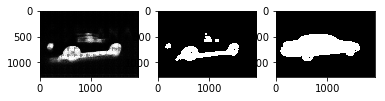

316 0.264683


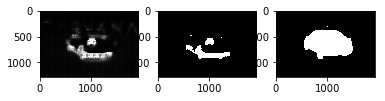

317 0.235857


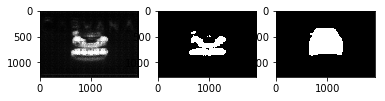

318 0.228857


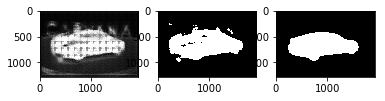

319 0.288187


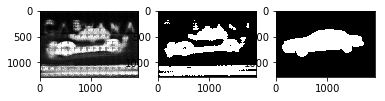

320 0.223874


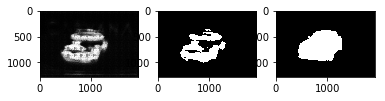

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
321 0.209047


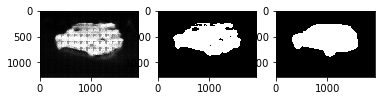

322 0.232118


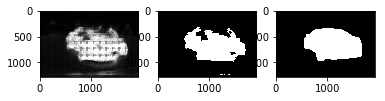

323 0.241774


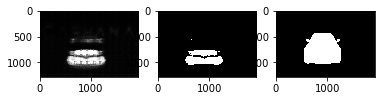

324 0.241103


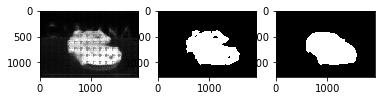

325 0.223906


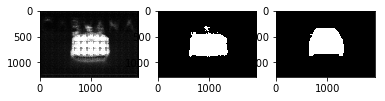

326 0.276975


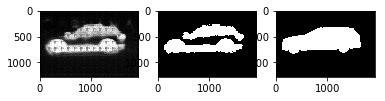

327 0.244434


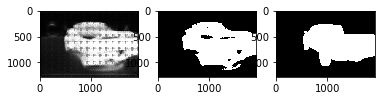

328 0.201811


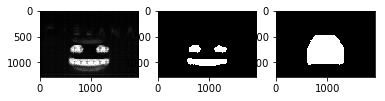

329 0.270004


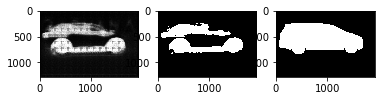

330 0.223143


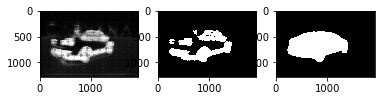

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
331 0.286247


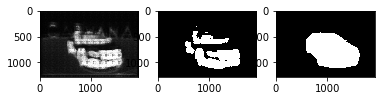

332 0.218783


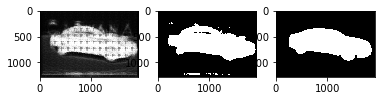

333 0.273637


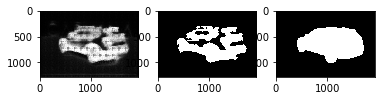

334 0.292447


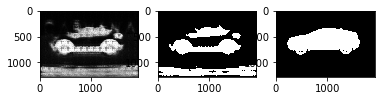

335 0.250036


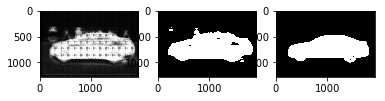

336 0.224852


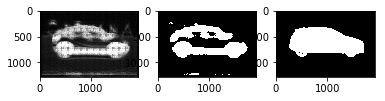

337 0.280117


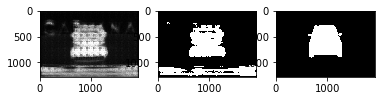

338 0.192614


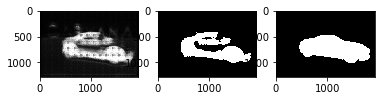

339 0.253118


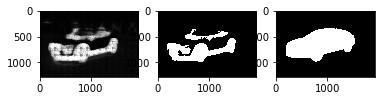

340 0.233938


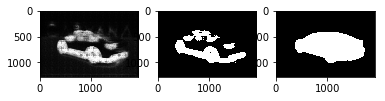

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
341 0.209594


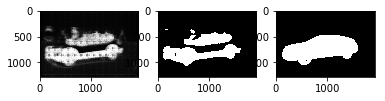

342 0.235101


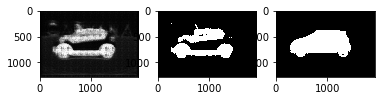

343 0.199225


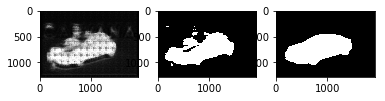

344 0.185568


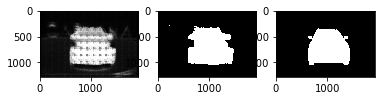

345 0.27702


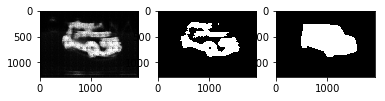

346 0.193829


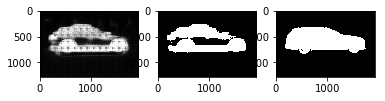

347 0.212505


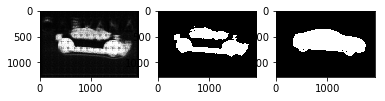

348 0.226224


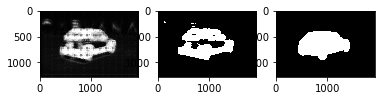

349 0.203845


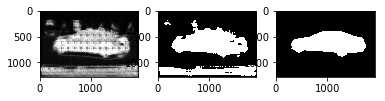

350 0.157251


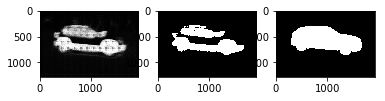

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
351 0.203079


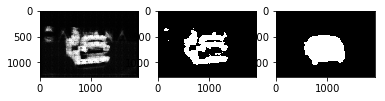

352 0.194879


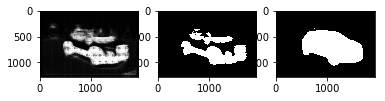

353 0.205419


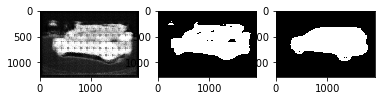

354 0.213134


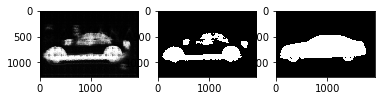

355 0.282333


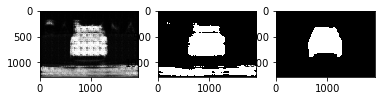

356 0.227789


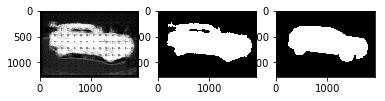

357 0.181348


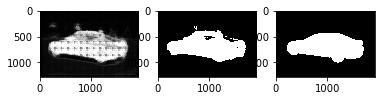

358 0.262471


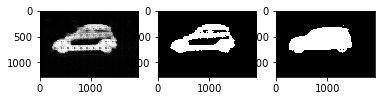

359 0.168405


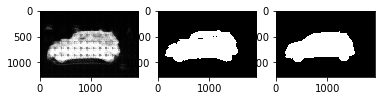

360 0.213021


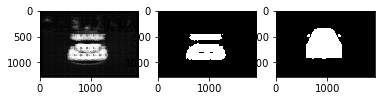

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
361 0.182894


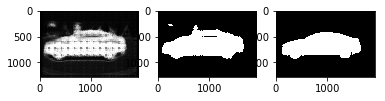

362 0.183595


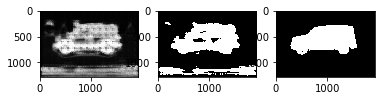

363 0.254294


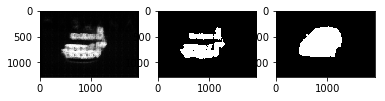

364 0.208348


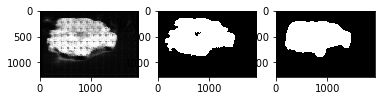

365 0.257012


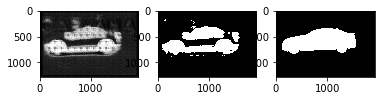

366 0.233546


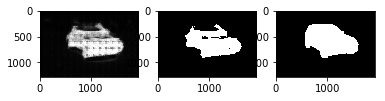

367 0.205521


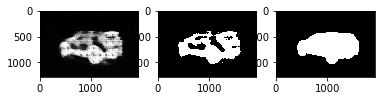

368 0.225721


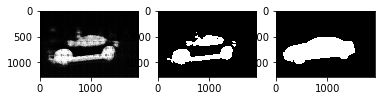

369 0.206528


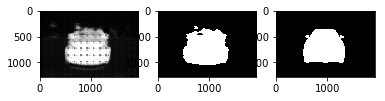

370 0.196452


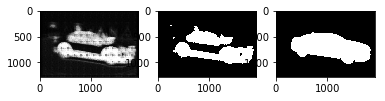

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
371 0.237723


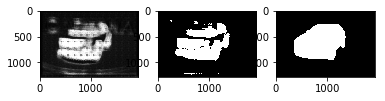

372 0.227686


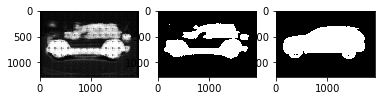

373 0.218312


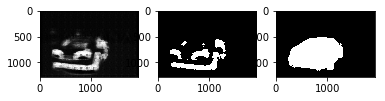

374 0.230682


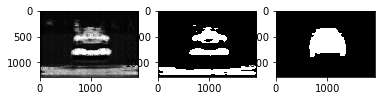

375 0.226762


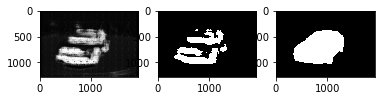

376 0.223028


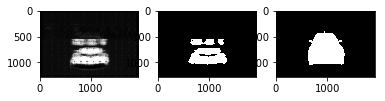

377 0.205238


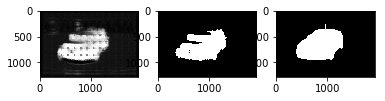

378 0.193489


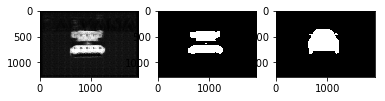

379 0.2227


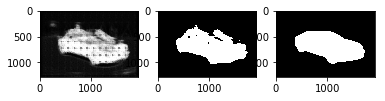

380 0.250951


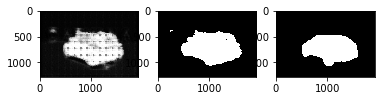

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
381 0.170634


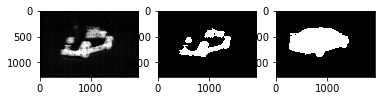

382 0.209127


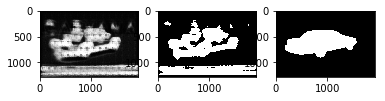

383 0.199364


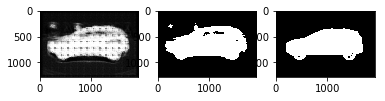

384 0.17128


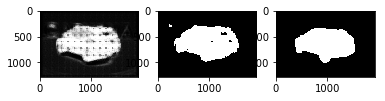

385 0.22081


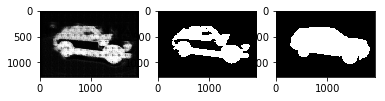

386 0.176675


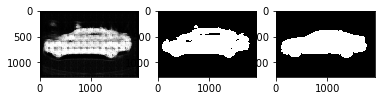

387 0.197028


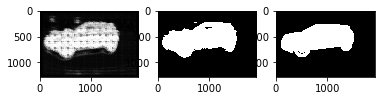

388 0.189288


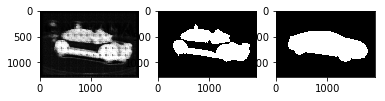

389 0.167489


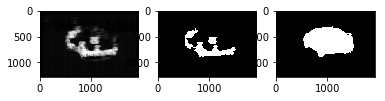

390 0.174166


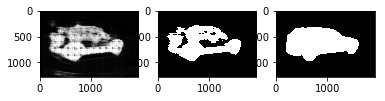

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
391 0.147709


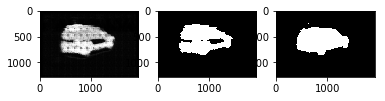

392 0.146471


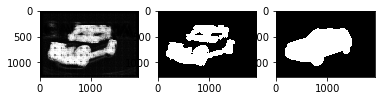

393 0.175634


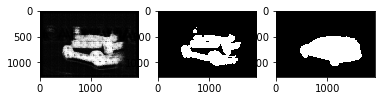

394 0.181155


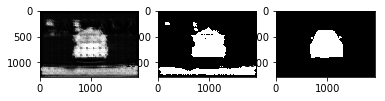

395 0.166326


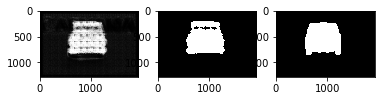

396 0.161182


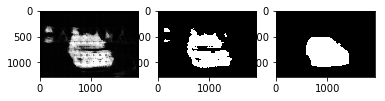

397 0.228603


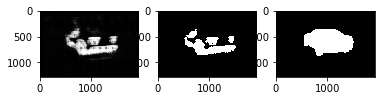

398 0.41217


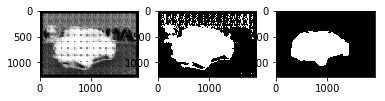

399 0.324527


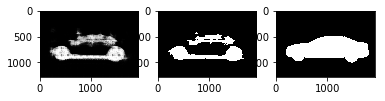

400 0.475037


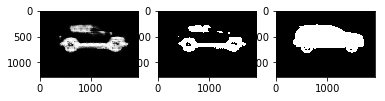

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
401 0.506648


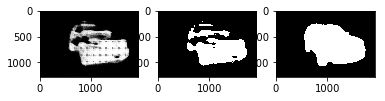

402 0.401403


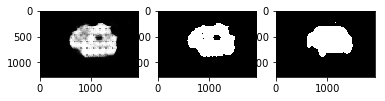

403 0.422939


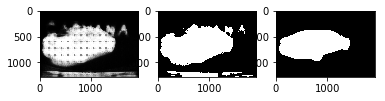

404 0.298346


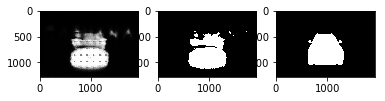

405 0.240765


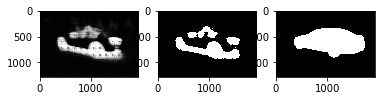

406 0.217577


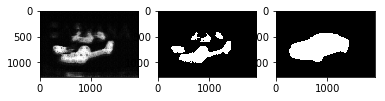

407 0.218877


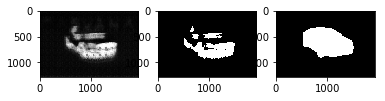

408 0.2361


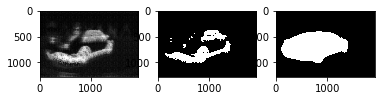

409 0.248226


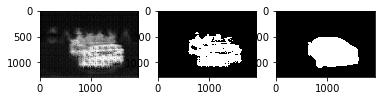

410 0.271079


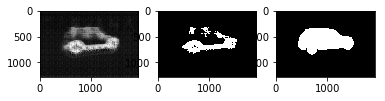

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
411 0.259174


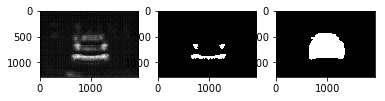

412 0.275604


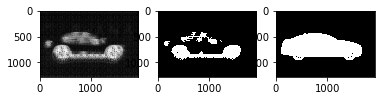

413 0.243293


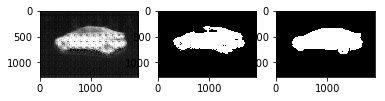

414 0.258902


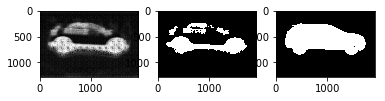

415 0.252501


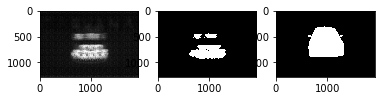

416 0.226602


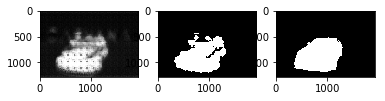

417 0.225447


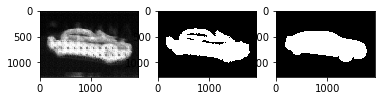

418 0.235923


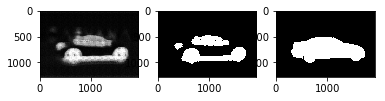

419 0.218349


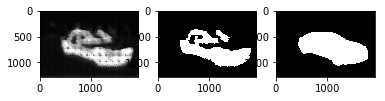

420 0.180014


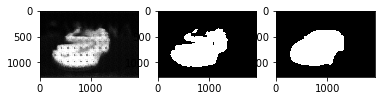

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
421 0.203342


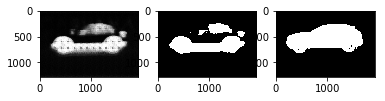

422 0.176944


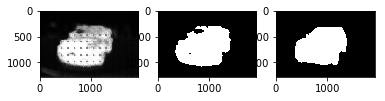

423 0.276362


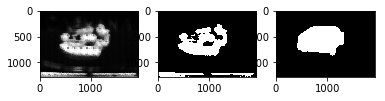

424 0.233017


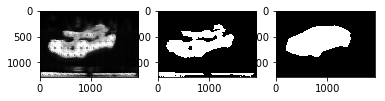

425 0.239384


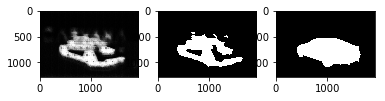

426 0.236294


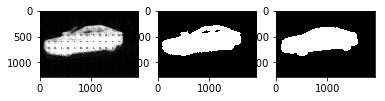

427 0.190573


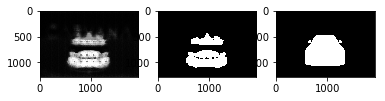

428 0.215039


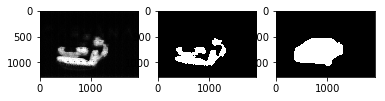

429 0.168735


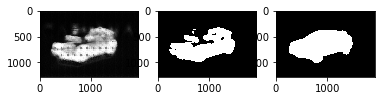

430 0.200914


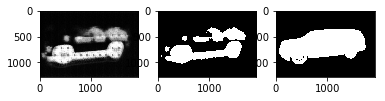

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
431 0.237468


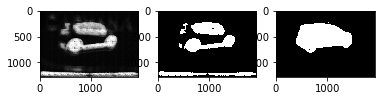

432 0.214425


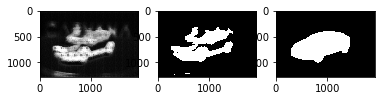

433 0.19562


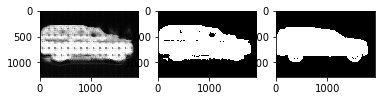

434 0.228693


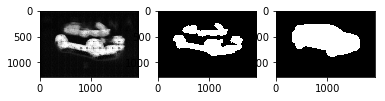

435 0.209599


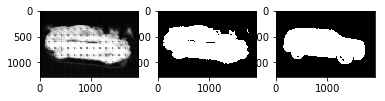

436 0.233768


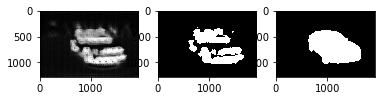

437 0.202946


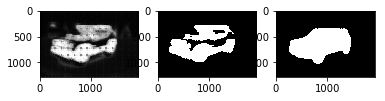

438 0.221545


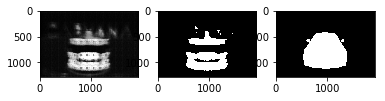

439 0.202068


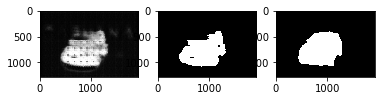

440 0.19948


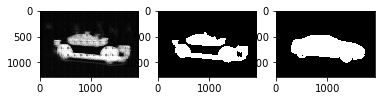

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
441 0.182492


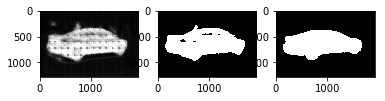

442 0.174806


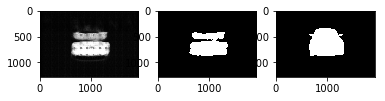

443 0.265068


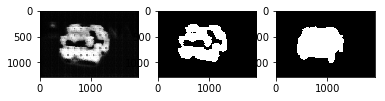

444 0.198812


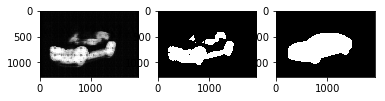

445 0.155444


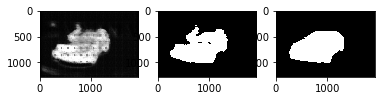

446 0.222935


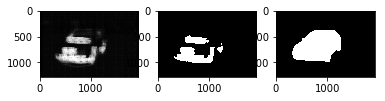

447 0.213103


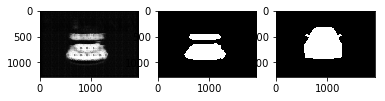

448 0.180365


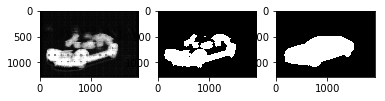

449 0.201009


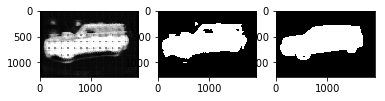

450 0.229653


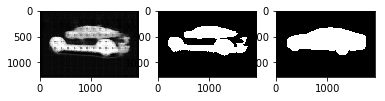

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
451 0.223953


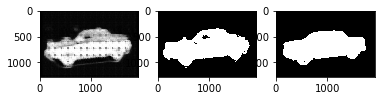

452 0.207866


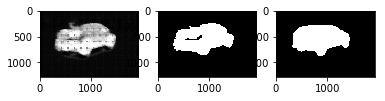

453 0.194743


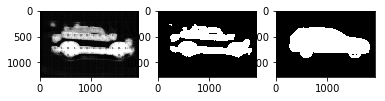

454 0.177658


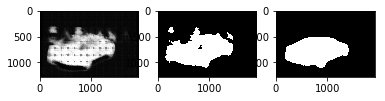

455 0.190606


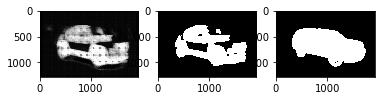

456 0.165776


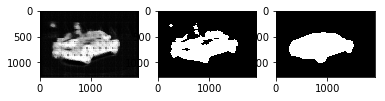

457 0.193413


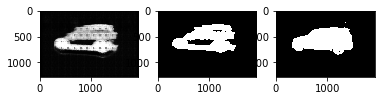

458 0.188166


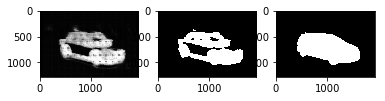

459 0.189839


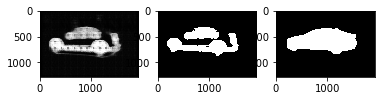

460 0.205342


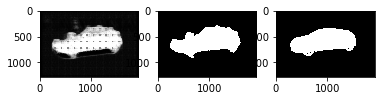

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
461 0.175338


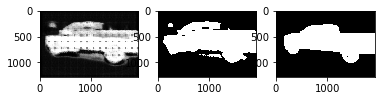

462 0.188267


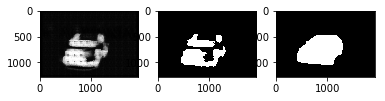

463 0.185488


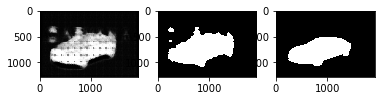

464 0.209883


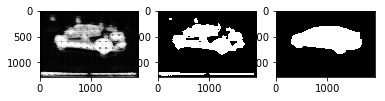

465 0.169153


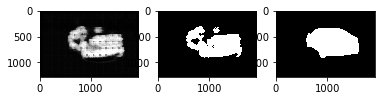

466 0.176633


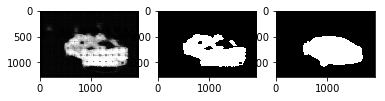

467 0.218929


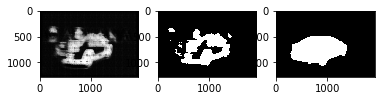

468 0.202208


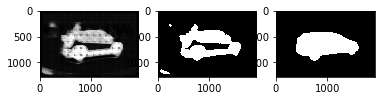

469 0.184442


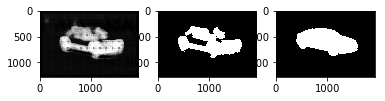

470 0.221259


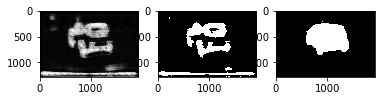

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
471 0.163915


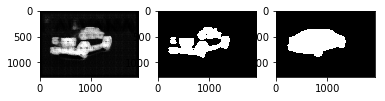

472 0.168197


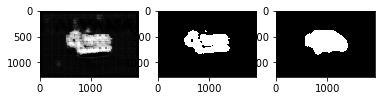

473 0.17897


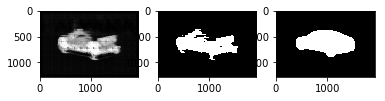

474 0.159535


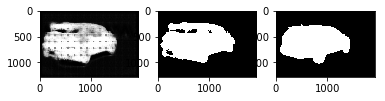

475 0.138205


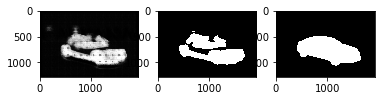

476 0.176851


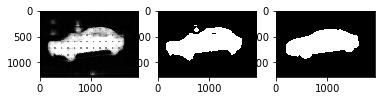

477 0.162453


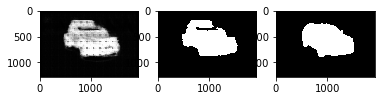

478 0.141763


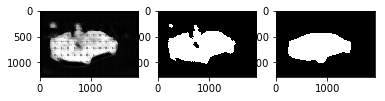

479 0.168436


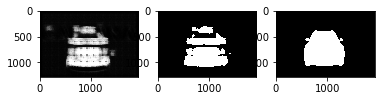

480 0.159946


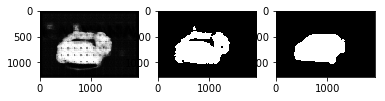

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
481 0.19266


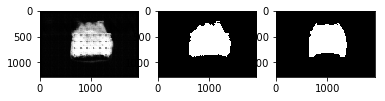

482 0.205595


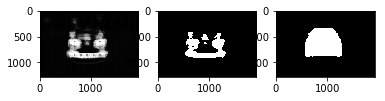

483 0.151099


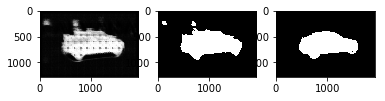

484 0.1666


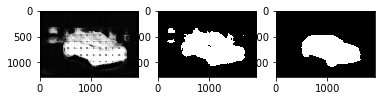

485 0.158023


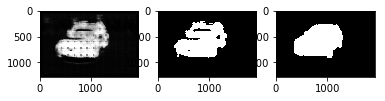

486 0.165573


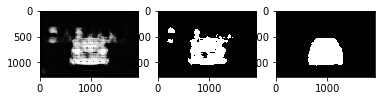

487 0.185969


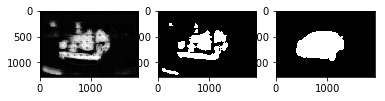

488 0.175942


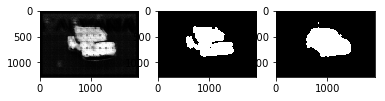

489 0.185524


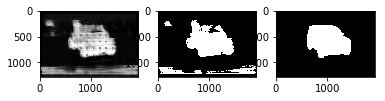

490 0.1527


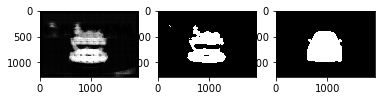

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
491 0.133441


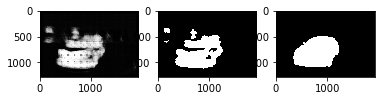

492 0.197425


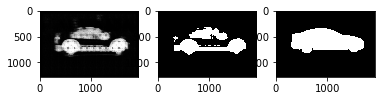

493 0.17408


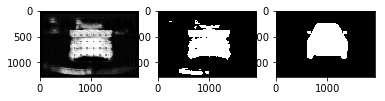

494 0.179063


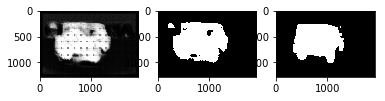

495 0.143584


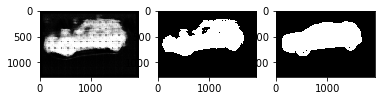

496 0.196241


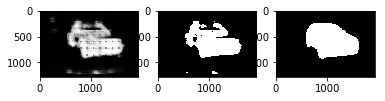

497 0.169792


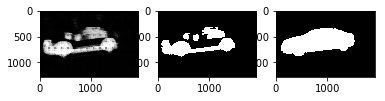

498 0.148163


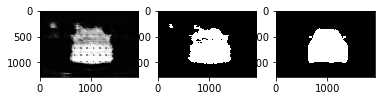

499 0.174295


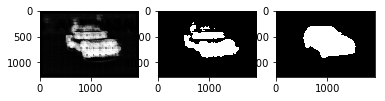

500 0.186186


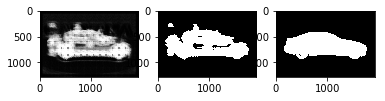

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
501 0.161262


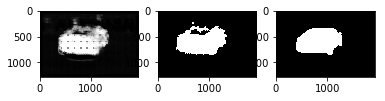

502 0.16125


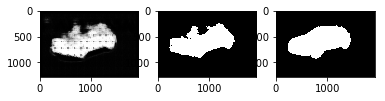

503 0.150339


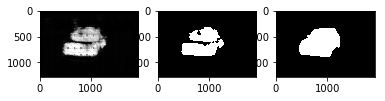

504 0.132804


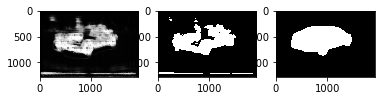

505 0.120218


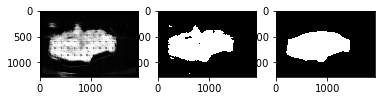

506 0.14227


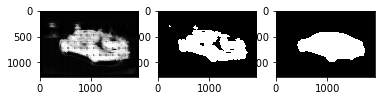

507 0.137973


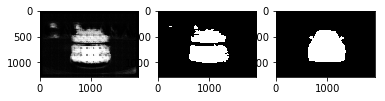

508 0.164472


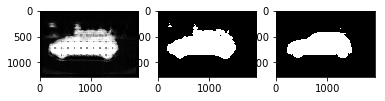

509 0.192445


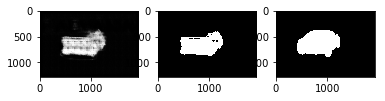

510 0.14019


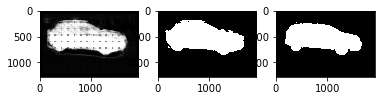

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
511 0.142934


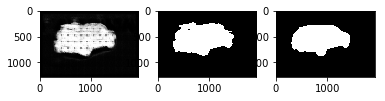

512 0.14399


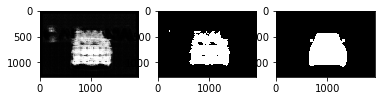

513 0.15738


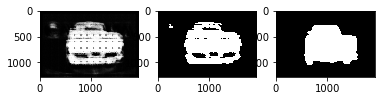

514 0.191764


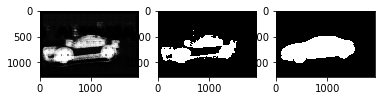

515 0.185653


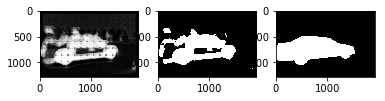

516 0.157623


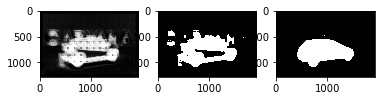

517 0.149252


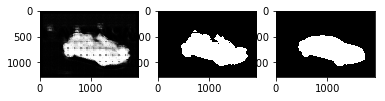

518 0.165212


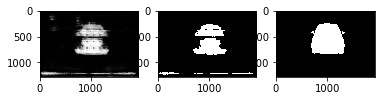

519 0.157413


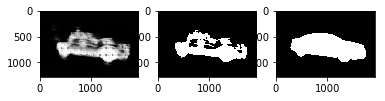

520 0.199138


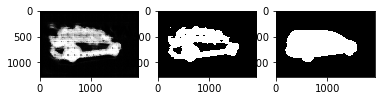

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
521 0.155185


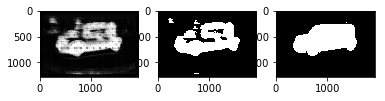

522 0.166002


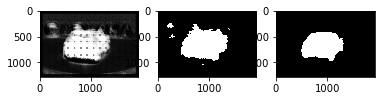

523 0.149843


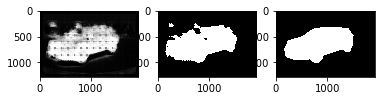

524 0.158883


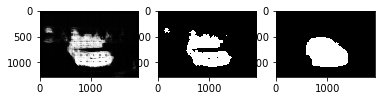

525 0.168733


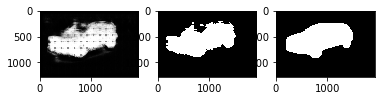

526 0.140413


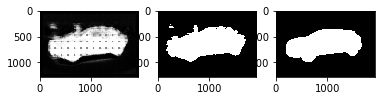

527 0.165064


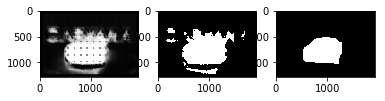

528 0.131494


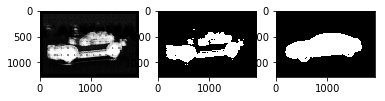

529 0.149915


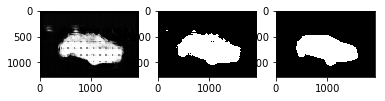

530 0.152472


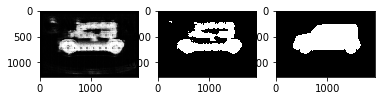

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
531 0.210381


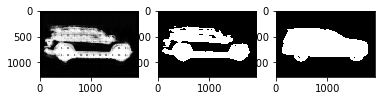

532 0.172247


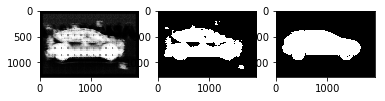

533 0.160289


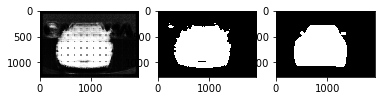

534 0.158629


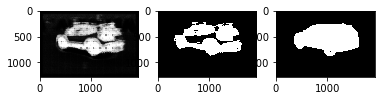

535 0.149207


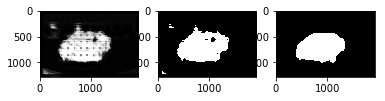

536 0.184223


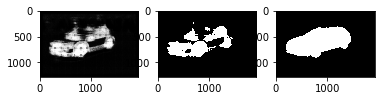

537 0.134189


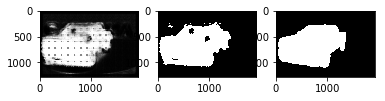

538 0.128704


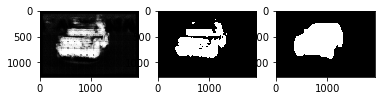

539 0.14047


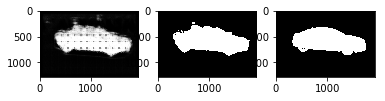

540 0.136101


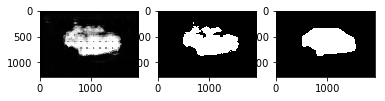

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
541 0.12873


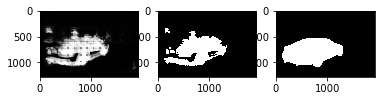

542 0.137611


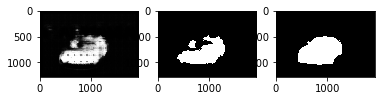

543 0.179283


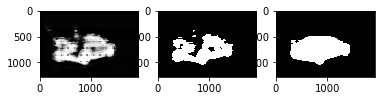

544 0.183673


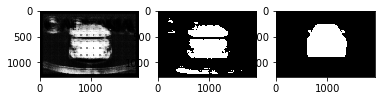

545 0.18143


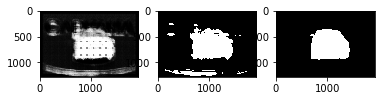

546 0.146829


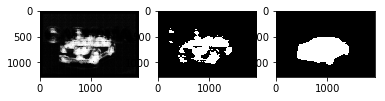

547 0.146814


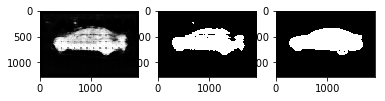

548 0.144511


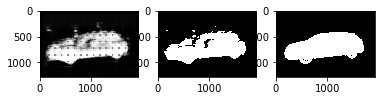

549 0.1568


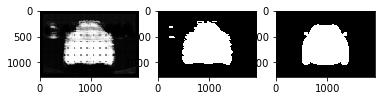

550 0.165977


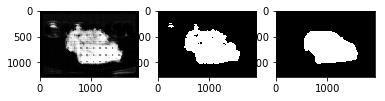

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
551 0.159418


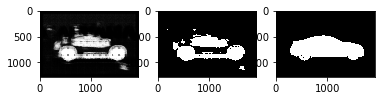

552 0.154373


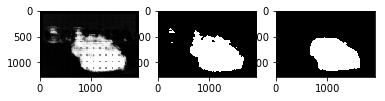

553 0.141372


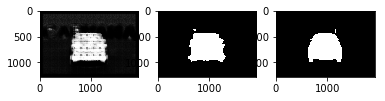

554 0.138462


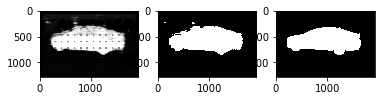

555 0.16398


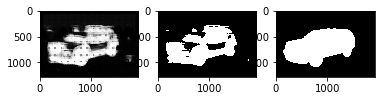

556 0.16272


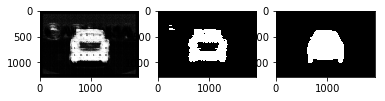

557 0.148011


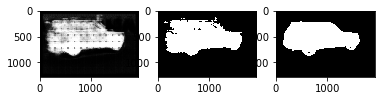

558 0.116799


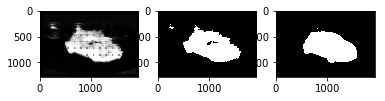

559 0.154715


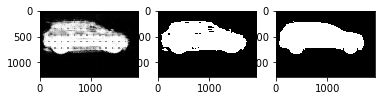

560 0.201473


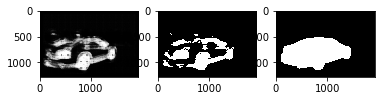

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
561 0.139


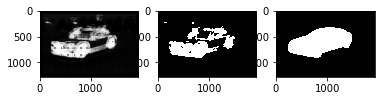

562 0.174783


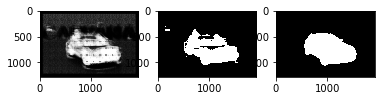

563 0.119277


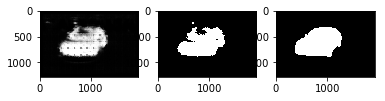

564 0.125689


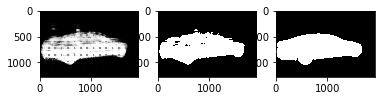

565 0.149834


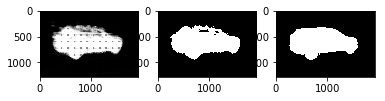

566 0.141958


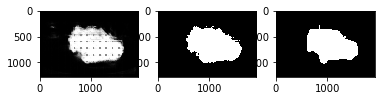

567 0.19954


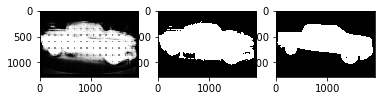

568 0.185867


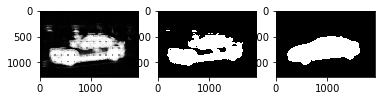

569 0.149457


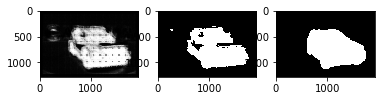

570 0.16132


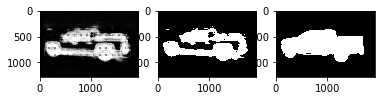

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
571 0.162616


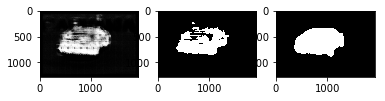

572 0.170234


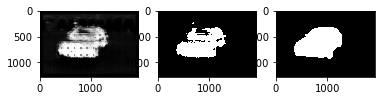

573 0.155421


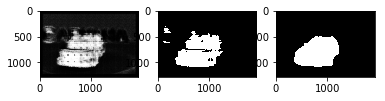

574 0.128078


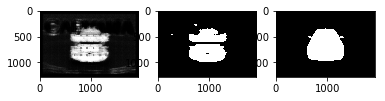

575 0.15492


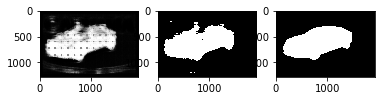

576 0.155


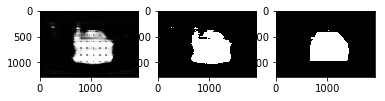

577 0.168285


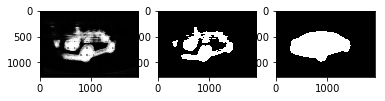

578 0.162087


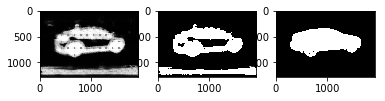

579 0.159991


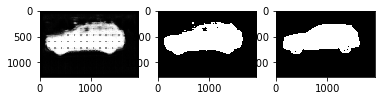

580 0.155477


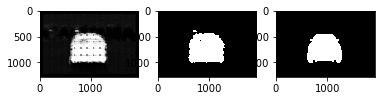

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
581 0.156509


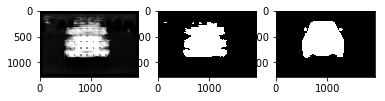

582 0.157582


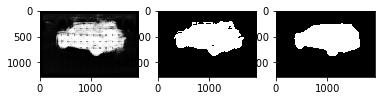

583 0.137169


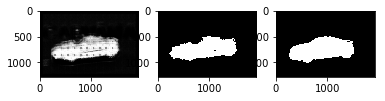

584 0.143491


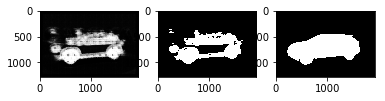

585 0.186582


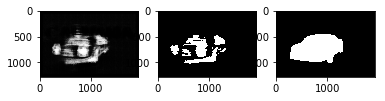

586 0.111895


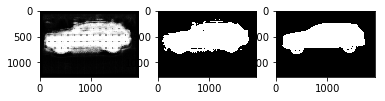

587 0.149621


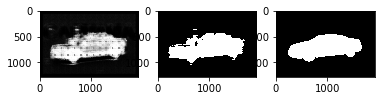

588 0.137817


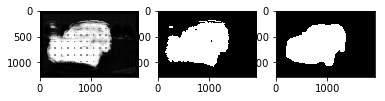

589 0.127567


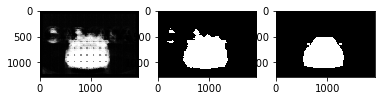

590 0.156188


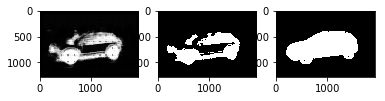

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
591 0.160316


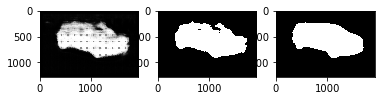

592 0.161144


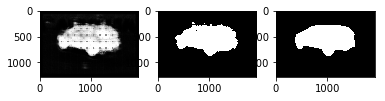

593 0.129975


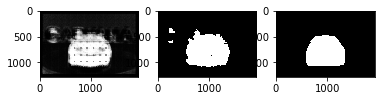

594 0.148659


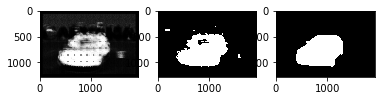

595 0.119217


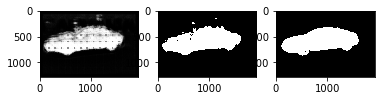

596 0.160828


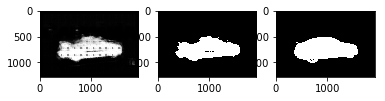

597 0.164937


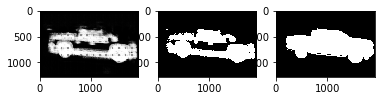

598 0.121272


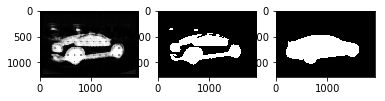

599 0.125655


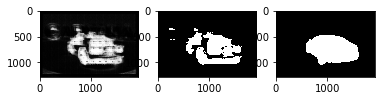

600 0.120722


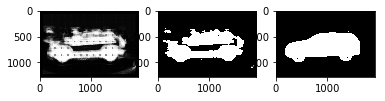

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
601 0.162855


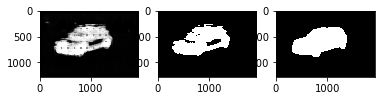

602 0.14984


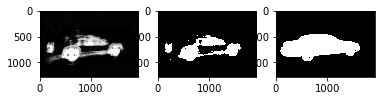

603 0.151329


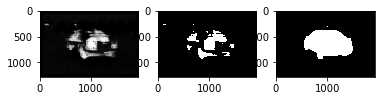

604 0.144642


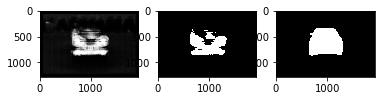

605 0.143461


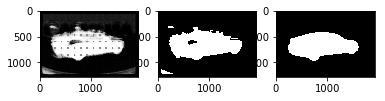

606 0.164482


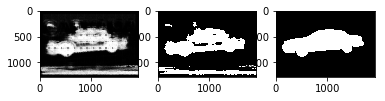

607 0.139026


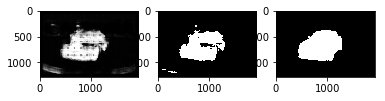

608 0.123281


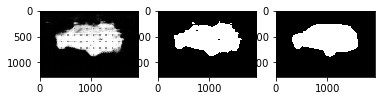

609 0.129828


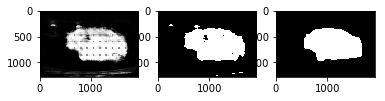

610 0.143521


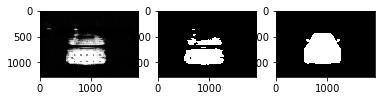

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
611 0.140376


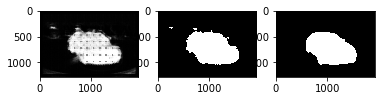

612 0.127686


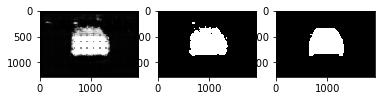

613 0.159302


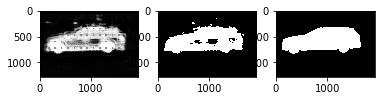

614 0.13588


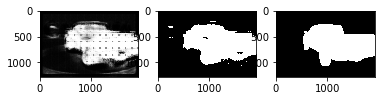

615 0.135515


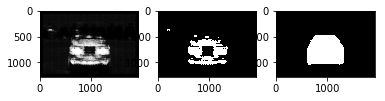

616 0.158411


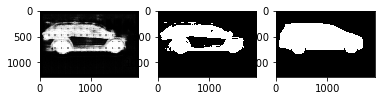

617 0.13551


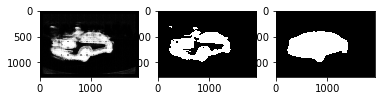

618 0.175307


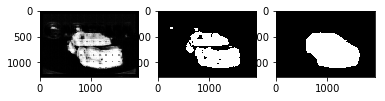

619 0.114609


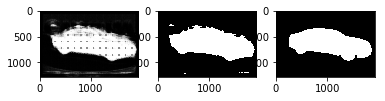

620 0.143735


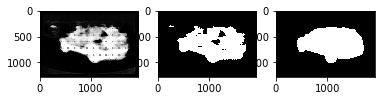

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
621 0.17657


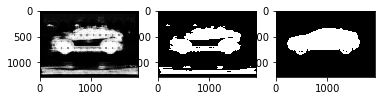

622 0.146588


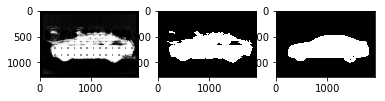

623 0.139163


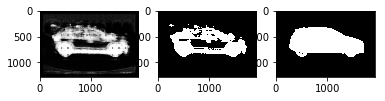

624 0.166742


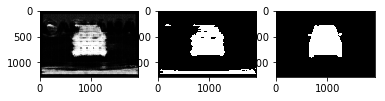

625 0.114986


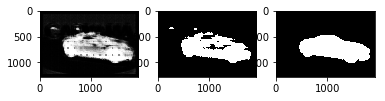

626 0.151697


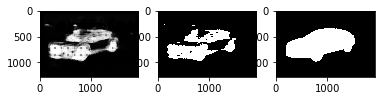

627 0.135299


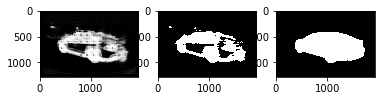

628 0.12435


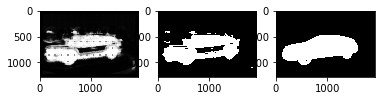

629 0.135123


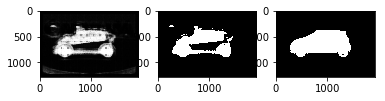

630 0.106271


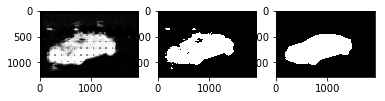

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
631 0.105264


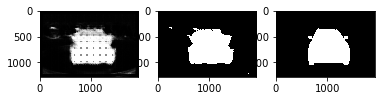

632 0.161378


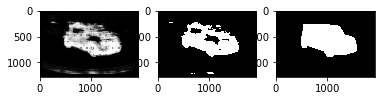

633 0.110852


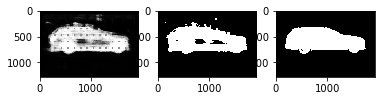

634 0.128381


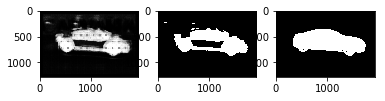

635 0.140048


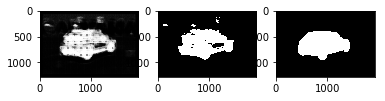

636 0.11683


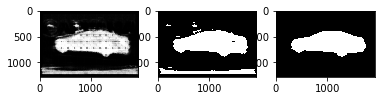

637 0.0943087


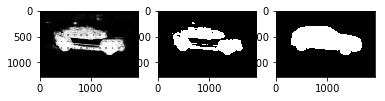

638 0.121208


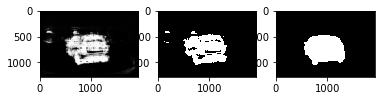

639 0.105892


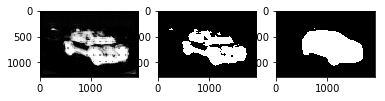

640 0.110311


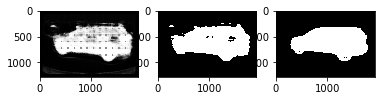

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
641 0.133862


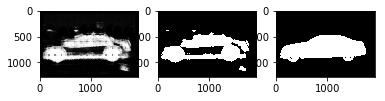

642 0.153495


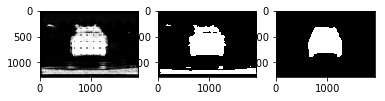

643 0.123236


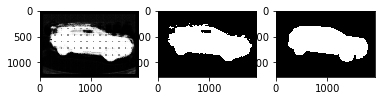

644 0.123562


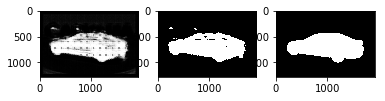

645 0.14088


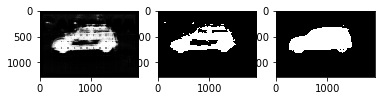

646 0.103627


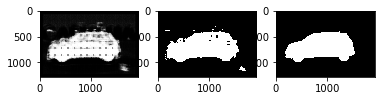

647 0.132647


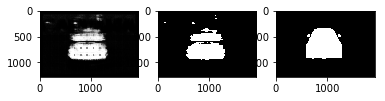

648 0.114026


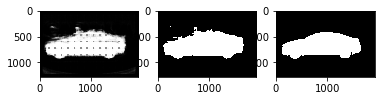

649 0.107743


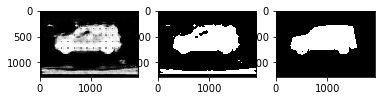

650 0.159398


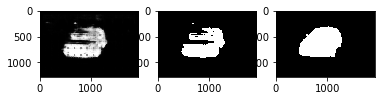

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
651 0.130218


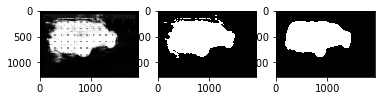

652 0.170391


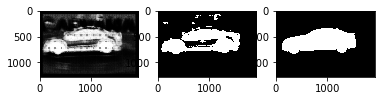

653 0.156566


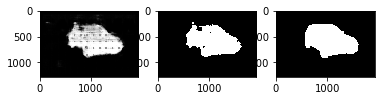

654 0.130788


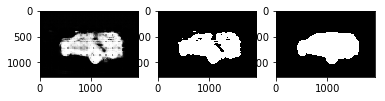

655 0.146999


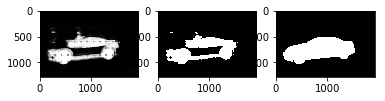

656 0.138683


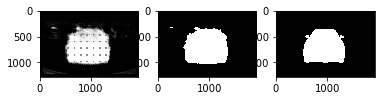

657 0.126688


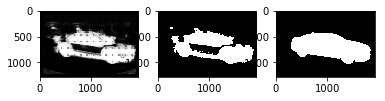

658 0.135145


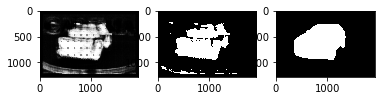

659 0.14798


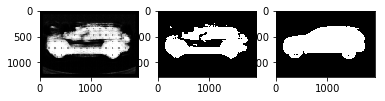

660 0.138977


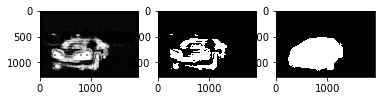

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
661 0.147773


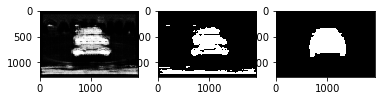

662 0.144904


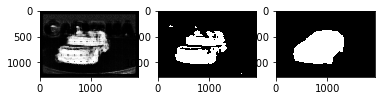

663 0.145782


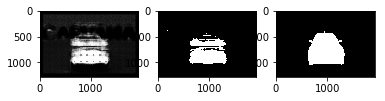

664 0.118484


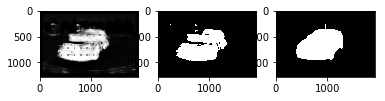

665 0.114547


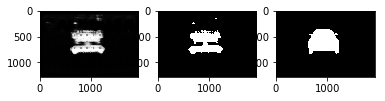

666 0.148108


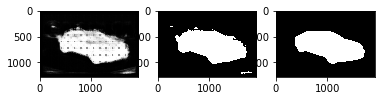

667 0.177723


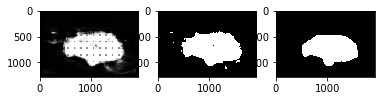

668 0.108464


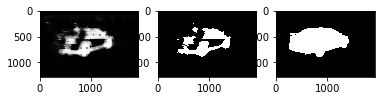

669 0.132746


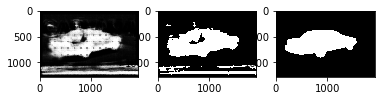

670 0.134182


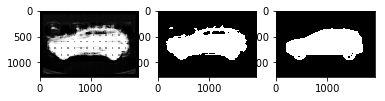

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
671 0.102821


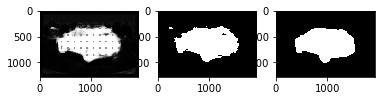

672 0.154196


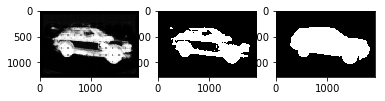

673 0.115125


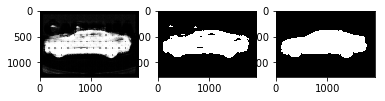

674 0.133162


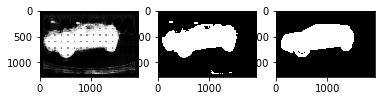

675 0.124086


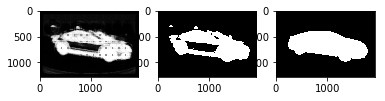

676 0.105769


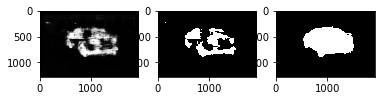

677 0.11494


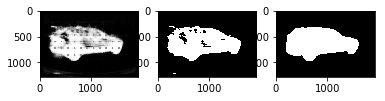

678 0.0998526


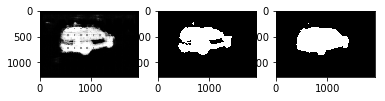

679 0.0918054


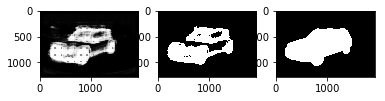

680 0.118899


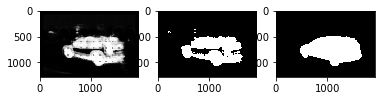

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
681 0.123375


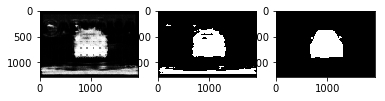

682 0.107821


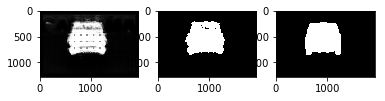

683 0.110389


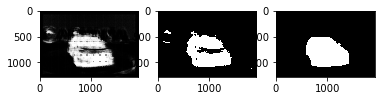

684 0.158055


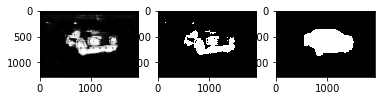

685 0.123273


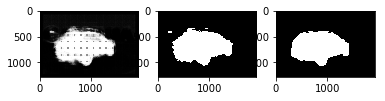

686 0.115275


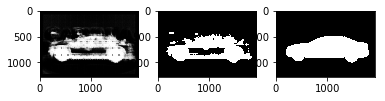

687 0.10754


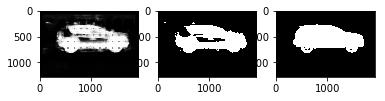

688 0.14076


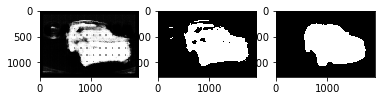

689 0.131521


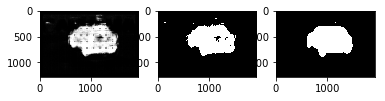

690 0.126186


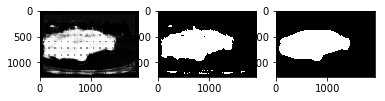

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
691 0.122183


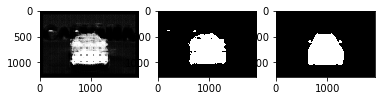

692 0.124334


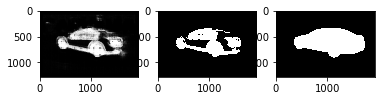

693 0.113948


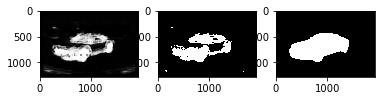

694 0.112612


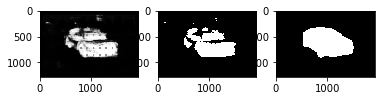

695 0.115756


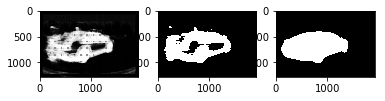

696 0.10801


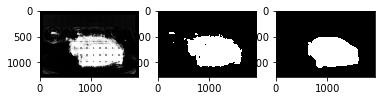

697 0.118595


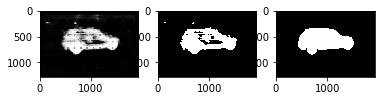

698 0.110213


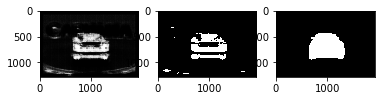

699 0.119906


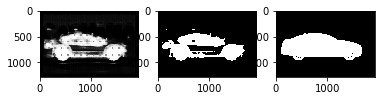

700 0.0934776


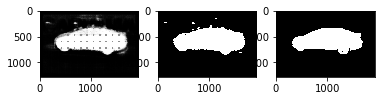

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
701 0.117307


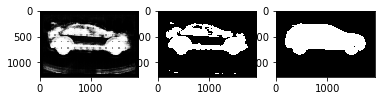

702 0.123783


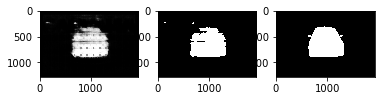

703 0.0969334


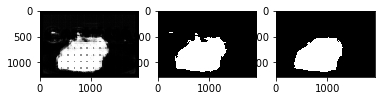

704 0.116455


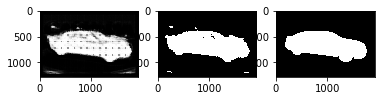

705 0.113536


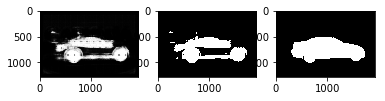

706 0.106158


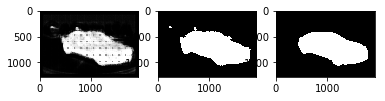

707 0.0880804


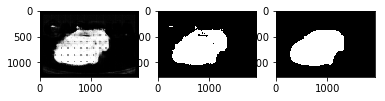

708 0.113186


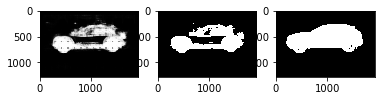

709 0.0886886


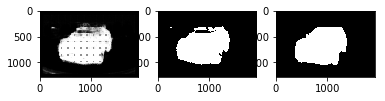

710 0.137157


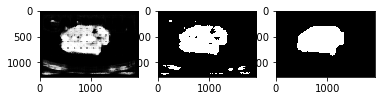

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
711 0.127878


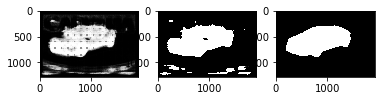

712 0.115992


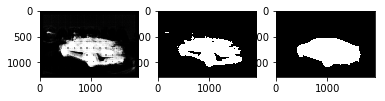

713 0.129733


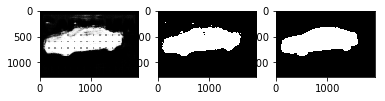

714 0.101381


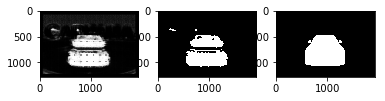

715 0.109396


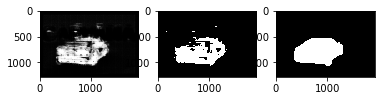

716 0.0797592


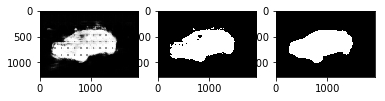

717 0.119235


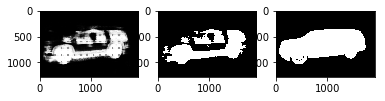

718 0.154277


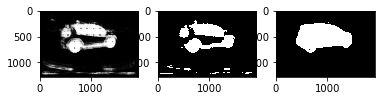

719 0.141314


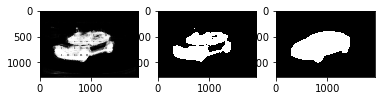

720 0.114772


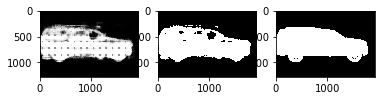

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
721 0.113586


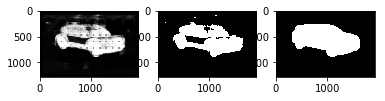

722 0.153853


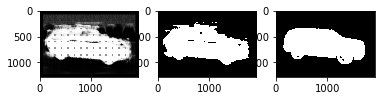

723 0.138322


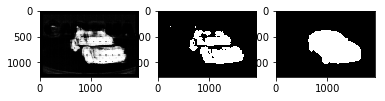

724 0.130103


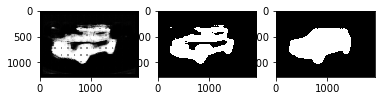

725 0.141381


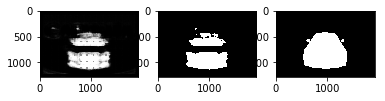

726 0.133302


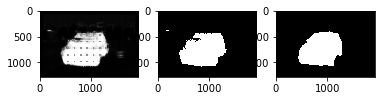

727 0.133457


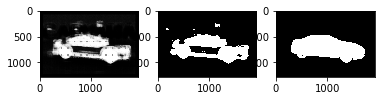

728 0.107471


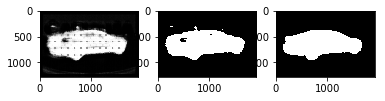

729 0.111212


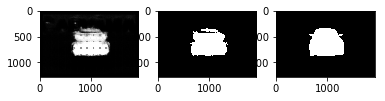

730 0.180169


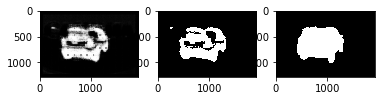

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
731 0.120535


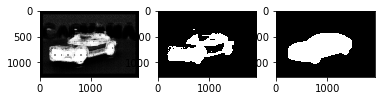

732 0.115422


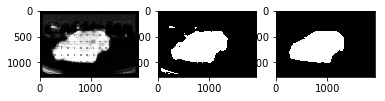

733 0.132274


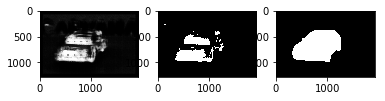

734 0.132316


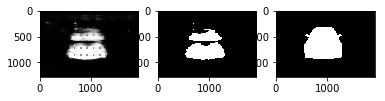

735 0.103242


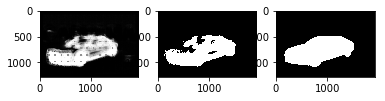

736 0.128654


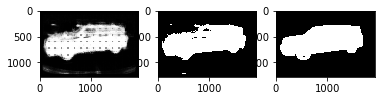

737 0.149209


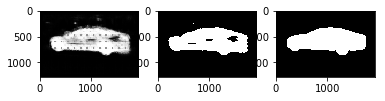

738 0.136214


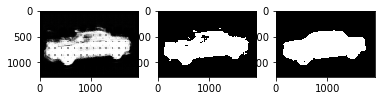

739 0.135029


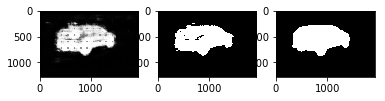

740 0.118671


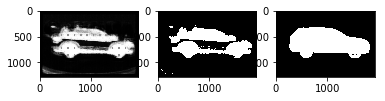

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
741 0.124695


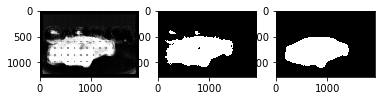

742 0.110756


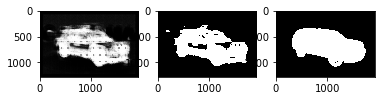

743 0.101749


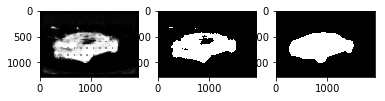

744 0.136554


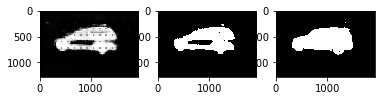

745 0.120486


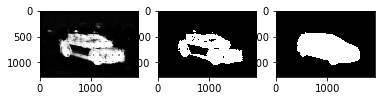

746 0.124428


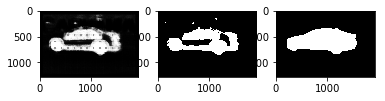

747 0.14938


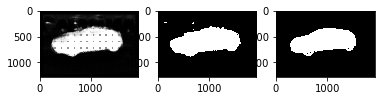

748 0.116676


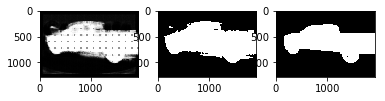

749 0.124334


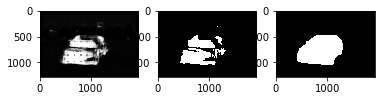

750 0.124313


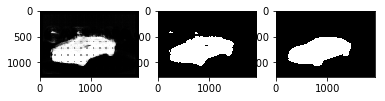

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
751 0.135789


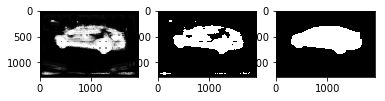

752 0.104146


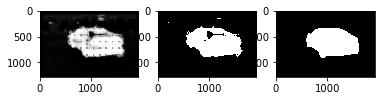

753 0.127158


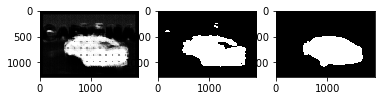

754 0.128956


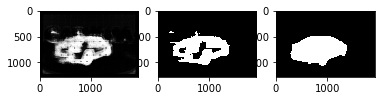

755 0.129813


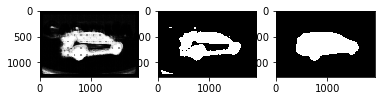

756 0.113121


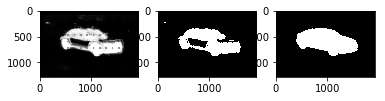

757 0.149987


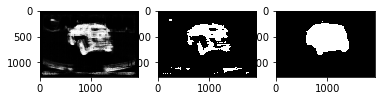

758 0.0988692


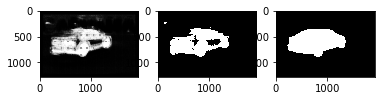

759 0.106071


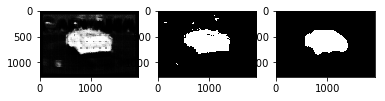

760 0.109191


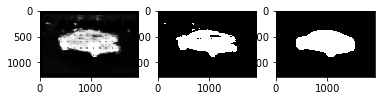

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
761 0.102625


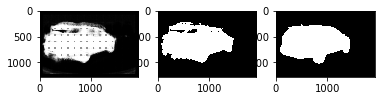

762 0.0817673


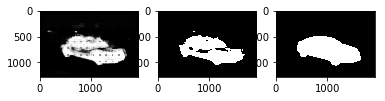

763 0.0960481


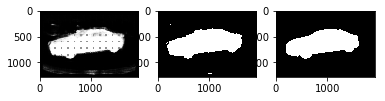

764 0.0958781


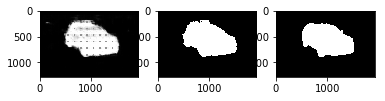

765 0.0864093


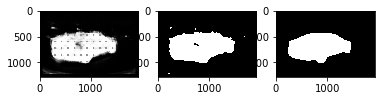

766 0.112011


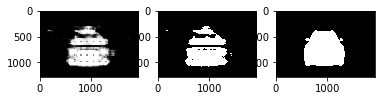

767 0.0989894


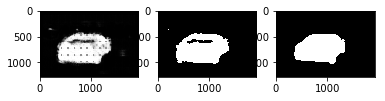

768 0.117444


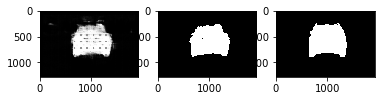

769 0.119736


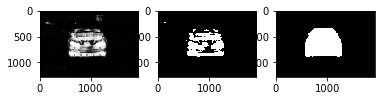

770 0.0974407


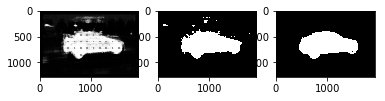

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
771 0.103803


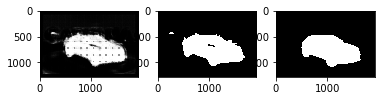

772 0.0990997


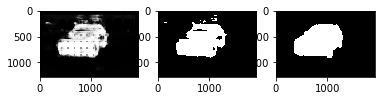

773 0.0981961


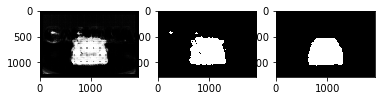

774 0.121486


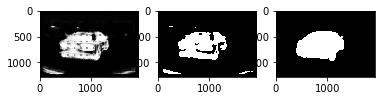

775 0.107085


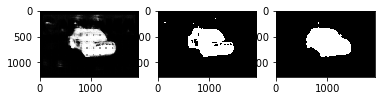

776 0.122012


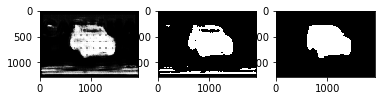

777 0.0973658


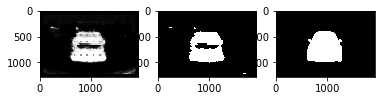

778 0.0871171


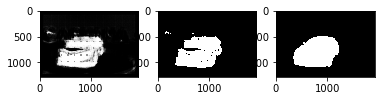

779 0.116904


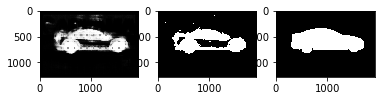

780 0.113267


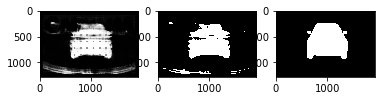

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
781 0.107249


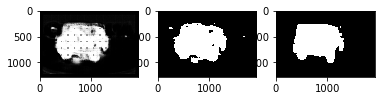

782 0.0858417


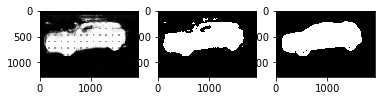

783 0.115473


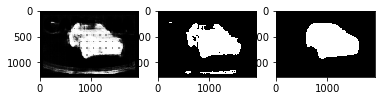

784 0.0988235


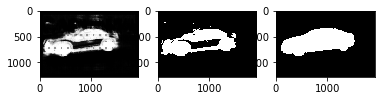

785 0.089736


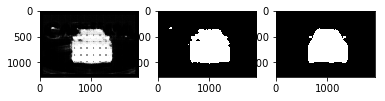

786 0.114976


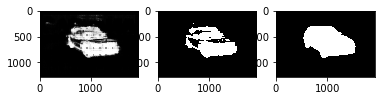

787 0.10087


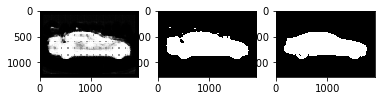

788 0.0954157


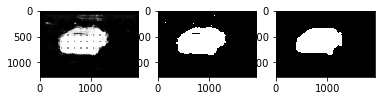

789 0.0881519


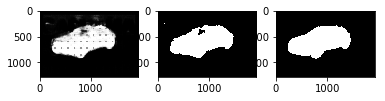

790 0.0945196


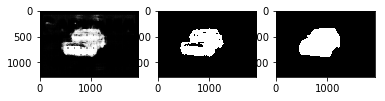

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
791 0.0922447


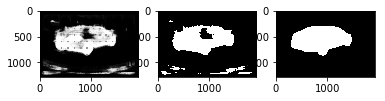

792 0.0876014


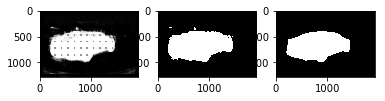

793 0.084146


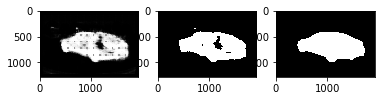

794 0.0844074


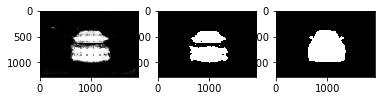

795 0.102592


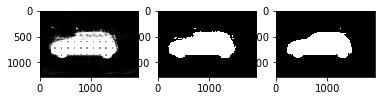

796 0.104437


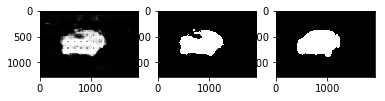

797 0.111874


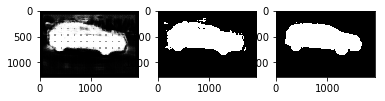

798 0.120633


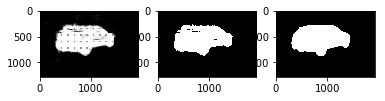

799 0.0998487


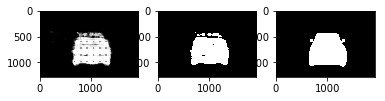

800 0.0933978


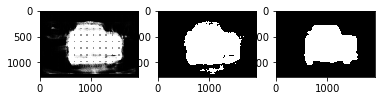

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
801 0.132662


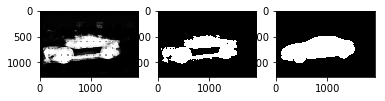

802 0.126203


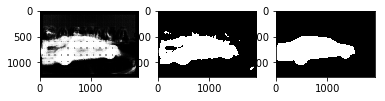

803 0.0969762


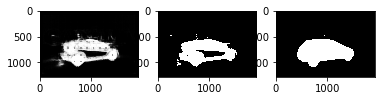

804 0.114905


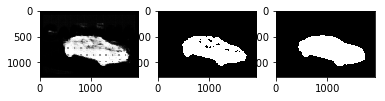

805 0.114611


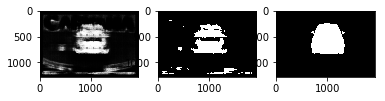

806 0.10707


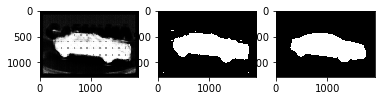

807 0.120832


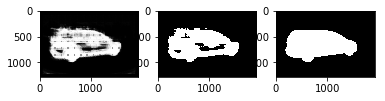

808 0.109219


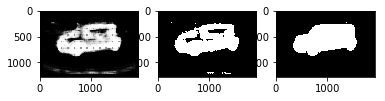

809 0.0922554


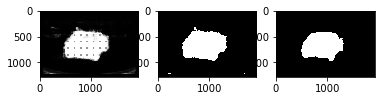

810 0.0954815


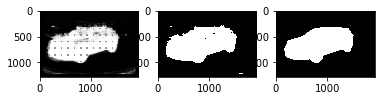

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
811 0.0904129


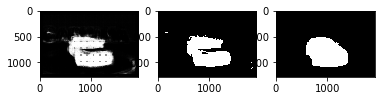

812 0.101462


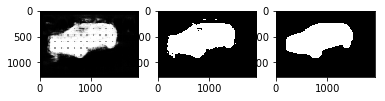

813 0.0970442


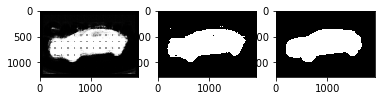

814 0.100641


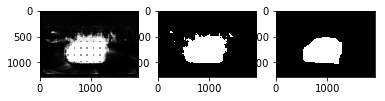

815 0.088744


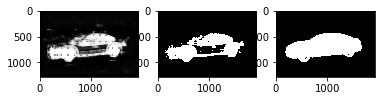

816 0.108826


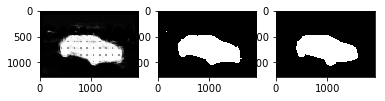

817 0.0995291


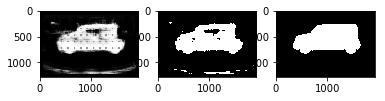

818 0.135917


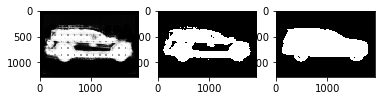

819 0.107564


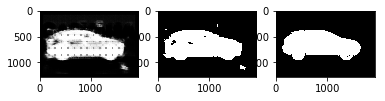

820 0.0970817


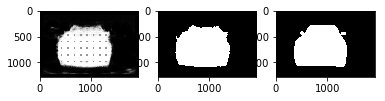

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
821 0.0991526


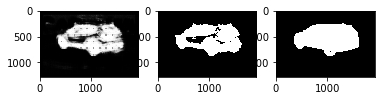

822 0.0985162


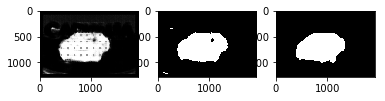

823 0.11264


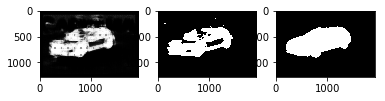

824 0.0902179


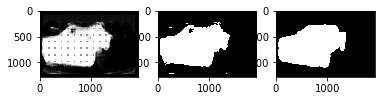

825 0.0770197


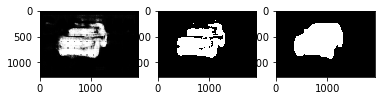

826 0.0849845


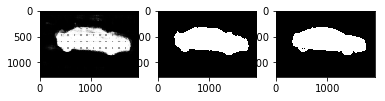

827 0.0907263


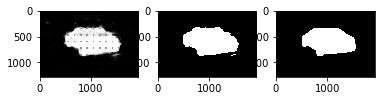

828 0.0853899


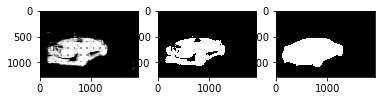

829 0.0862906


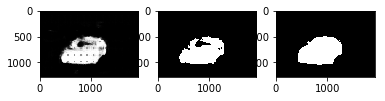

830 0.115848


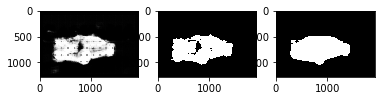

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
831 0.139732


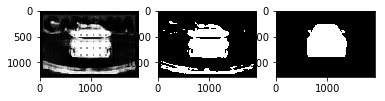

832 0.123018


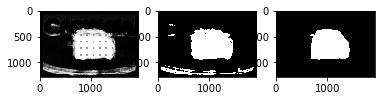

833 0.101712


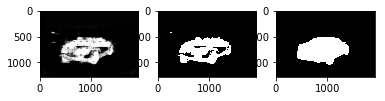

834 0.10545


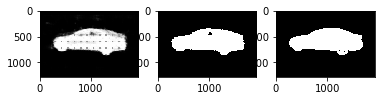

835 0.104564


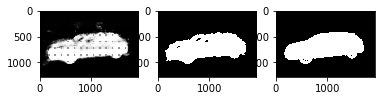

836 0.106064


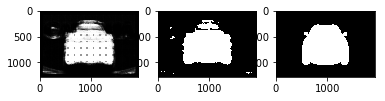

837 0.115396


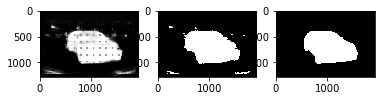

838 0.0903736


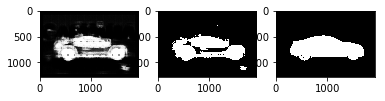

839 0.10368


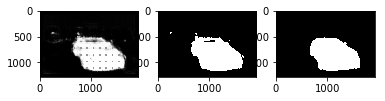

840 0.0951366


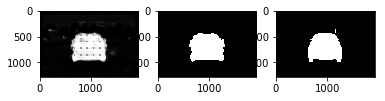

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
841 0.0891632


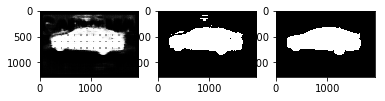

842 0.109707


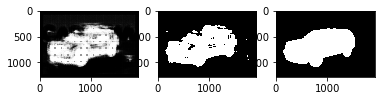

843 0.101908


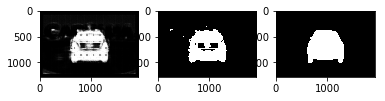

844 0.0889812


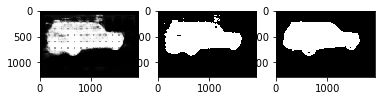

845 0.0747195


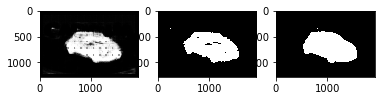

846 0.100257


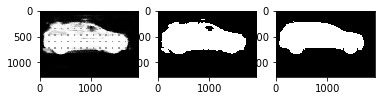

847 0.113097


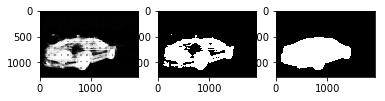

848 0.0940044


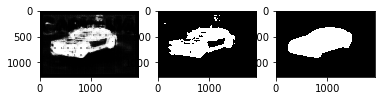

849 0.0887506


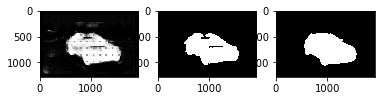

850 0.0789566


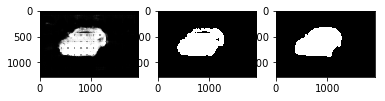

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
851 0.0839525


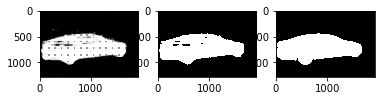

852 0.0839075


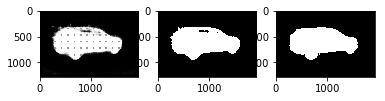

853 0.0809729


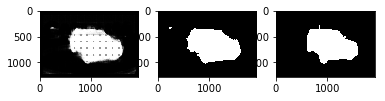

854 0.121764


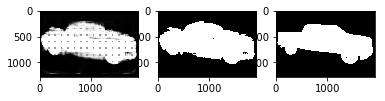

855 0.0965225


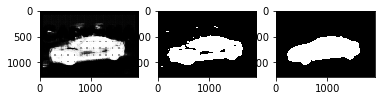

856 0.102608


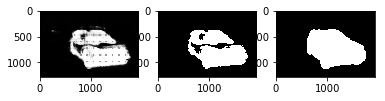

857 0.111379


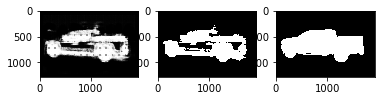

858 0.0988593


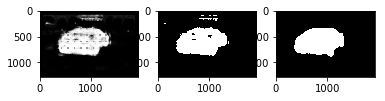

859 0.0886029


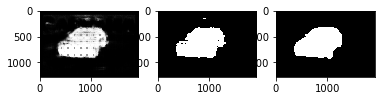

860 0.0942575


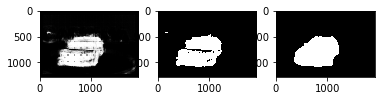

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
861 0.0834556


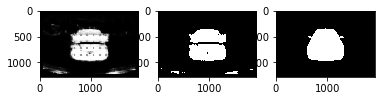

862 0.0961542


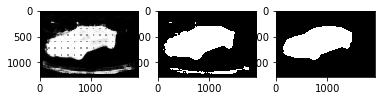

863 0.0930936


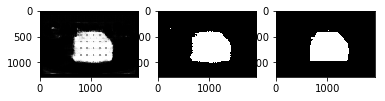

864 0.0884516


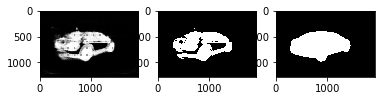

865 0.0869424


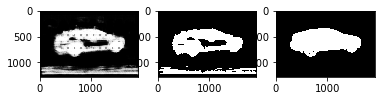

866 0.0956365


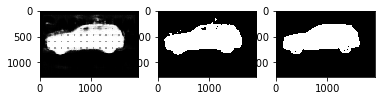

867 0.100921


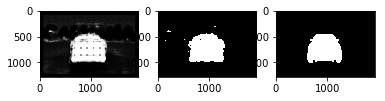

868 0.0925396


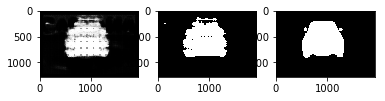

869 0.0962929


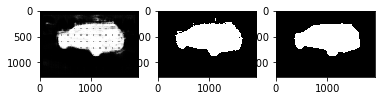

870 0.0766165


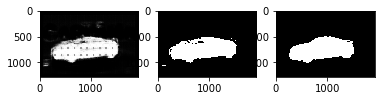

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
871 0.0796834


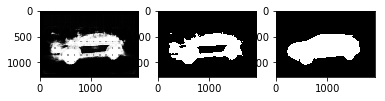

872 0.11118


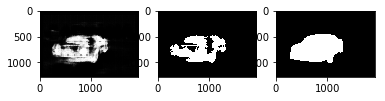

873 0.0842762


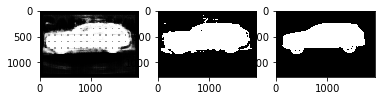

874 0.11956


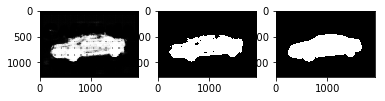

875 0.0874444


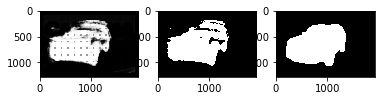

876 0.0960709


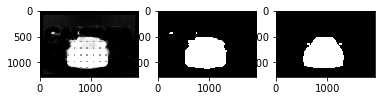

877 0.0998381


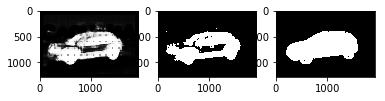

878 0.10681


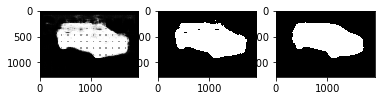

879 0.118294


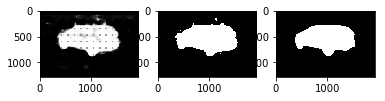

880 0.0876343


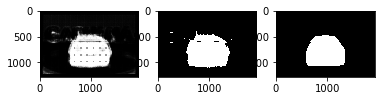

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
881 0.0987228


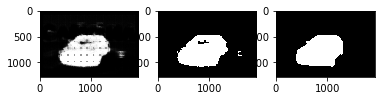

882 0.0765946


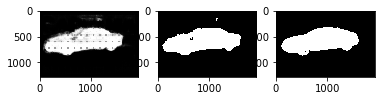

883 0.106783


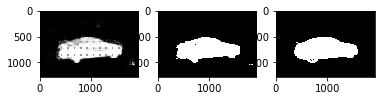

884 0.107109


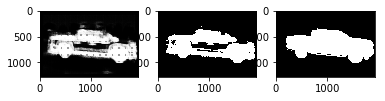

885 0.128591


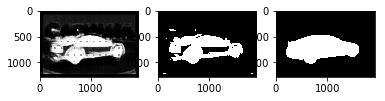

886 0.102199


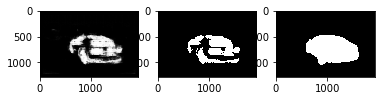

887 0.0847327


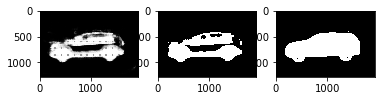

888 0.188354


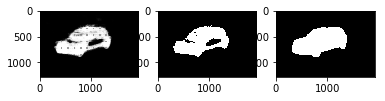

889 0.116613


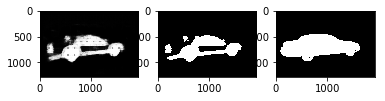

890 0.14115


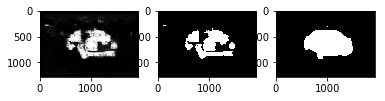

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
891 0.151605


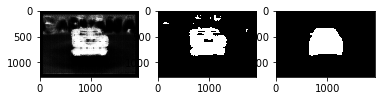

892 0.116141


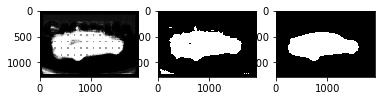

893 0.135057


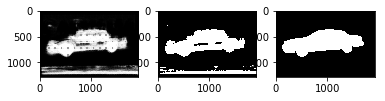

894 0.12739


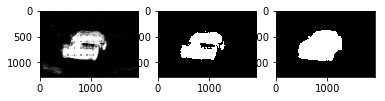

895 0.12543


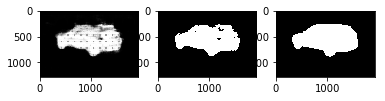

896 0.121413


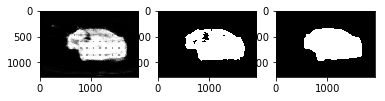

897 0.106037


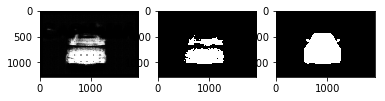

898 0.101455


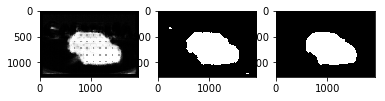

899 0.113948


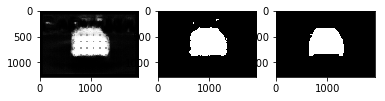

900 0.12769


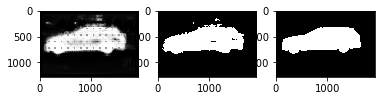

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
901 0.101677


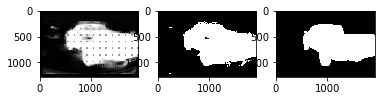

902 0.0989182


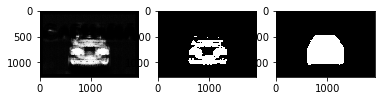

903 0.127912


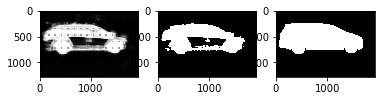

904 0.106095


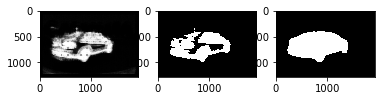

905 0.135704


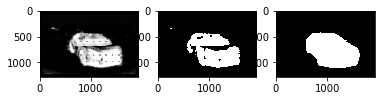

906 0.081385


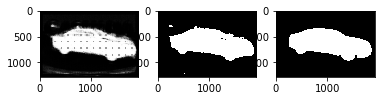

907 0.107923


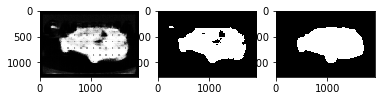

908 0.12307


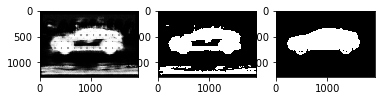

909 0.115031


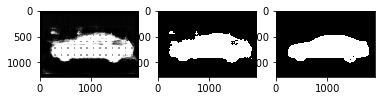

910 0.0879126


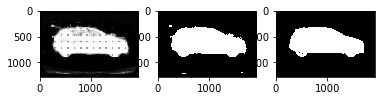

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
911 0.12636


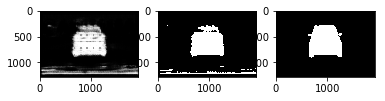

912 0.0807524


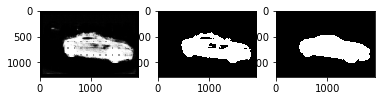

913 0.11487


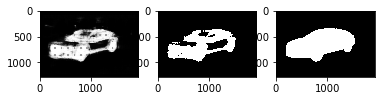

914 0.0885013


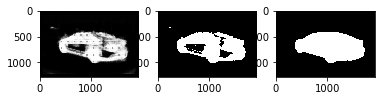

915 0.0854081


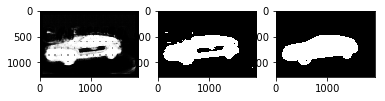

916 0.0940546


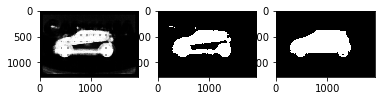

917 0.0728357


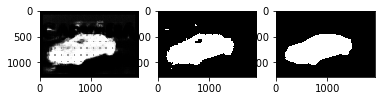

918 0.0807297


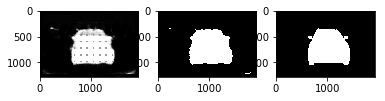

919 0.10365


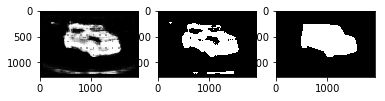

920 0.0753541


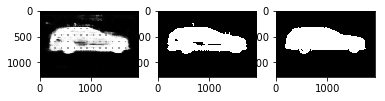

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
921 0.0876971


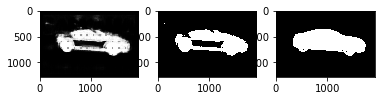

922 0.100823


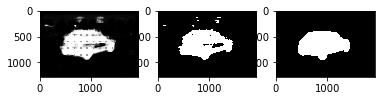

923 0.0809608


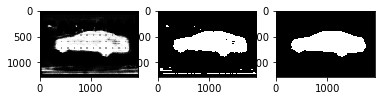

924 0.0693055


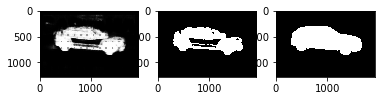

925 0.0845493


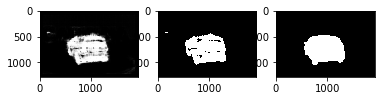

926 0.0705602


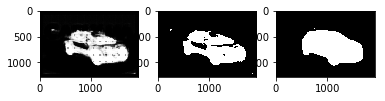

927 0.0679654


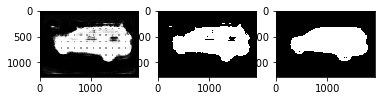

928 0.0989993


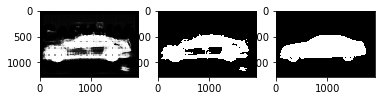

929 0.110866


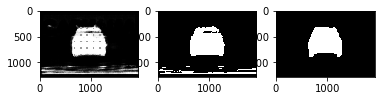

930 0.0817824


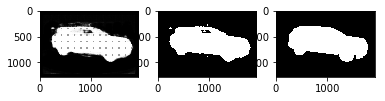

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
931 0.0894343


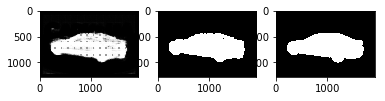

932 0.0980077


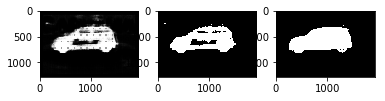

933 0.0748518


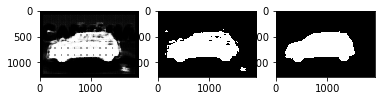

934 0.0873411


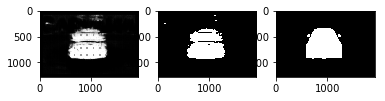

935 0.080842


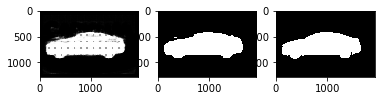

936 0.0784013


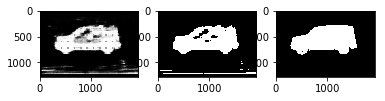

937 0.0931223


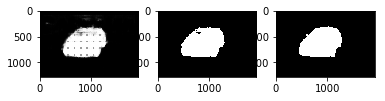

938 0.113758


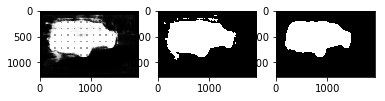

939 0.109993


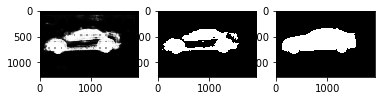

940 0.129615


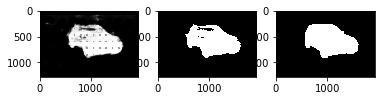

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
941 0.0960667


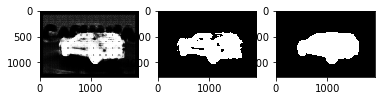

942 0.116556


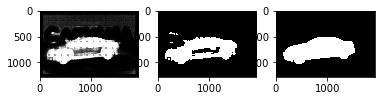

943 0.0931677


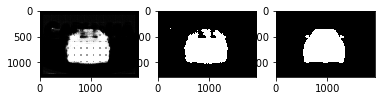

944 0.103045


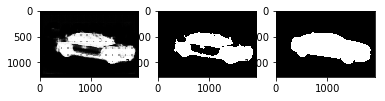

945 0.119785


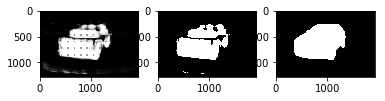

946 0.130911


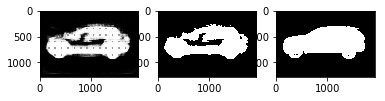

947 0.107043


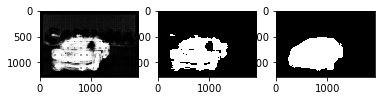

948 0.121103


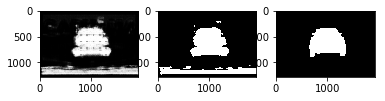

949 0.111721


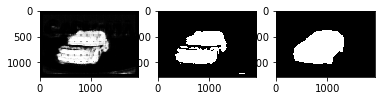

950 0.118019


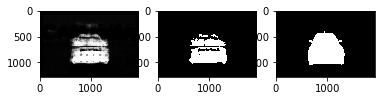

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
951 0.100426


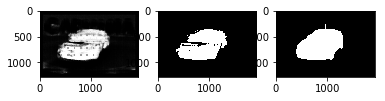

952 0.101985


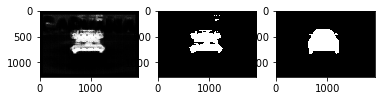

953 0.108827


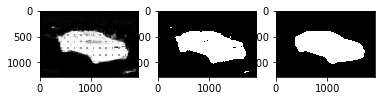

954 0.126877


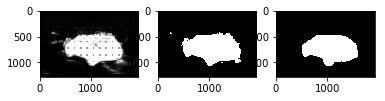

955 0.0842423


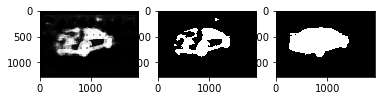

956 0.109371


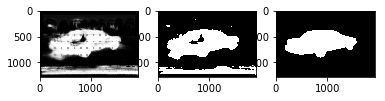

957 0.0982041


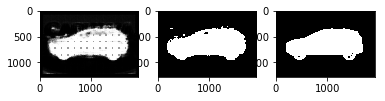

958 0.0784299


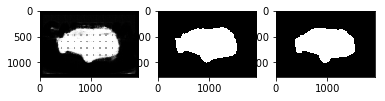

959 0.12648


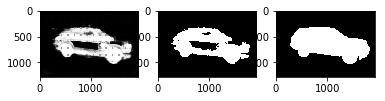

960 0.0925928


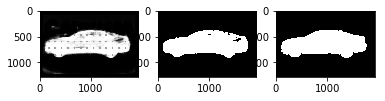

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
961 0.11871


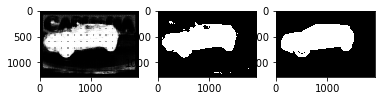

962 0.11749


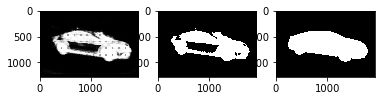

963 0.101333


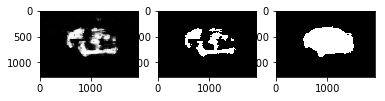

964 0.109862


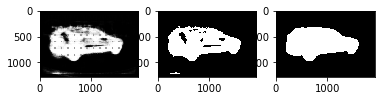

965 0.0940322


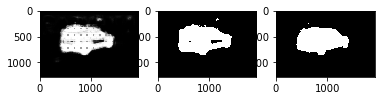

966 0.0888295


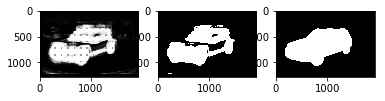

967 0.106373


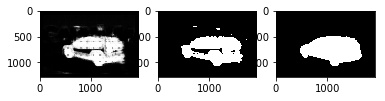

968 0.10808


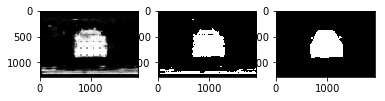

969 0.0929585


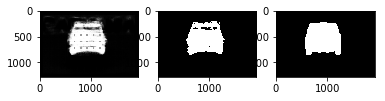

970 0.102559


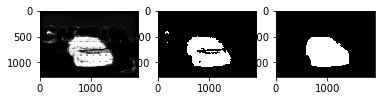

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
971 0.134467


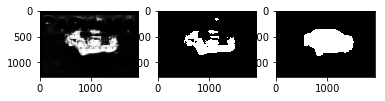

972 0.107329


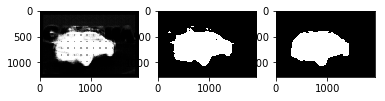

973 0.0952413


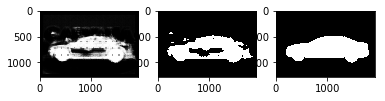

974 0.0908194


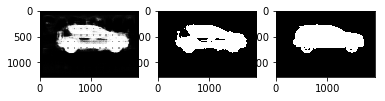

975 0.12563


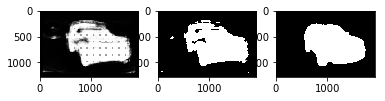

976 0.118753


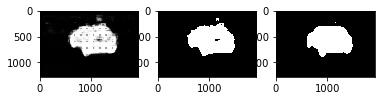

977 0.109536


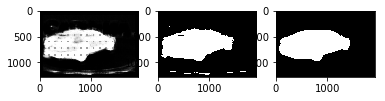

978 0.103971


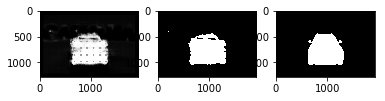

979 0.0954343


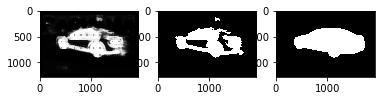

980 0.0900552


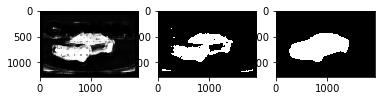

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
981 0.0903462


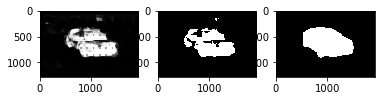

982 0.0925835


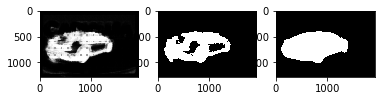

983 0.0852023


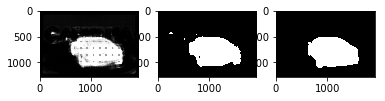

984 0.0929172


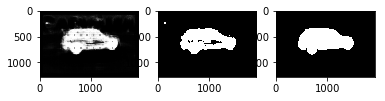

985 0.0871773


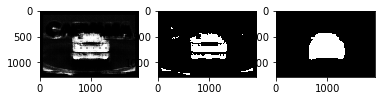

986 0.0936186


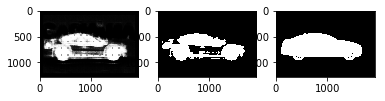

987 0.0710276


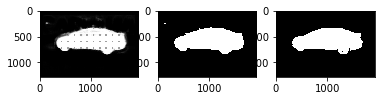

988 0.0942754


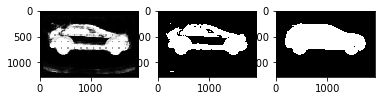

989 0.095278


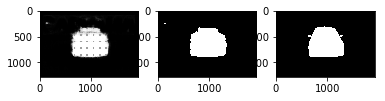

990 0.0758622


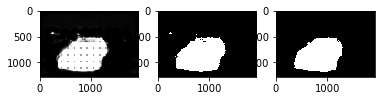

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
991 0.0895328


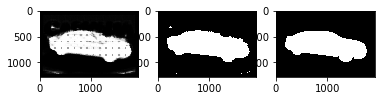

992 0.0861174


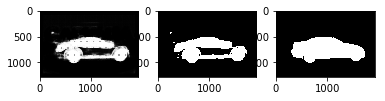

993 0.0746292


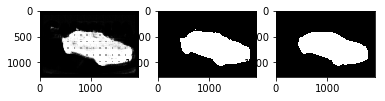

994 0.0663357


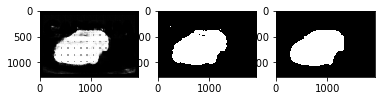

995 0.0825002


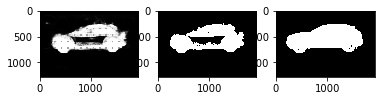

996 0.067572


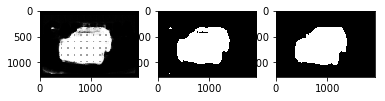

997 0.105331


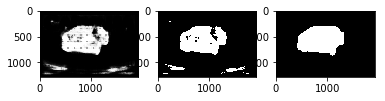

998 0.0825528


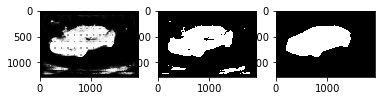

999 0.0832494


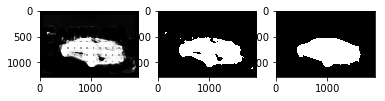

1000 0.0968275


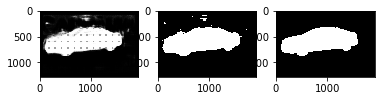

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1001 0.0701348


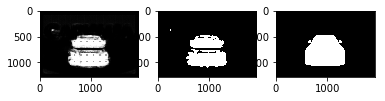

1002 0.0850173


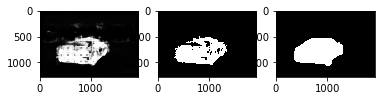

1003 0.0704087


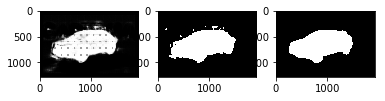

1004 0.0882702


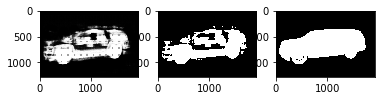

1005 0.103551


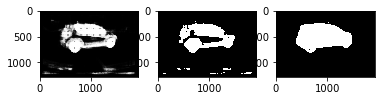

1006 0.101616


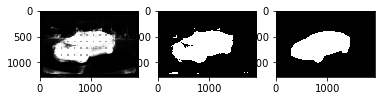

1007 0.0880284


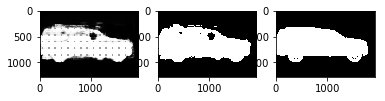

1008 0.101499


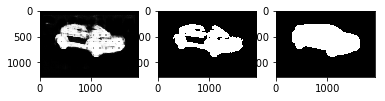

1009 0.103601


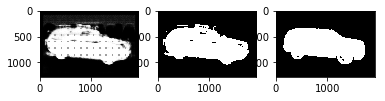

1010 0.122521


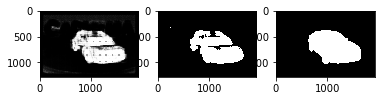

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1011 0.101796


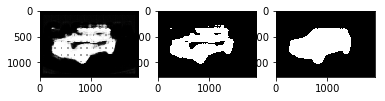

1012 0.11526


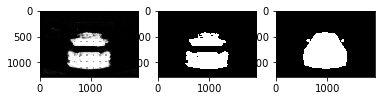

1013 0.107487


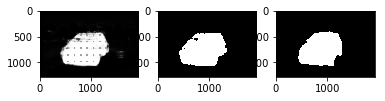

1014 0.0964493


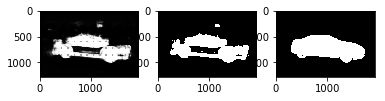

1015 0.0817742


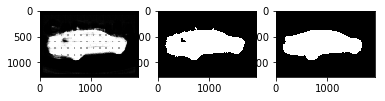

1016 0.0845784


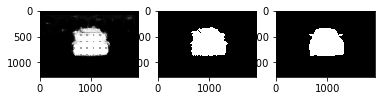

1017 0.130802


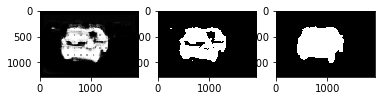

1018 0.0964318


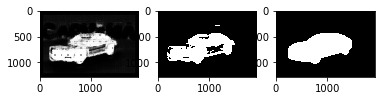

1019 0.0889291


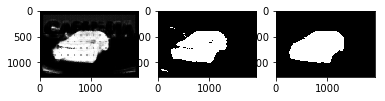

1020 0.110788


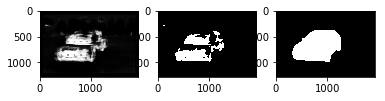

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1021 0.104805


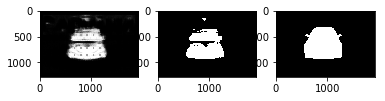

1022 0.0805096


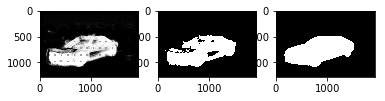

1023 0.0954793


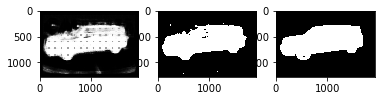

1024 0.118889


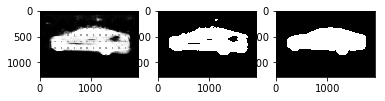

1025 0.0982512


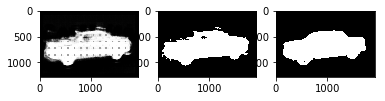

1026 0.09663


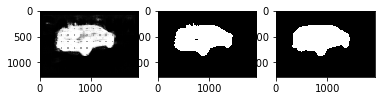

1027 0.0874888


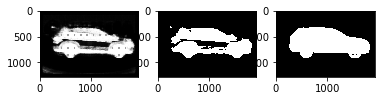

1028 0.0894519


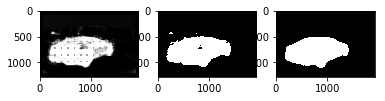

1029 0.0812837


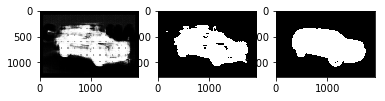

1030 0.0724928


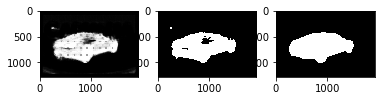

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1031 0.0982389


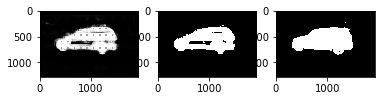

1032 0.0849924


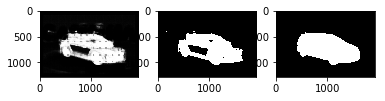

1033 0.0999677


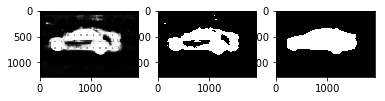

1034 0.106474


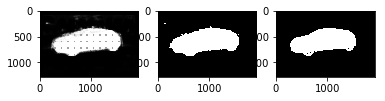

1035 0.0811618


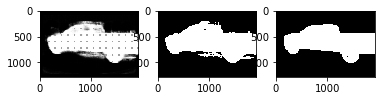

1036 0.101407


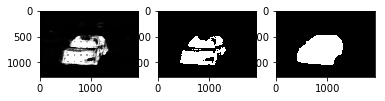

1037 0.0891748


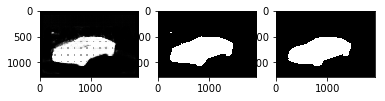

1038 0.090621


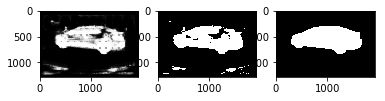

1039 0.0902892


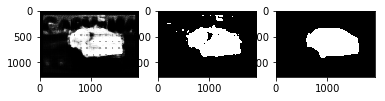

1040 0.086604


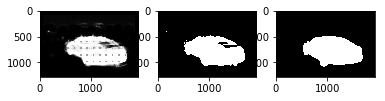

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1041 0.108918


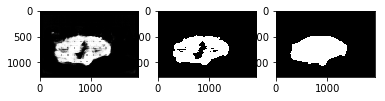

1042 0.103506


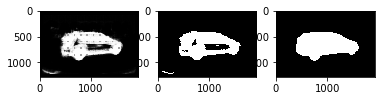

1043 0.0874314


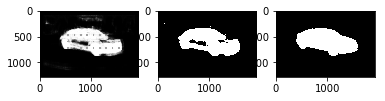

1044 0.102414


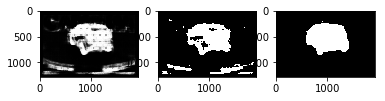

1045 0.0674022


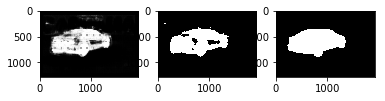

1046 0.0840998


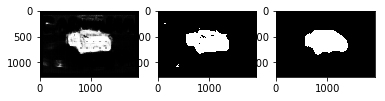

1047 0.0839591


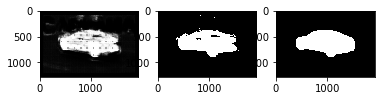

1048 0.0770336


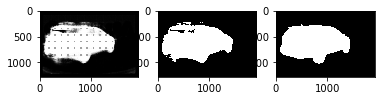

1049 0.0575662


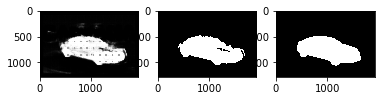

1050 0.0620599


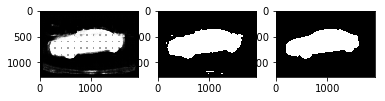

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1051 0.064522


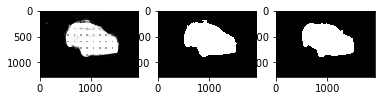

1052 0.0612833


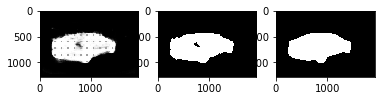

1053 0.0954148


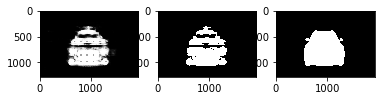

1054 0.0820059


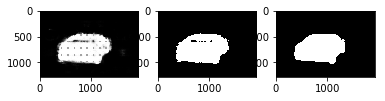

1055 0.0801743


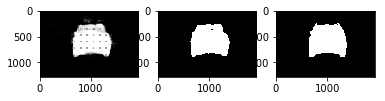

1056 0.0842725


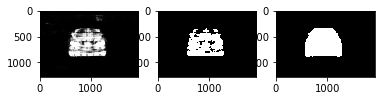

1057 0.0698995


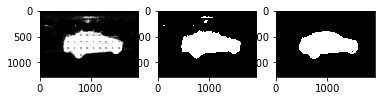

1058 0.0849339


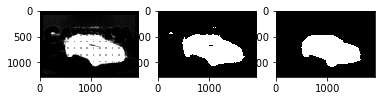

1059 0.0816265


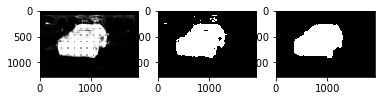

1060 0.069661


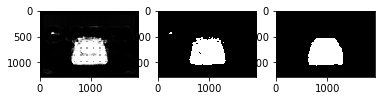

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1061 0.0982292


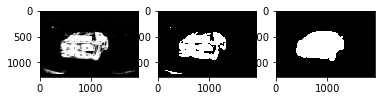

1062 0.0833454


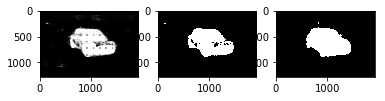

1063 0.0968261


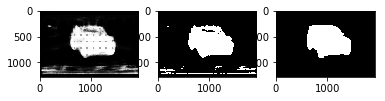

1064 0.0718005


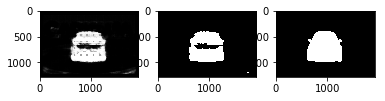

1065 0.0618661


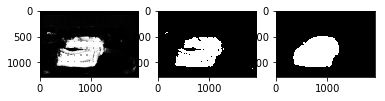

1066 0.0897579


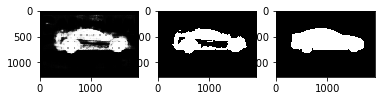

1067 0.0848022


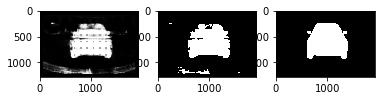

1068 0.0920842


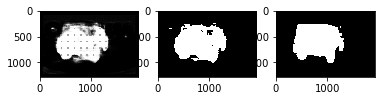

1069 0.0658886


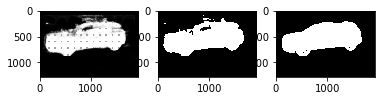

1070 0.08723


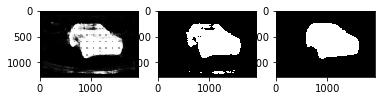

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1071 0.0810514


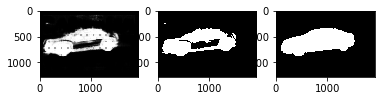

1072 0.0682525


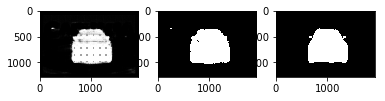

1073 0.0805122


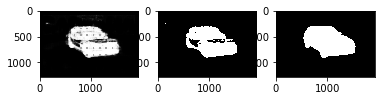

1074 0.077289


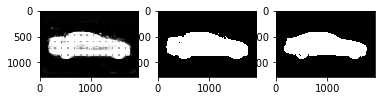

1075 0.0644044


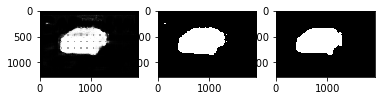

1076 0.0747138


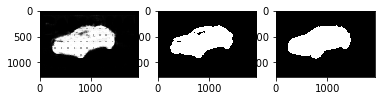

1077 0.0716288


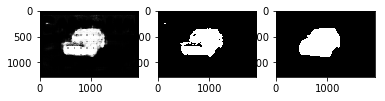

1078 0.0862164


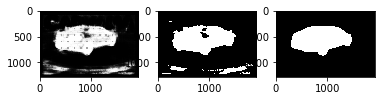

1079 0.0691667


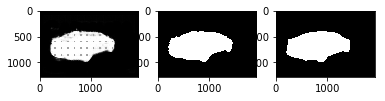

1080 0.104523


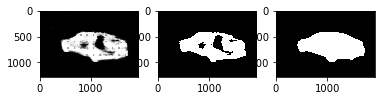

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1081 0.0806145


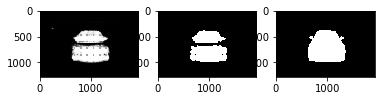

1082 0.0927104


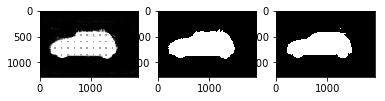

1083 0.103163


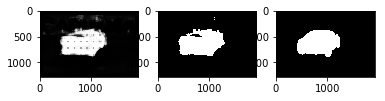

1084 0.109096


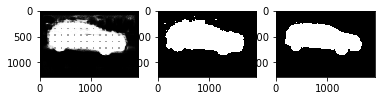

1085 0.0868786


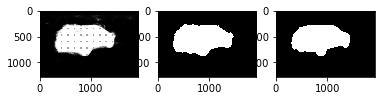

1086 0.0850707


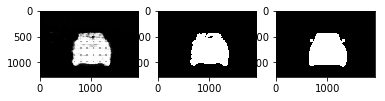

1087 0.106596


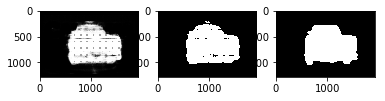

1088 0.137964


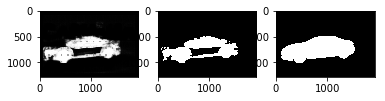

1089 0.102097


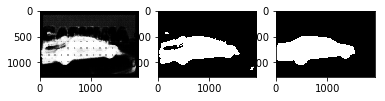

1090 0.123505


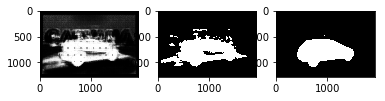

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1091 0.0749343


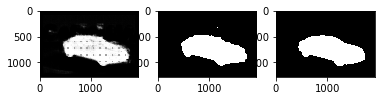

1092 0.0902473


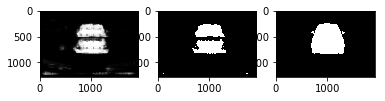

1093 0.105562


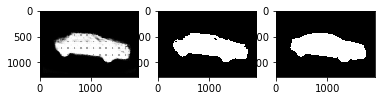

1094 0.157222


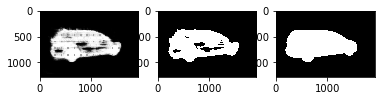

1095 0.122874


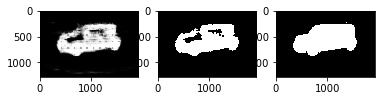

1096 0.0809191


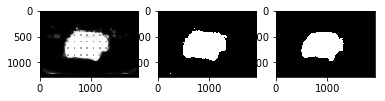

1097 0.108964


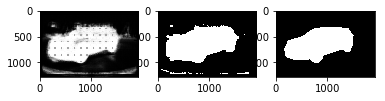

1098 0.0840809


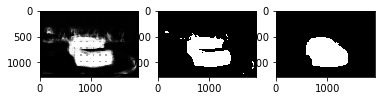

1099 0.0957292


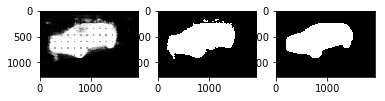

1100 0.0846732


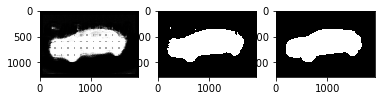

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1101 0.0965661


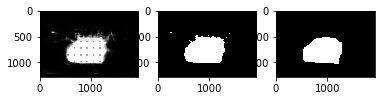

1102 0.0830809


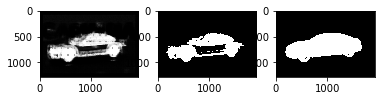

1103 0.101046


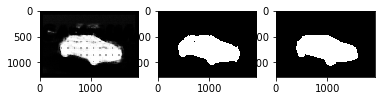

1104 0.0910987


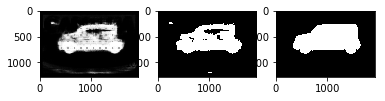

1105 0.128248


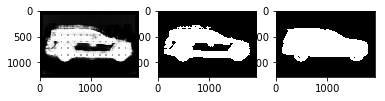

1106 0.100852


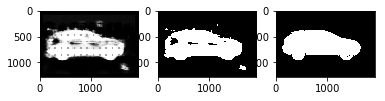

1107 0.0906031


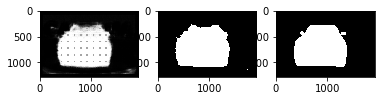

1108 0.0823923


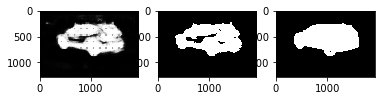

1109 0.0896854


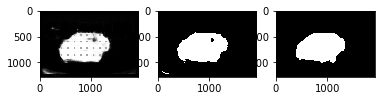

1110 0.110738


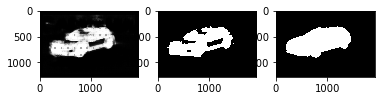

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1111 0.0772325


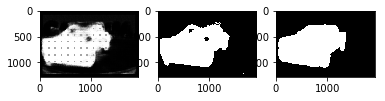

1112 0.0747781


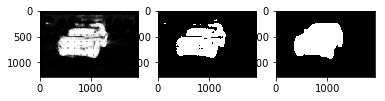

1113 0.0819359


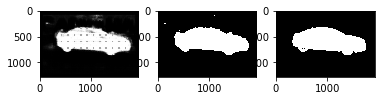

1114 0.0722446


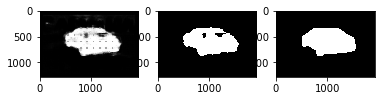

1115 0.0714657


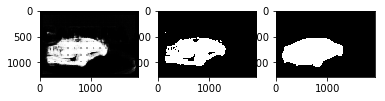

1116 0.0677183


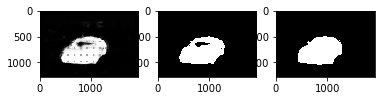

1117 0.103234


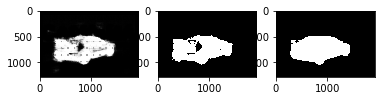

1118 0.0984227


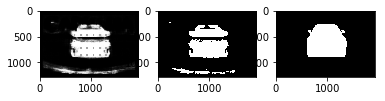

1119 0.106254


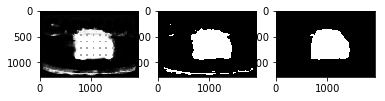

1120 0.0756789


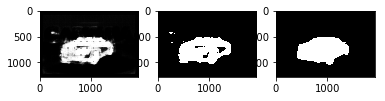

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1121 0.0809032


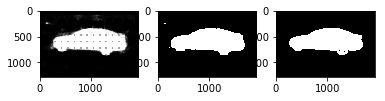

1122 0.0839203


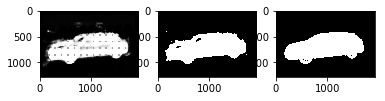

1123 0.0851522


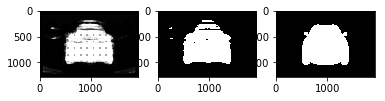

1124 0.0907187


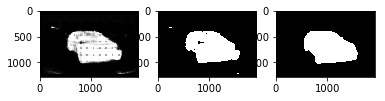

1125 0.0734271


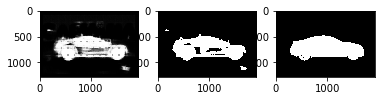

1126 0.0872485


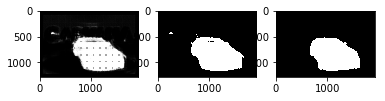

1127 0.0793622


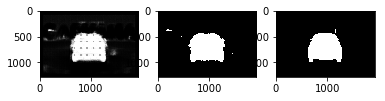

1128 0.0707167


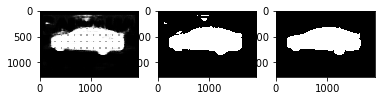

1129 0.093312


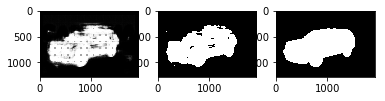

1130 0.0834261


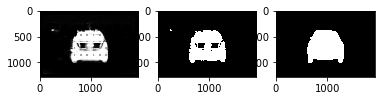

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1131 0.0710653


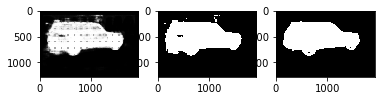

1132 0.0594795


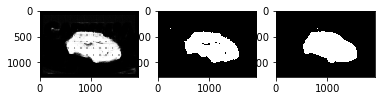

1133 0.0747912


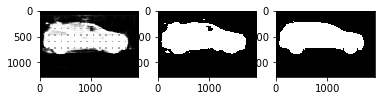

1134 0.0904478


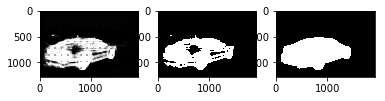

1135 0.0652312


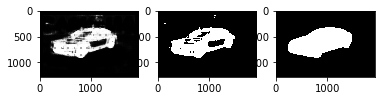

1136 0.0855664


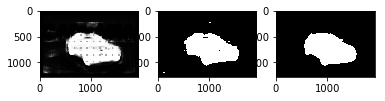

1137 0.0639404


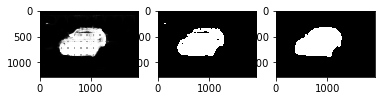

1138 0.0815697


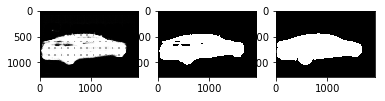

1139 0.08114


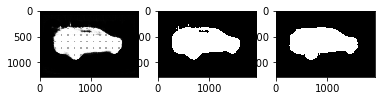

1140 0.0716379


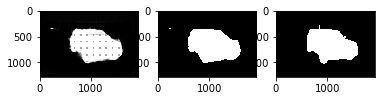

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1141 0.120966


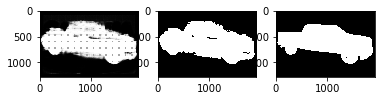

1142 0.108409


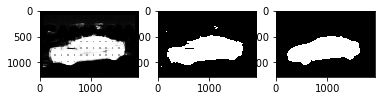

1143 0.0941831


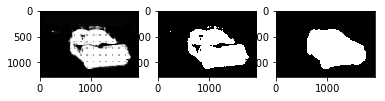

1144 0.101299


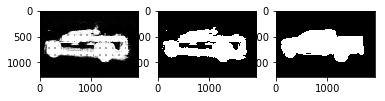

1145 0.0900502


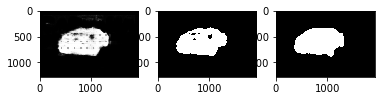

1146 0.0869641


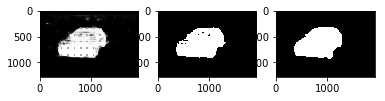

1147 0.0891059


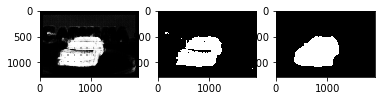

1148 0.0881389


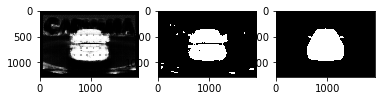

1149 0.0831216


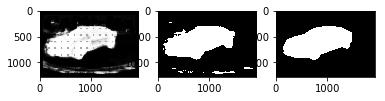

1150 0.0844238


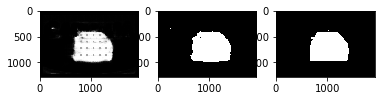

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1151 0.0780578


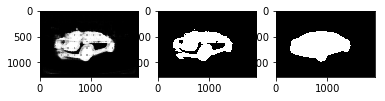

1152 0.0789321


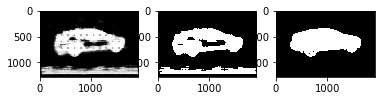

1153 0.0992431


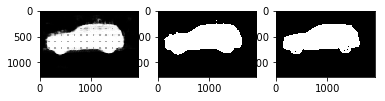

1154 0.099184


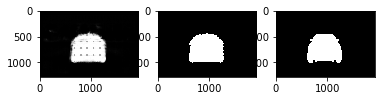

1155 0.0821965


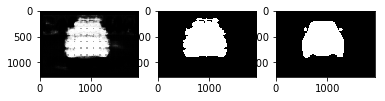

1156 0.0905481


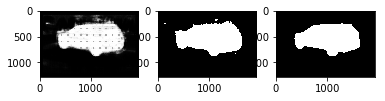

1157 0.067915


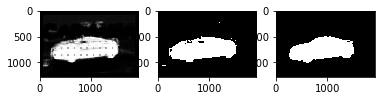

1158 0.0888883


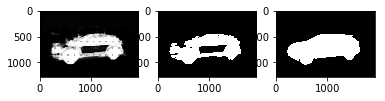

1159 0.111384


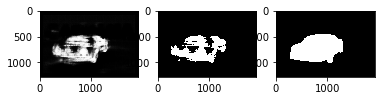

1160 0.0698473


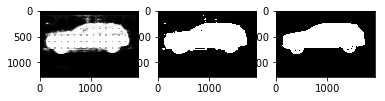

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1161 0.0822878


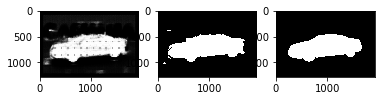

1162 0.0795417


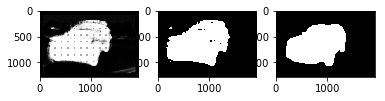

1163 0.0688368


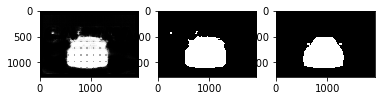

1164 0.0892691


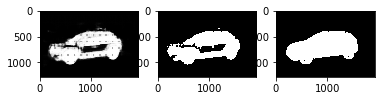

1165 0.0923516


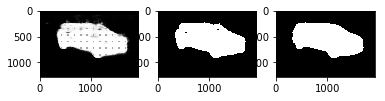

1166 0.0920832


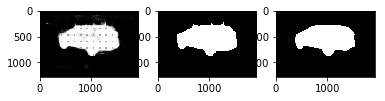

1167 0.0686211


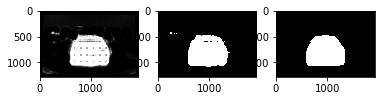

1168 0.0860299


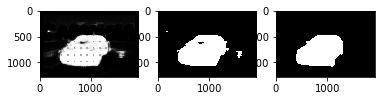

1169 0.0644727


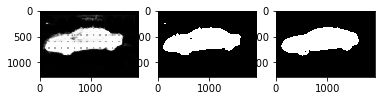

1170 0.0797506


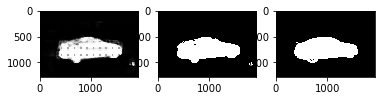

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1171 0.0960463


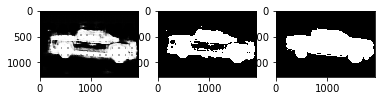

1172 0.0691063


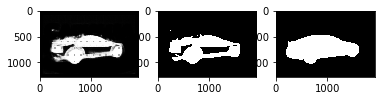

1173 0.0696952


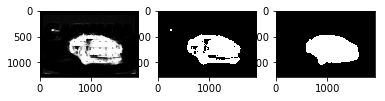

1174 0.0695787


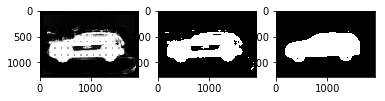

1175 0.0929025


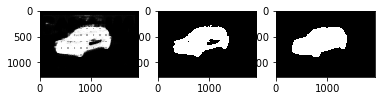

1176 0.0778566


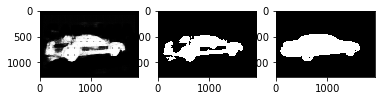

1177 0.083815


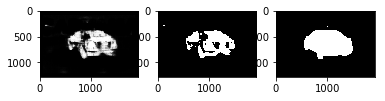

1178 0.0791787


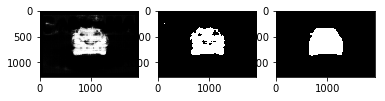

1179 0.074056


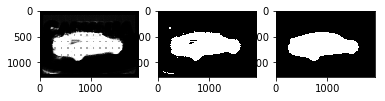

1180 0.0940384


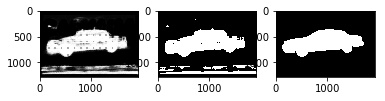

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1181 0.0663979


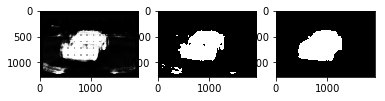

1182 0.0677276


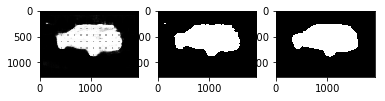

1183 0.0799574


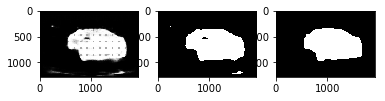

1184 0.074001


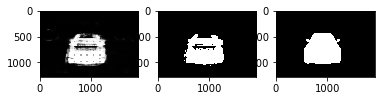

1185 0.0681082


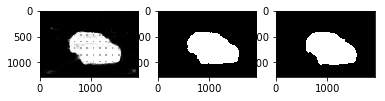

1186 0.0675327


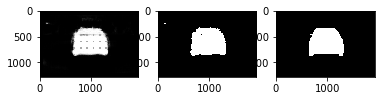

1187 0.0853769


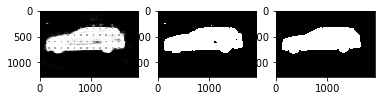

1188 0.0722868


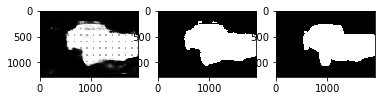

1189 0.0797249


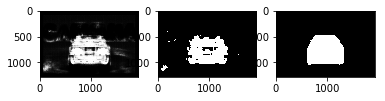

1190 0.0948655


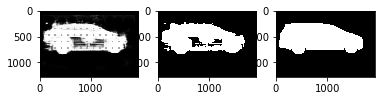

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1191 0.0765295


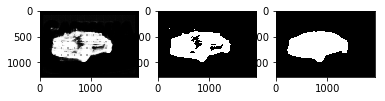

1192 0.100835


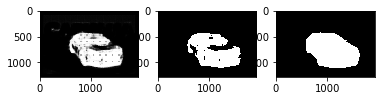

1193 0.0626664


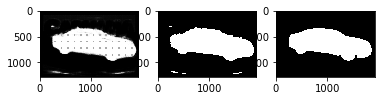

1194 0.0731828


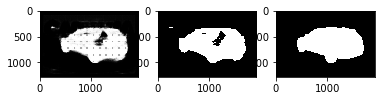

1195 0.0937409


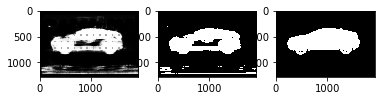

1196 0.0831335


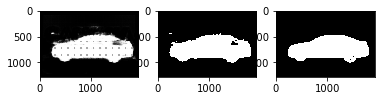

1197 0.0617822


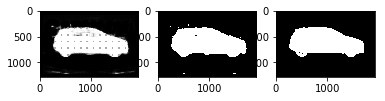

1198 0.0847143


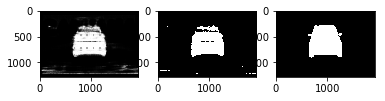

1199 0.0604067


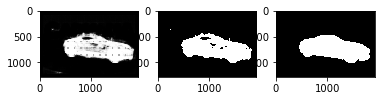

1200 0.0819359


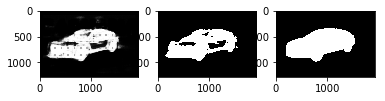

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1201 0.063156


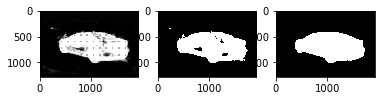

1202 0.0650394


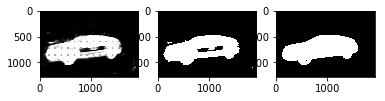

1203 0.0655503


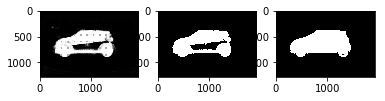

1204 0.0540349


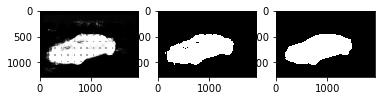

1205 0.0692147


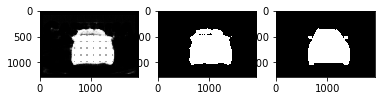

1206 0.0694844


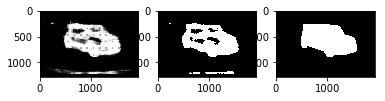

1207 0.0556132


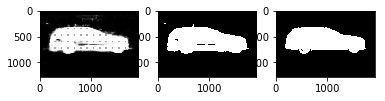

1208 0.0682692


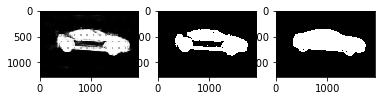

1209 0.0769318


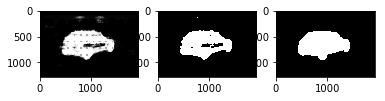

1210 0.0741548


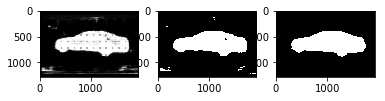

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1211 0.0787535


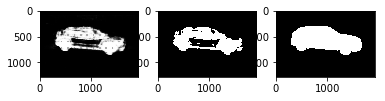

1212 0.102848


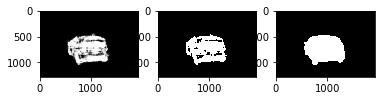

1213 0.0620687


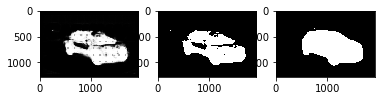

1214 0.0928272


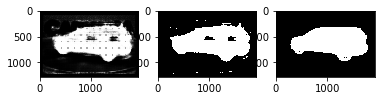

1215 0.085903


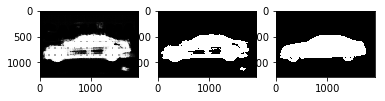

1216 0.115498


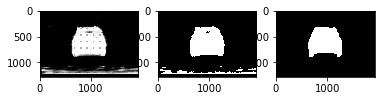

1217 0.0775316


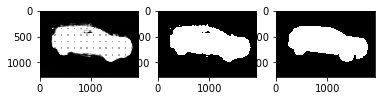

1218 0.0830479


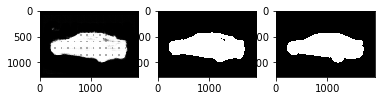

1219 0.0969378


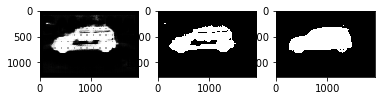

1220 0.0890573


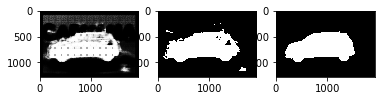

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1221 0.0863473


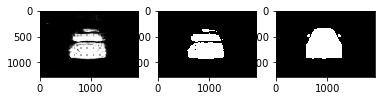

1222 0.10031


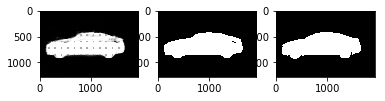

1223 0.0774161


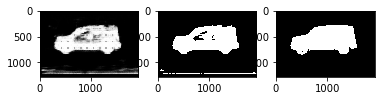

1224 0.0931412


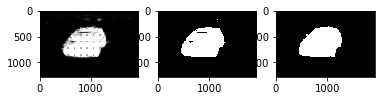

1225 0.100565


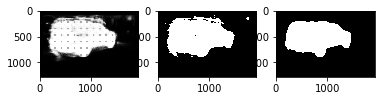

1226 0.119953


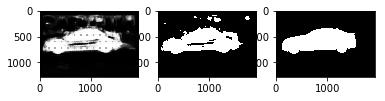

1227 0.101146


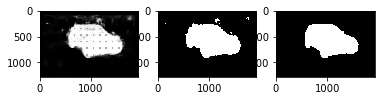

1228 0.0697939


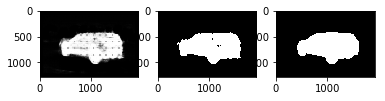

1229 0.0962861


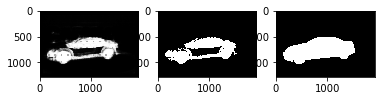

1230 0.088369


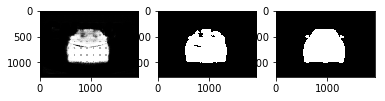

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1231 0.0934406


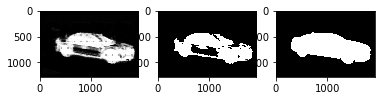

1232 0.0831751


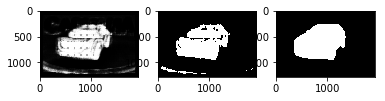

1233 0.113723


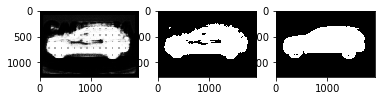

1234 0.08705


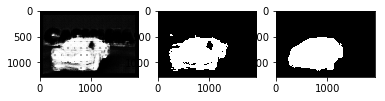

1235 0.0904821


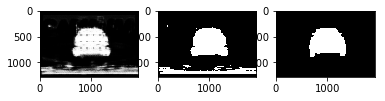

1236 0.084105


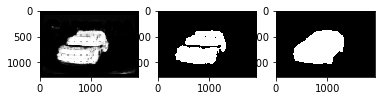

1237 0.0991233


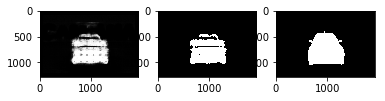

1238 0.0833326


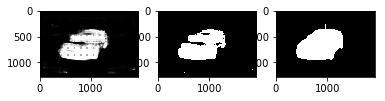

1239 0.0735225


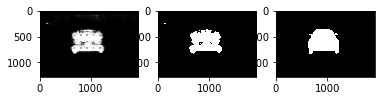

1240 0.0794223


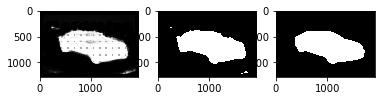

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1241 0.0995667


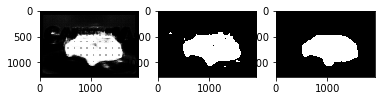

1242 0.0718103


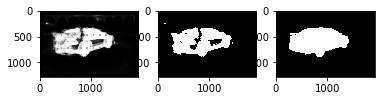

1243 0.080538


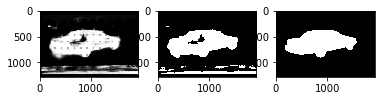

1244 0.0714113


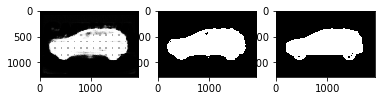

1245 0.0627674


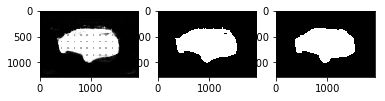

1246 0.0977157


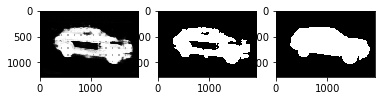

1247 0.0648086


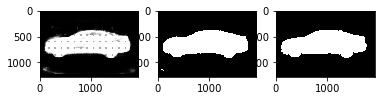

1248 0.0793732


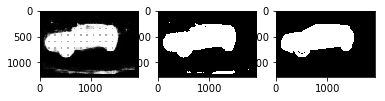

1249 0.0821383


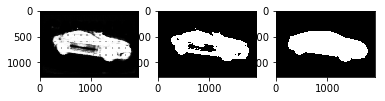

1250 0.0658683


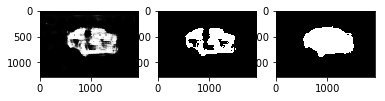

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1251 0.0731731


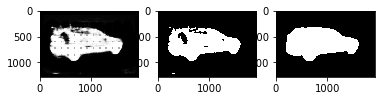

1252 0.0693163


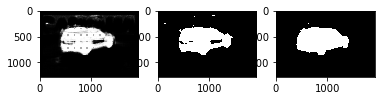

1253 0.0614801


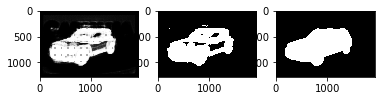

1254 0.063168


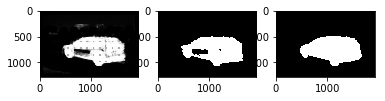

1255 0.076007


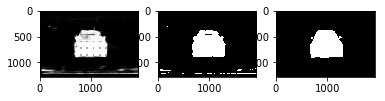

1256 0.0648563


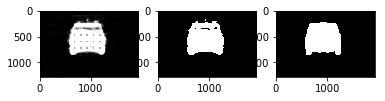

1257 0.0693968


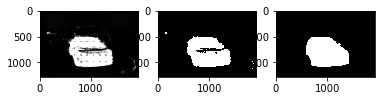

1258 0.0947541


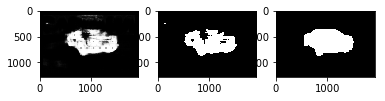

1259 0.0802334


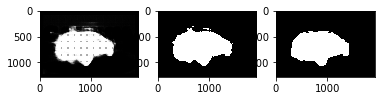

1260 0.0694375


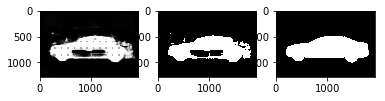

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1261 0.0688819


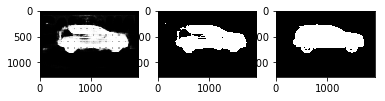

1262 0.0912486


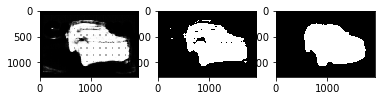

1263 0.0757498


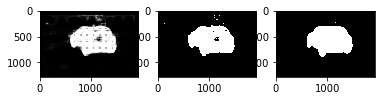

1264 0.0809829


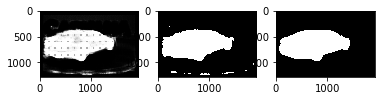

1265 0.0686243


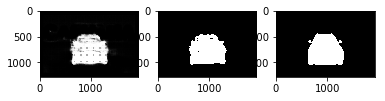

1266 0.0830683


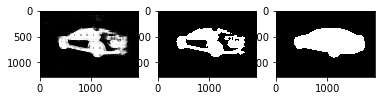

1267 0.0667162


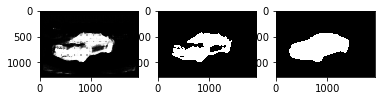

1268 0.0682673


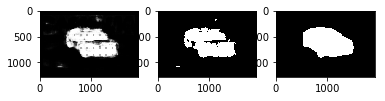

1269 0.0687302


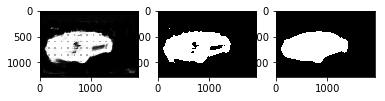

1270 0.0603545


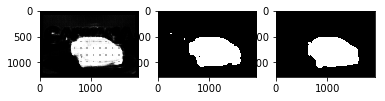

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1271 0.0676798


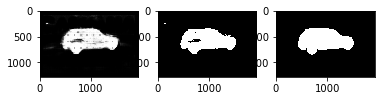

1272 0.0727692


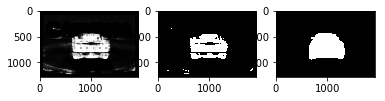

1273 0.0690534


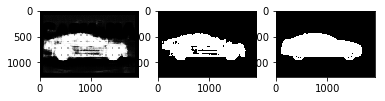

1274 0.0561984


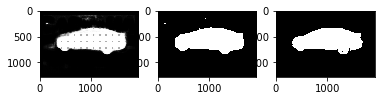

1275 0.0699938


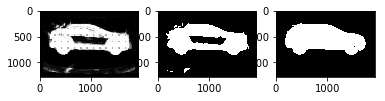

1276 0.0849422


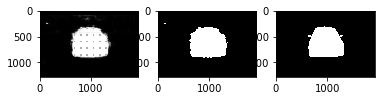

1277 0.0575756


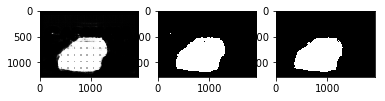

1278 0.0679413


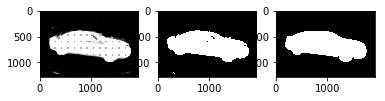

1279 0.0671911


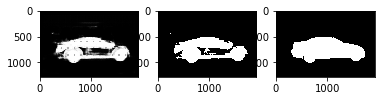

1280 0.0723653


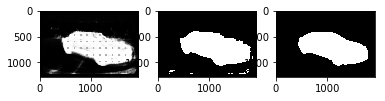

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1281 0.0791733


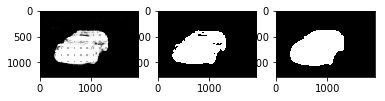

1282 0.145488


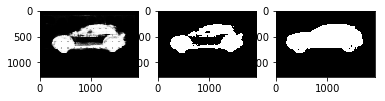

1283 0.0776264


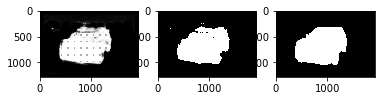

1284 0.128702


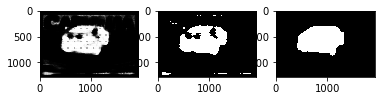

1285 0.111143


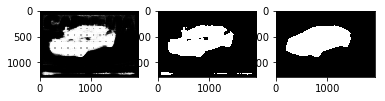

1286 0.0979758


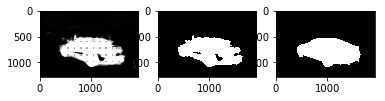

1287 0.124023


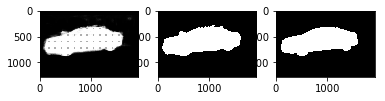

1288 0.0823375


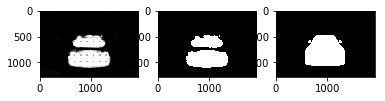

1289 0.0996767


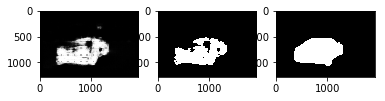

1290 0.0739053


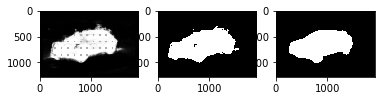

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1291 0.101486


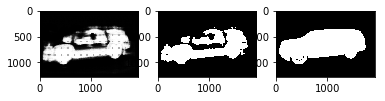

1292 0.105494


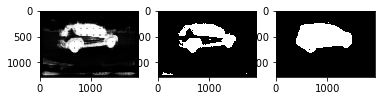

1293 0.0968431


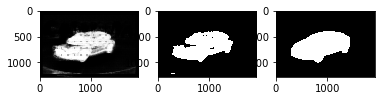

1294 0.0958348


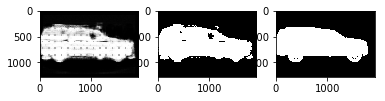

1295 0.0945758


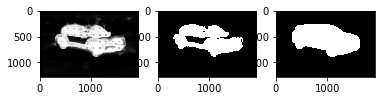

1296 0.0952644


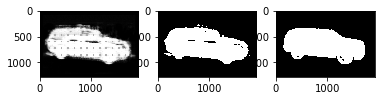

1297 0.113129


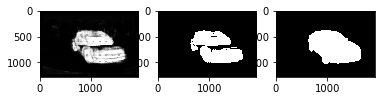

1298 0.0897495


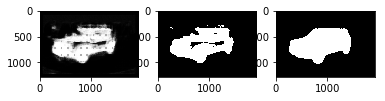

1299 0.105961


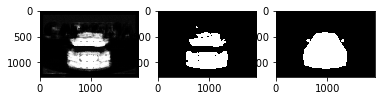

1300 0.105273


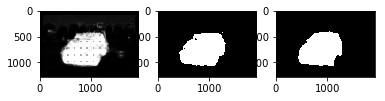

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1301 0.096448


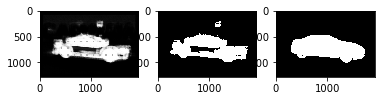

1302 0.0778665


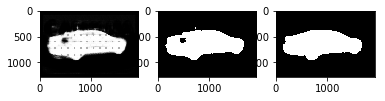

1303 0.0900889


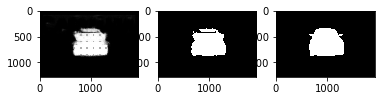

1304 0.143047


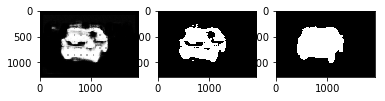

1305 0.0933685


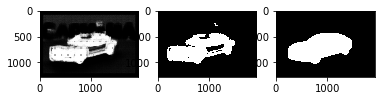

1306 0.0920781


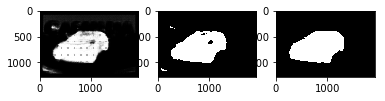

1307 0.110177


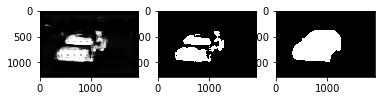

1308 0.10465


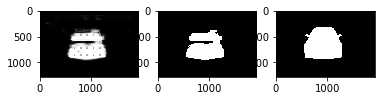

1309 0.0735737


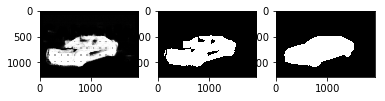

1310 0.0909323


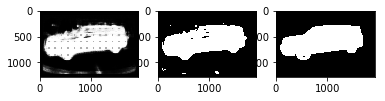

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1311 0.112431


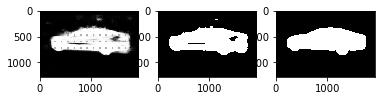

1312 0.0909261


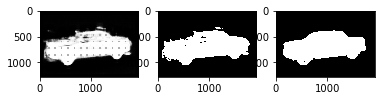

1313 0.0884544


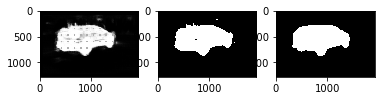

1314 0.084433


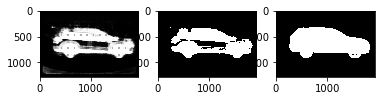

1315 0.0897583


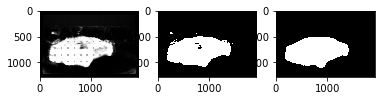

1316 0.0747587


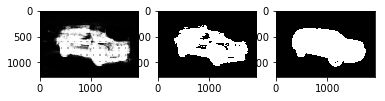

1317 0.0785413


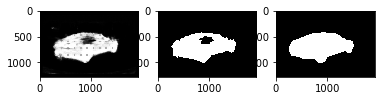

1318 0.0985928


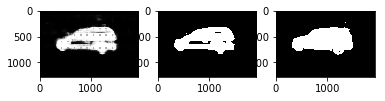

1319 0.077703


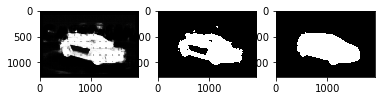

1320 0.130307


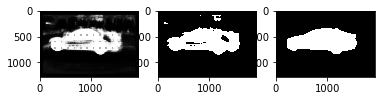

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1321 0.118575


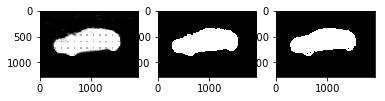

1322 0.110808


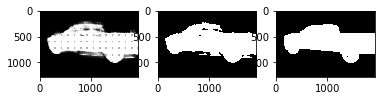

1323 0.152432


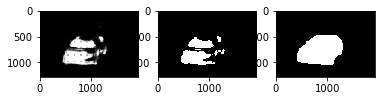

1324 0.122947


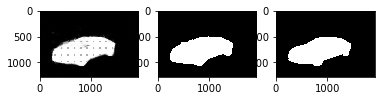

1325 0.112012


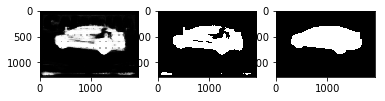

1326 0.103832


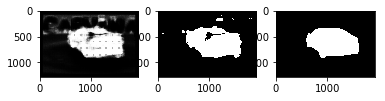

1327 0.141333


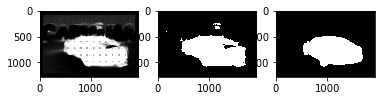

1328 0.12042


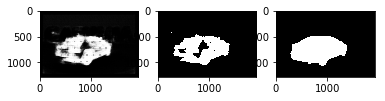

1329 0.110726


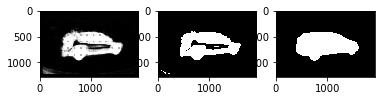

1330 0.103695


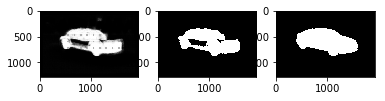

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1331 0.164817


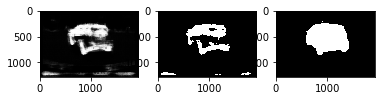

1332 0.083061


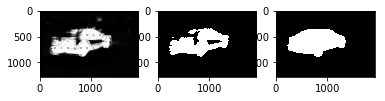

1333 0.0845292


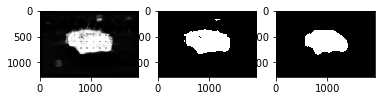

1334 0.105998


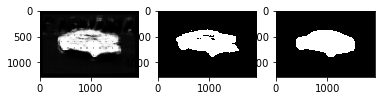

1335 0.117335


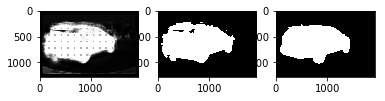

1336 0.0727762


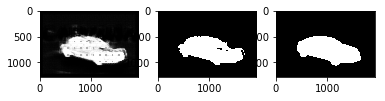

1337 0.0882384


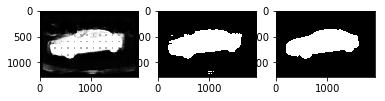

1338 0.0883132


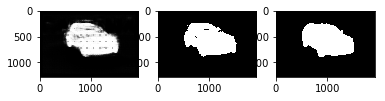

1339 0.0788581


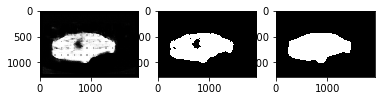

1340 0.110375


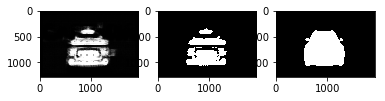

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1341 0.0840528


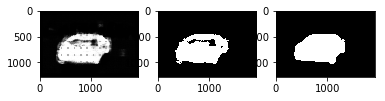

1342 0.107698


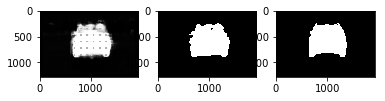

1343 0.122115


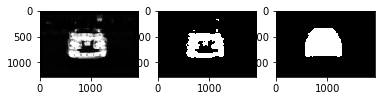

1344 0.0820234


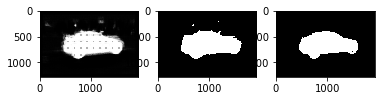

1345 0.0923024


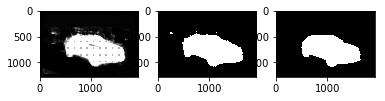

1346 0.0857597


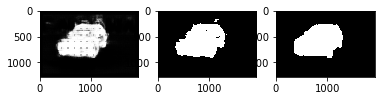

1347 0.087312


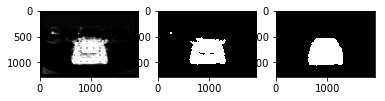

1348 0.104723


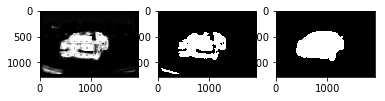

1349 0.100886


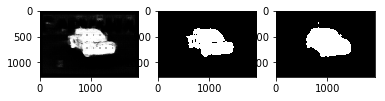

1350 0.109002


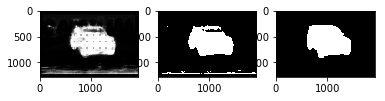

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1351 0.0864193


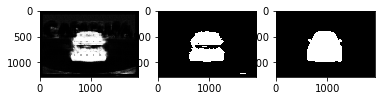

1352 0.0777772


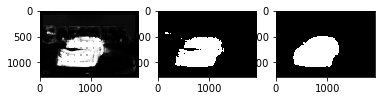

1353 0.0986219


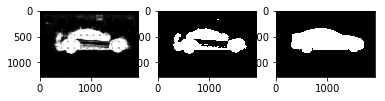

1354 0.09829


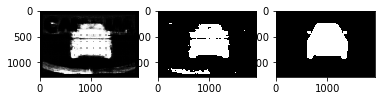

1355 0.0963121


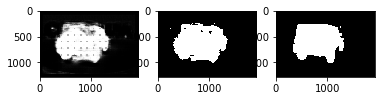

1356 0.0660259


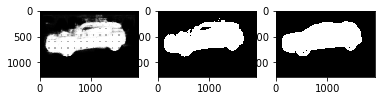

1357 0.0994772


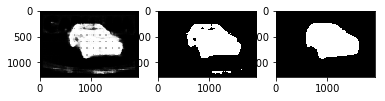

1358 0.0870828


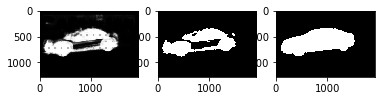

1359 0.0758134


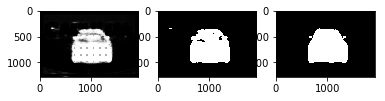

1360 0.0905691


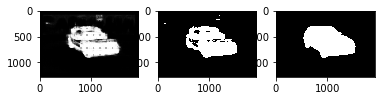

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1361 0.0891235


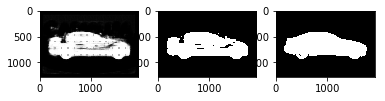

1362 0.0763875


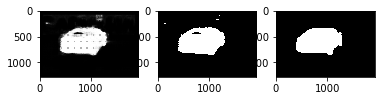

1363 0.0742585


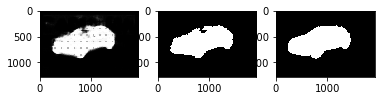

1364 0.0753974


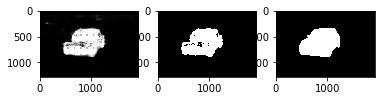

1365 0.0735585


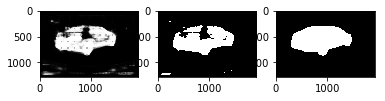

1366 0.0699548


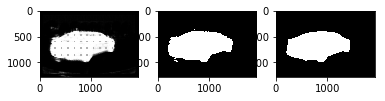

1367 0.0668124


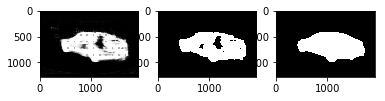

1368 0.0626916


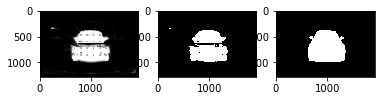

1369 0.0809651


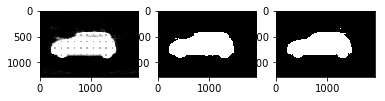

1370 0.09436


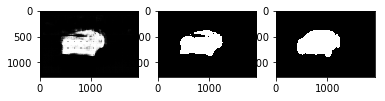

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1371 0.0674539


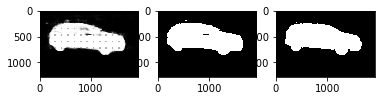

1372 0.0750996


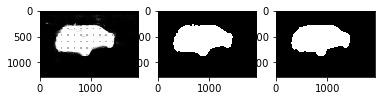

1373 0.0732108


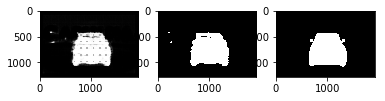

1374 0.0688051


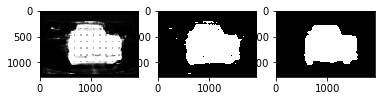

1375 0.0938682


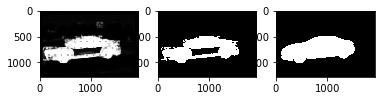

1376 0.0791159


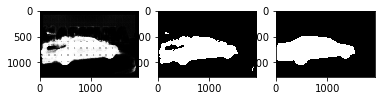

1377 0.0703464


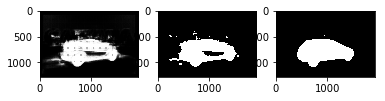

1378 0.0648737


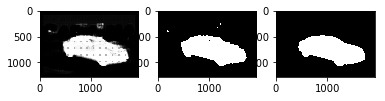

1379 0.0775143


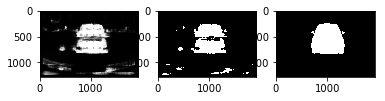

1380 0.077543


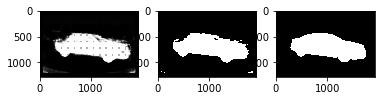

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1381 0.0891759


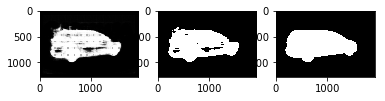

1382 0.0762317


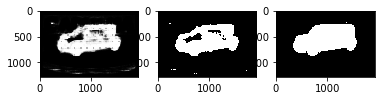

1383 0.0656854


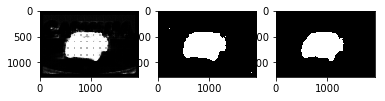

1384 0.0694087


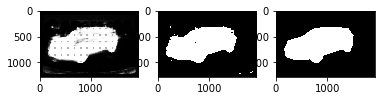

1385 0.0642102


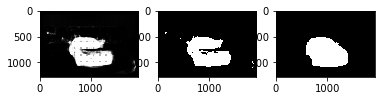

1386 0.076001


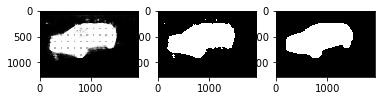

1387 0.070705


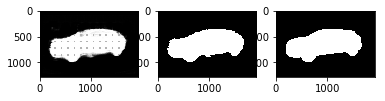

1388 0.0739822


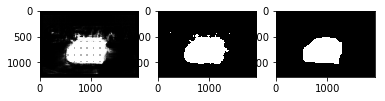

1389 0.0605166


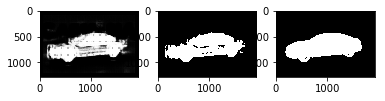

1390 0.0792073


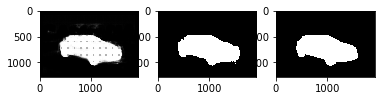

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1391 0.0724541


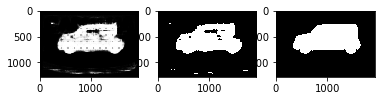

1392 0.105771


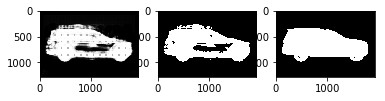

1393 0.0811102


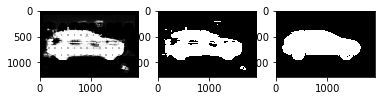

1394 0.0796924


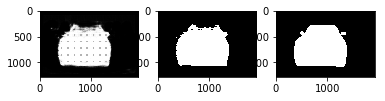

1395 0.0676976


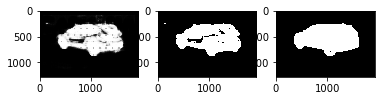

1396 0.0770153


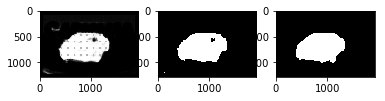

1397 0.0856425


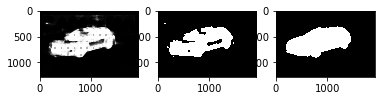

1398 0.068499


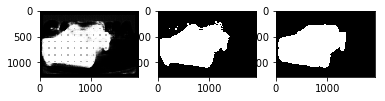

1399 0.0572619


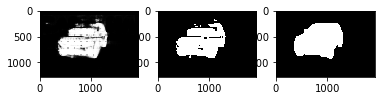

1400 0.0669676


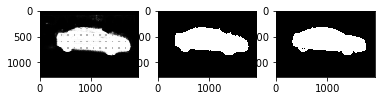

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1401 0.0626069


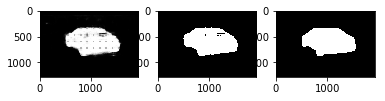

1402 0.0631475


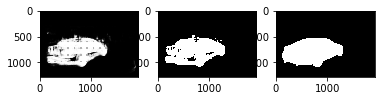

1403 0.0624051


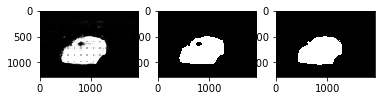

1404 0.0860908


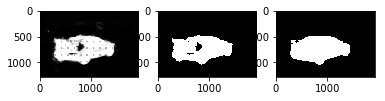

1405 0.0914309


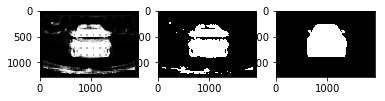

1406 0.0919795


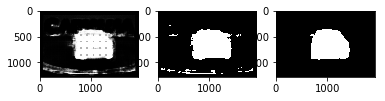

1407 0.0754723


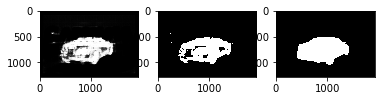

1408 0.0767958


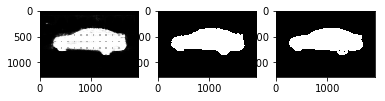

1409 0.0792264


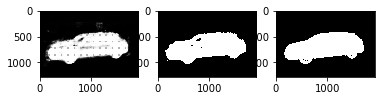

1410 0.085774


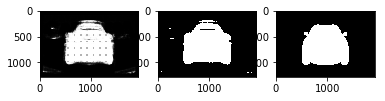

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1411 0.0814203


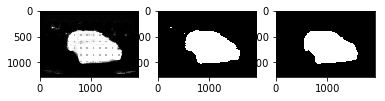

1412 0.0715985


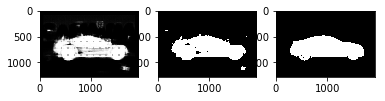

1413 0.0810546


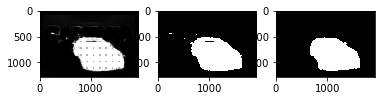

1414 0.0673404


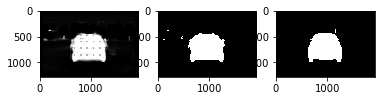

1415 0.0643759


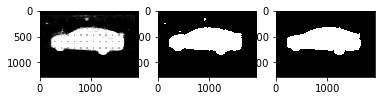

1416 0.0869525


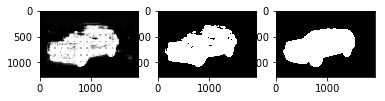

1417 0.0768543


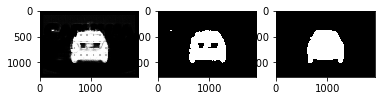

1418 0.0827482


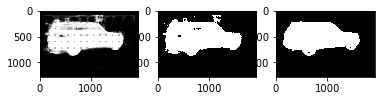

1419 0.0550207


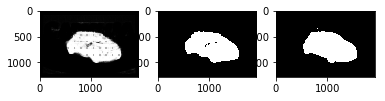

1420 0.0746811


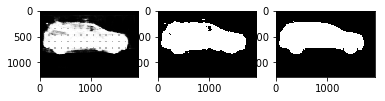

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1421 0.103909


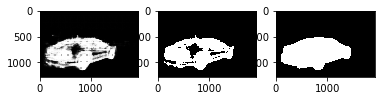

1422 0.070384


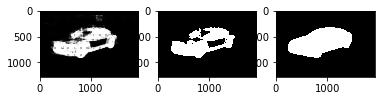

1423 0.0766289


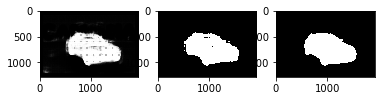

1424 0.0675341


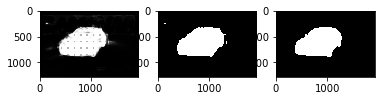

1425 0.0558203


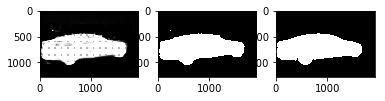

1426 0.0686327


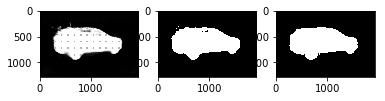

1427 0.0761571


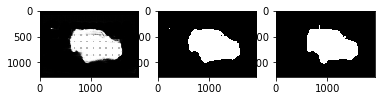

1428 0.101913


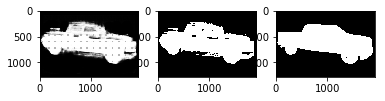

1429 0.0709801


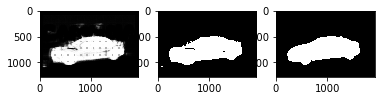

1430 0.0885888


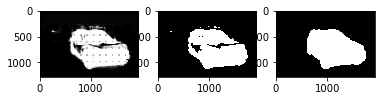

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1431 0.081641


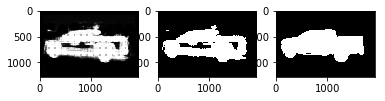

1432 0.0688039


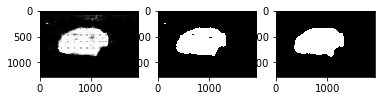

1433 0.0726328


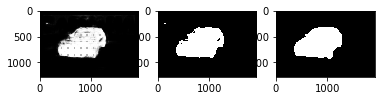

1434 0.0747062


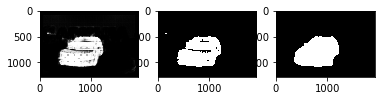

1435 0.0680241


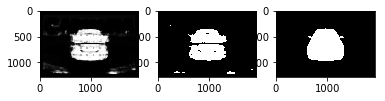

1436 0.074328


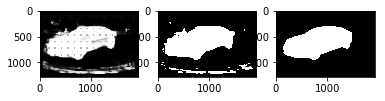

1437 0.0726792


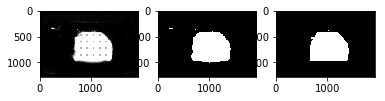

1438 0.060833


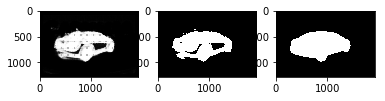

1439 0.0650348


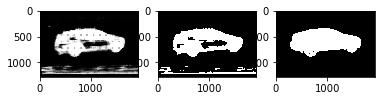

1440 0.0861732


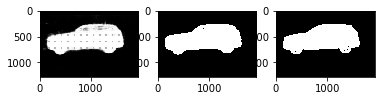

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1441 0.0751731


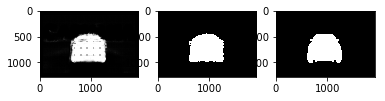

1442 0.0714122


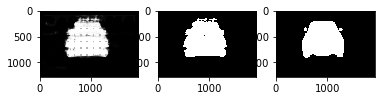

1443 0.084543


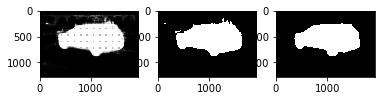

1444 0.0641023


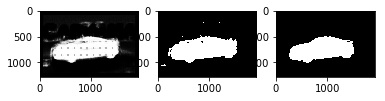

1445 0.0639717


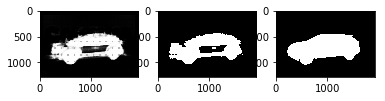

1446 0.096086


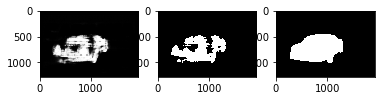

1447 0.056001


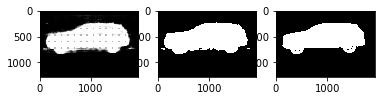

1448 0.0696386


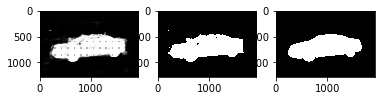

1449 0.074556


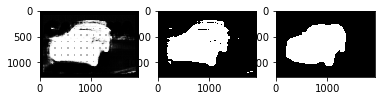

1450 0.0567992


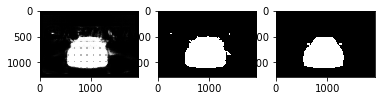

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1451 0.0752378


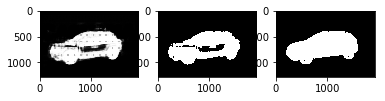

1452 0.0778653


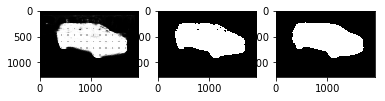

1453 0.0847415


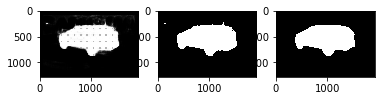

1454 0.0631997


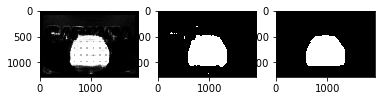

1455 0.0801411


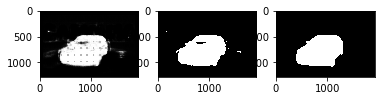

1456 0.0545063


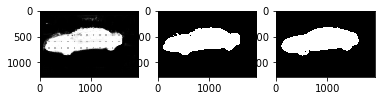

1457 0.0794327


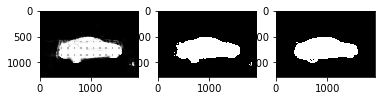

1458 0.0899921


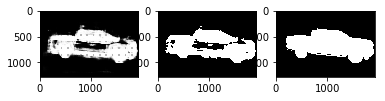

1459 0.103052


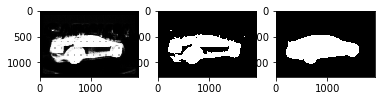

1460 0.0791449


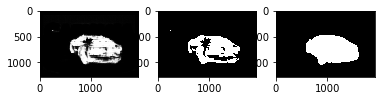

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1461 0.0781458


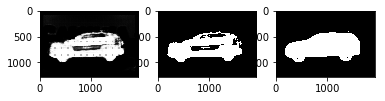

1462 0.133722


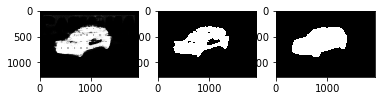

1463 0.0947798


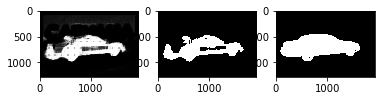

1464 0.103585


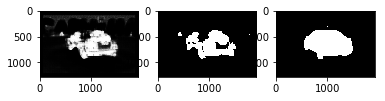

1465 0.102004


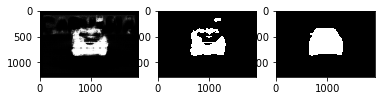

1466 0.0936761


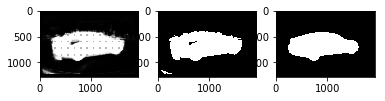

1467 0.143417


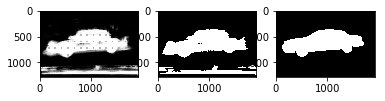

1468 0.0892861


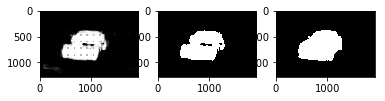

1469 0.0977675


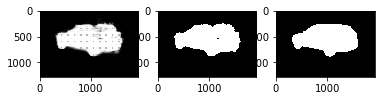

1470 0.103741


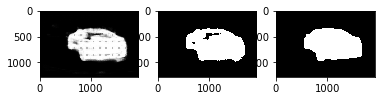

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1471 0.0949839


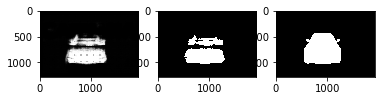

1472 0.0874213


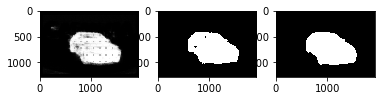

1473 0.0856669


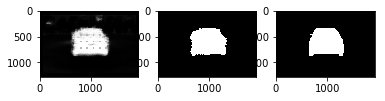

1474 0.101123


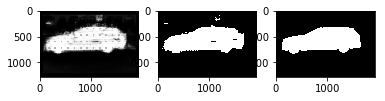

1475 0.0961027


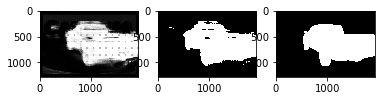

1476 0.0989457


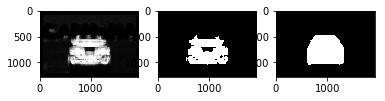

1477 0.110426


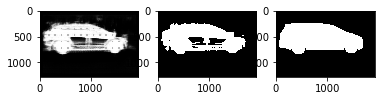

1478 0.0890124


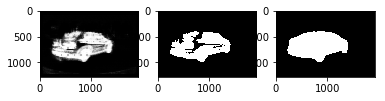

1479 0.126317


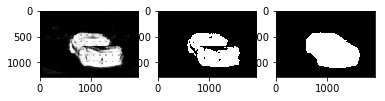

1480 0.0647655


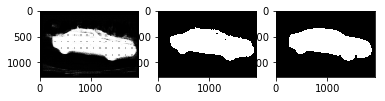

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1481 0.100205


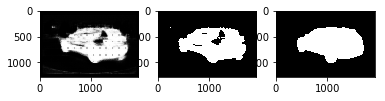

1482 0.106361


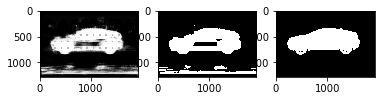

1483 0.103006


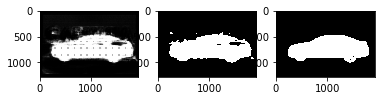

1484 0.0890713


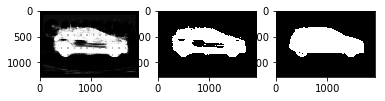

1485 0.10375


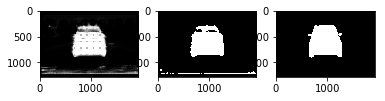

1486 0.0705475


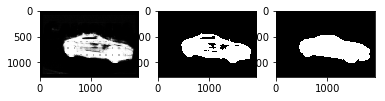

1487 0.0981174


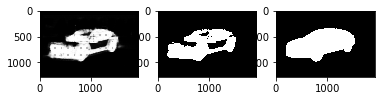

1488 0.0822309


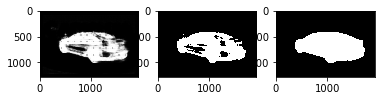

1489 0.0728578


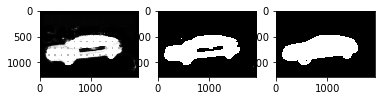

1490 0.0828096


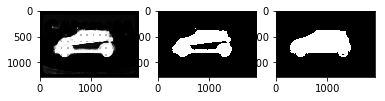

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1491 0.0722154


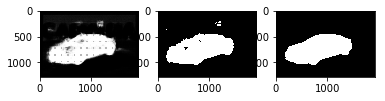

1492 0.0823711


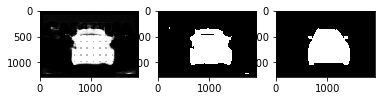

1493 0.0857134


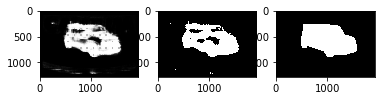

1494 0.0653084


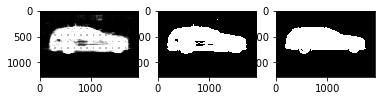

1495 0.0864717


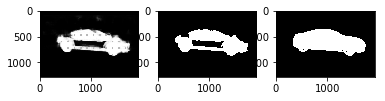

1496 0.0942658


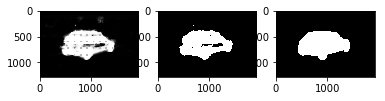

1497 0.0768302


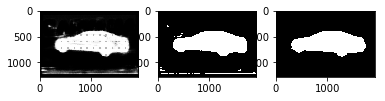

1498 0.0600225


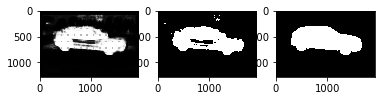

1499 0.069861


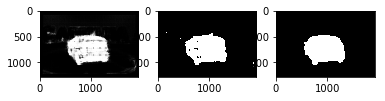

1500 0.0618031


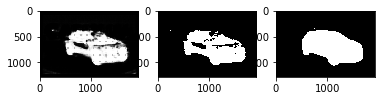

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1501 0.0626588


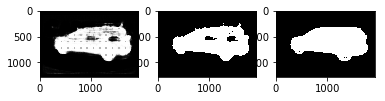

1502 0.0761947


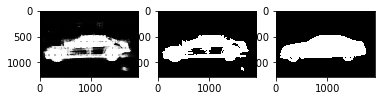

1503 0.102085


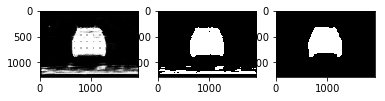

1504 0.069827


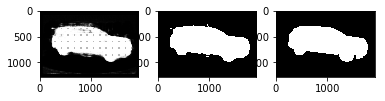

1505 0.0766147


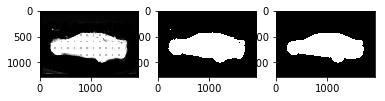

1506 0.0830587


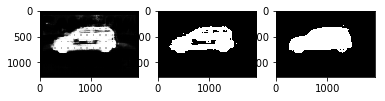

1507 0.0559387


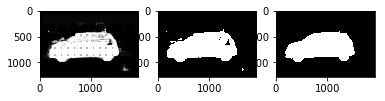

1508 0.0708192


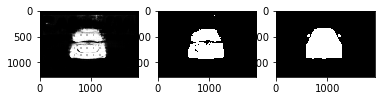

1509 0.0652302


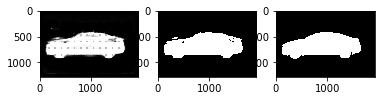

1510 0.0723549


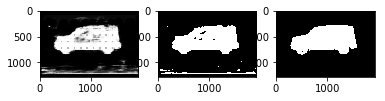

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1511 0.0716009


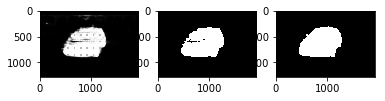

1512 0.0800937


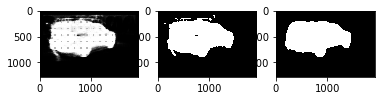

1513 0.0808052


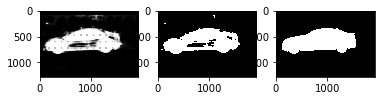

1514 0.0824589


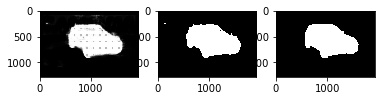

1515 0.0518277


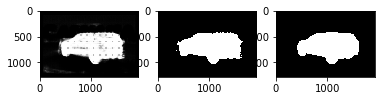

1516 0.0681535


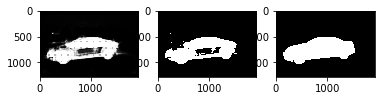

1517 0.0618184


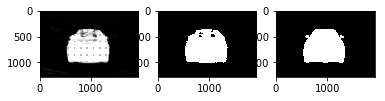

1518 0.0710083


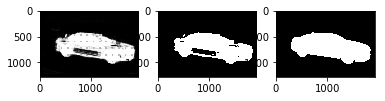

1519 0.0628525


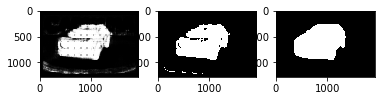

1520 0.084909


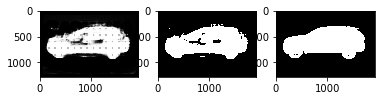

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1521 0.0617241


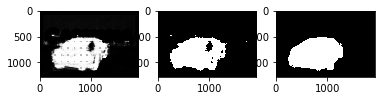

1522 0.0790973


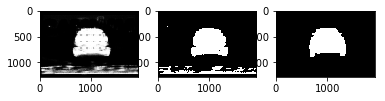

1523 0.076702


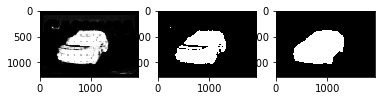

1524 0.0769585


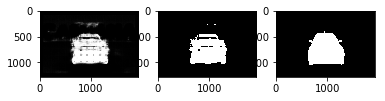

1525 0.0630124


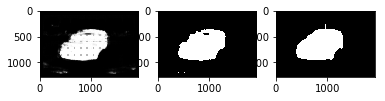

1526 0.0641759


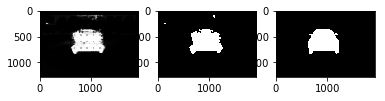

1527 0.0738795


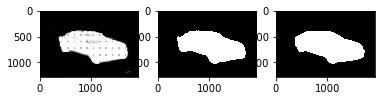

1528 0.100265


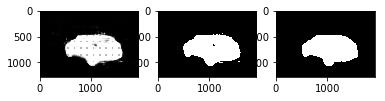

1529 0.326405


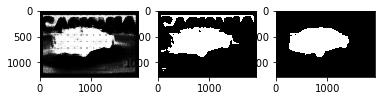

1530 0.294381


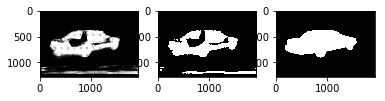

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1531 0.206436


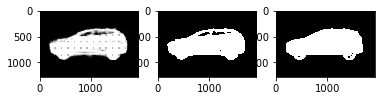

1532 0.16603


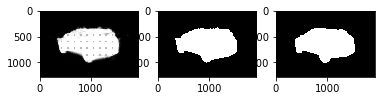

1533 0.334516


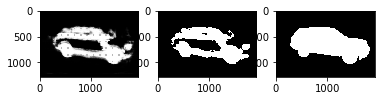

1534 0.221851


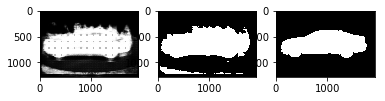

1535 0.26621


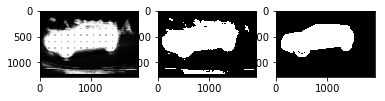

1536 0.213515


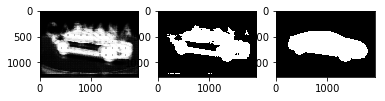

1537 0.166997


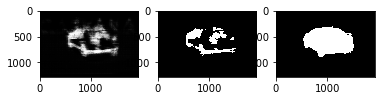

1538 0.21305


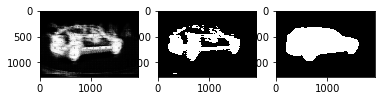

1539 0.140835


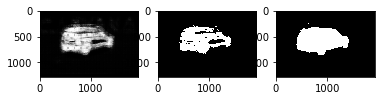

1540 0.133932


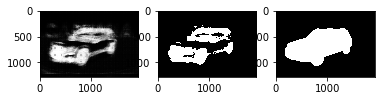

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1541 0.150538


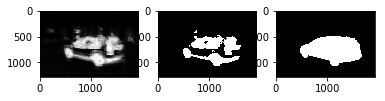

1542 0.16326


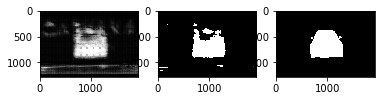

1543 0.150633


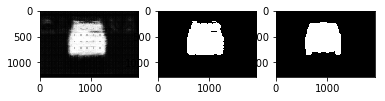

1544 0.150793


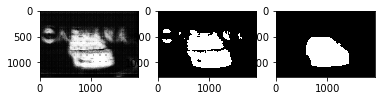

1545 0.184525


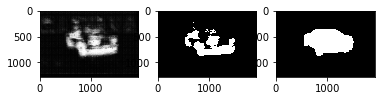

1546 0.160777


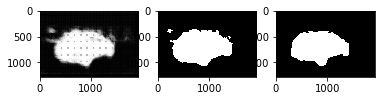

1547 0.143014


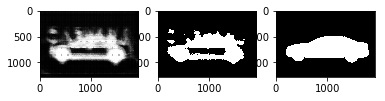

1548 0.127232


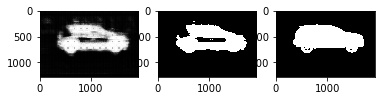

1549 0.16611


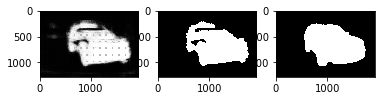

1550 0.165212


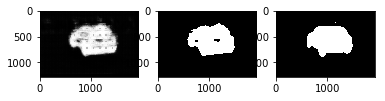

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1551 0.165616


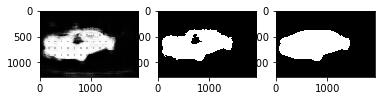

1552 0.114529


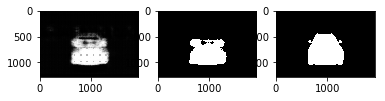

1553 0.139243


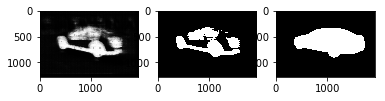

1554 0.124016


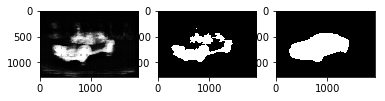

1555 0.133816


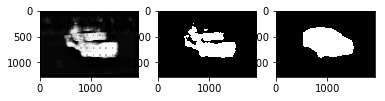

1556 0.135263


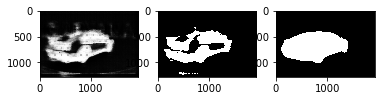

1557 0.128228


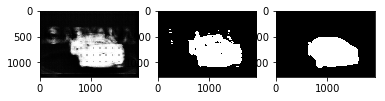

1558 0.132367


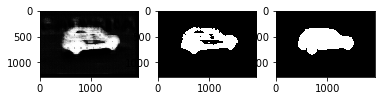

1559 0.117002


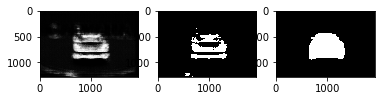

1560 0.127485


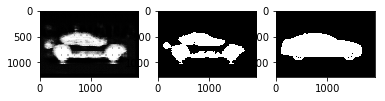

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1561 0.0986383


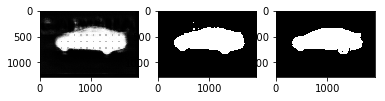

1562 0.127756


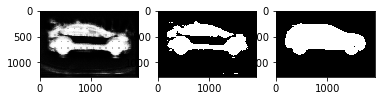

1563 0.125784


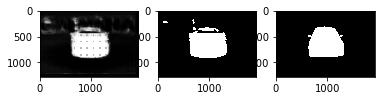

1564 0.102352


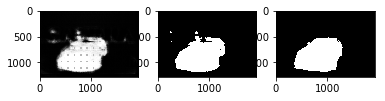

1565 0.124541


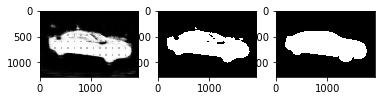

1566 0.137251


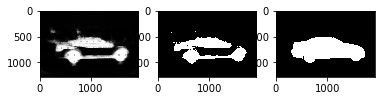

1567 0.111517


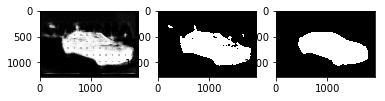

1568 0.0851259


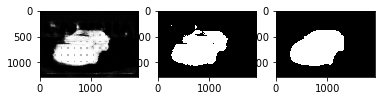

1569 0.100734


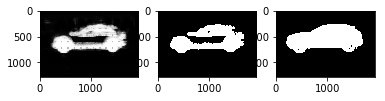

1570 0.085444


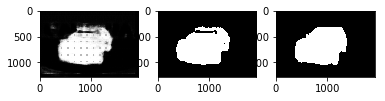

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1571 0.13884


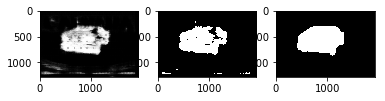

1572 0.107198


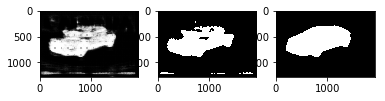

1573 0.118873


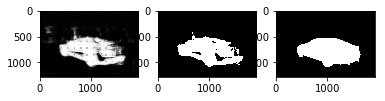

1574 0.127663


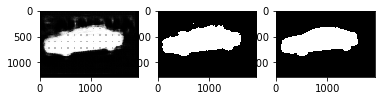

1575 0.0959175


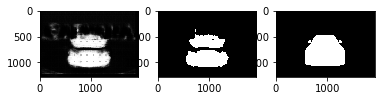

1576 0.116744


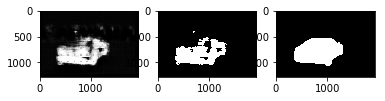

1577 0.0900295


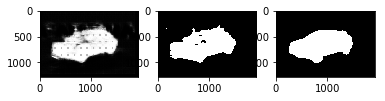

1578 0.10636


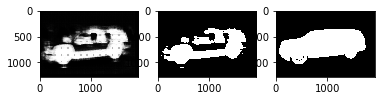

1579 0.123593


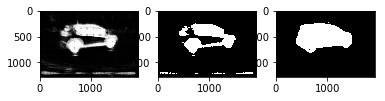

1580 0.115336


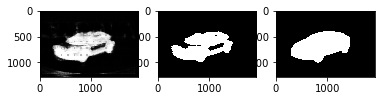

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1581 0.0969749


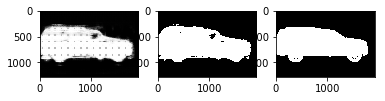

1582 0.10651


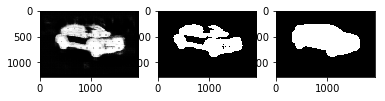

1583 0.103584


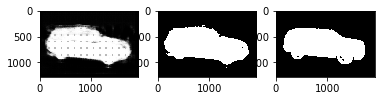

1584 0.115661


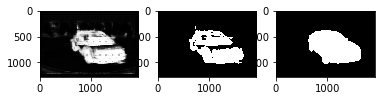

1585 0.109547


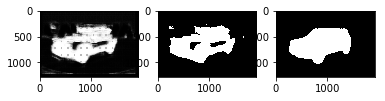

1586 0.112651


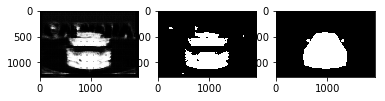

1587 0.124725


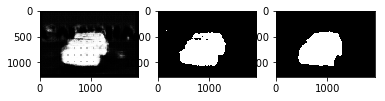

1588 0.097866


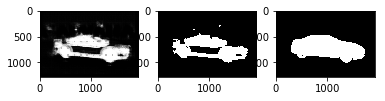

1589 0.0925761


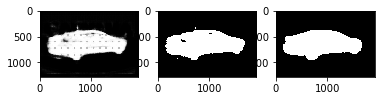

1590 0.0967104


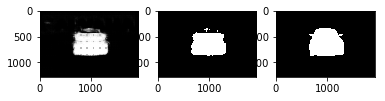

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1591 0.159026


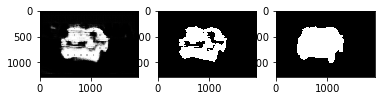

1592 0.100576


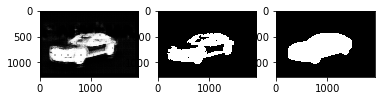

1593 0.110379


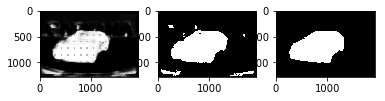

1594 0.116957


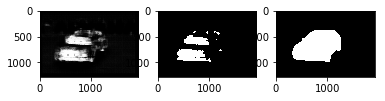

1595 0.140189


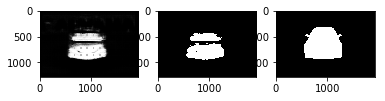

1596 0.0923037


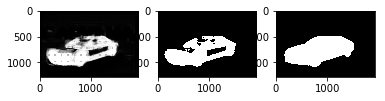

1597 0.110063


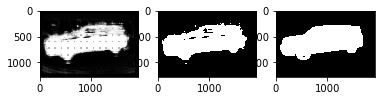

1598 0.126584


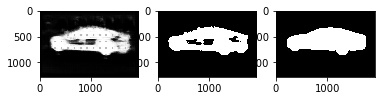

1599 0.114878


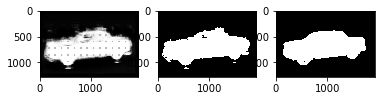

1600 0.116885


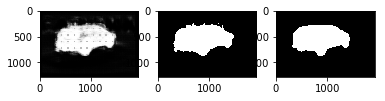

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1601 0.111833


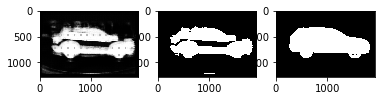

1602 0.0954329


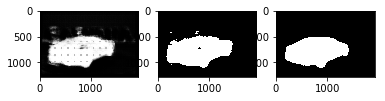

1603 0.094001


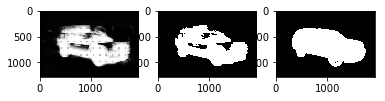

1604 0.0874045


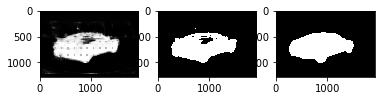

1605 0.11336


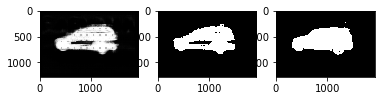

1606 0.105783


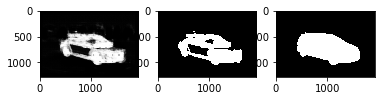

1607 0.106682


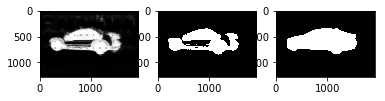

1608 0.120409


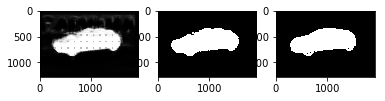

1609 0.101349


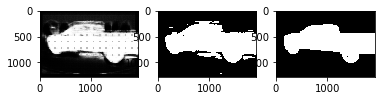

1610 0.107774


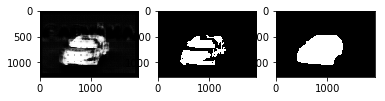

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1611 0.0988983


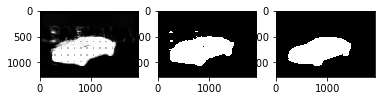

1612 0.110682


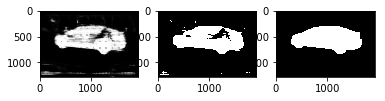

1613 0.0870751


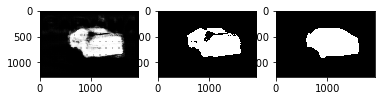

1614 0.10155


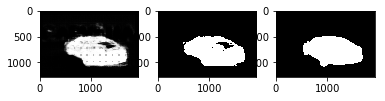

1615 0.114659


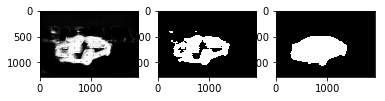

1616 0.112183


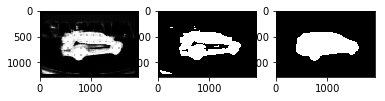

1617 0.0938806


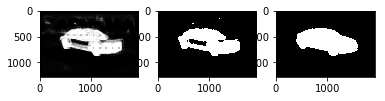

1618 0.122025


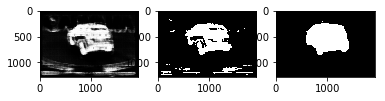

1619 0.080395


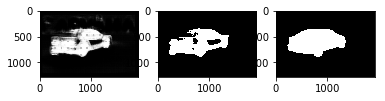

1620 0.0847137


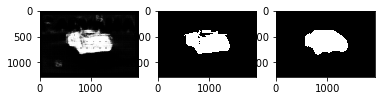

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1621 0.0922793


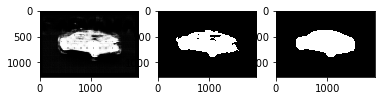

1622 0.0884248


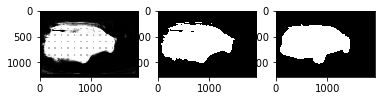

1623 0.060615


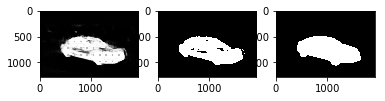

1624 0.0670823


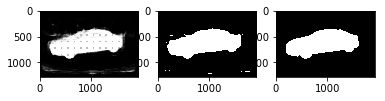

1625 0.0717687


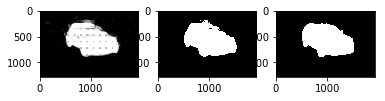

1626 0.0644678


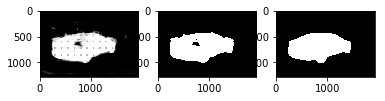

1627 0.094923


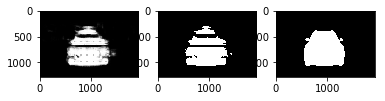

1628 0.0740531


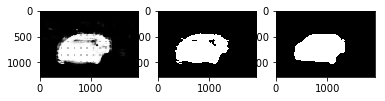

1629 0.0946299


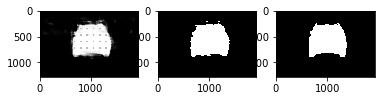

1630 0.0963984


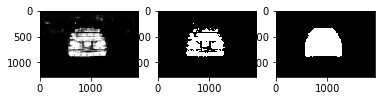

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1631 0.0738812


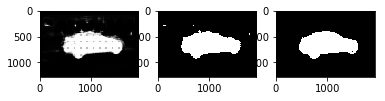

1632 0.081094


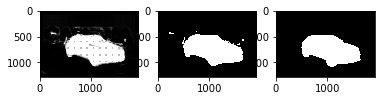

1633 0.0830454


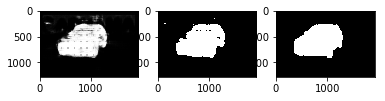

1634 0.0787375


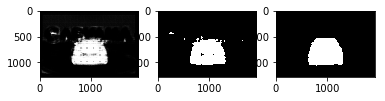

1635 0.0922818


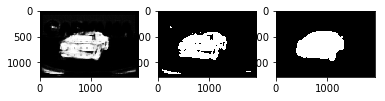

1636 0.0884436


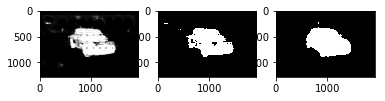

1637 0.101438


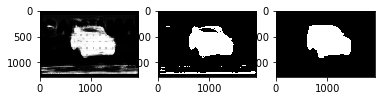

1638 0.0783088


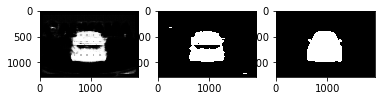

1639 0.0693381


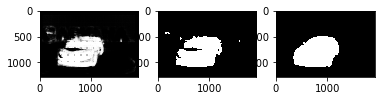

1640 0.0968759


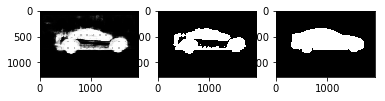

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1641 0.0910391


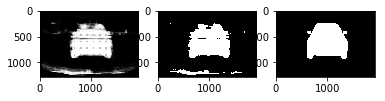

1642 0.0913951


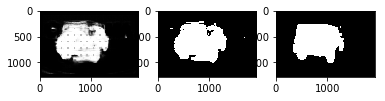

1643 0.0624158


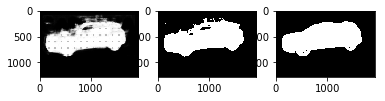

1644 0.087097


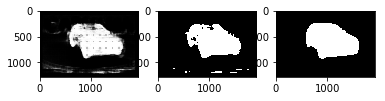

1645 0.081243


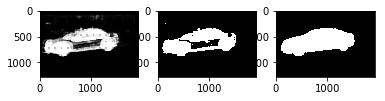

1646 0.0779576


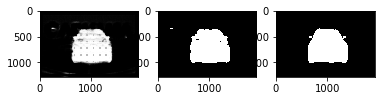

1647 0.0851954


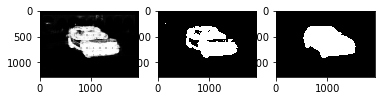

1648 0.0799062


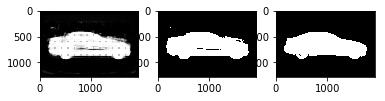

1649 0.0709517


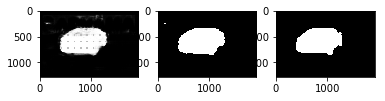

1650 0.0717224


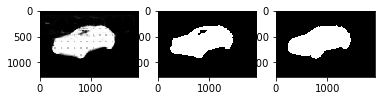

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1651 0.0697079


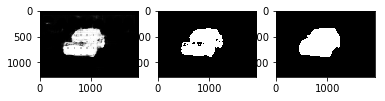

1652 0.0681313


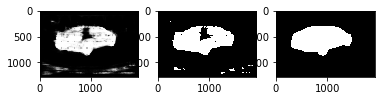

1653 0.0612304


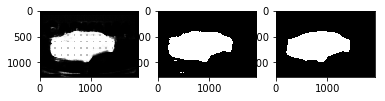

1654 0.0645706


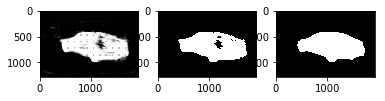

1655 0.060915


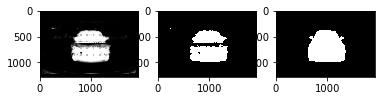

1656 0.0776701


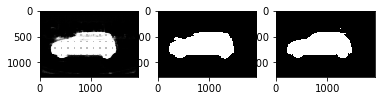

1657 0.0822023


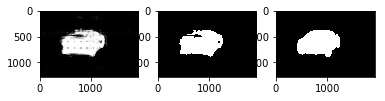

1658 0.0712136


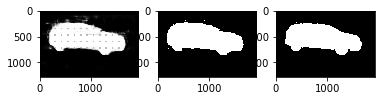

1659 0.0717063


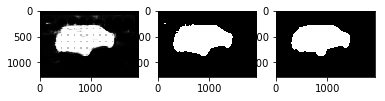

1660 0.0673662


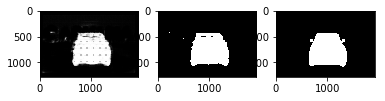

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1661 0.0598284


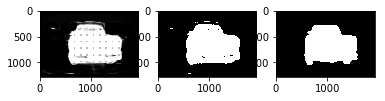

1662 0.0988275


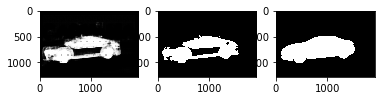

1663 0.0764346


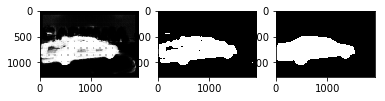

1664 0.0652835


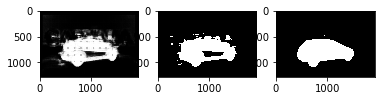

1665 0.0588002


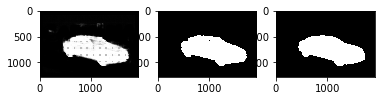

1666 0.062237


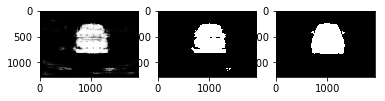

1667 0.0800964


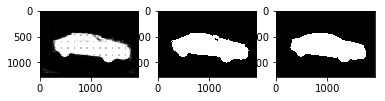

1668 0.0829804


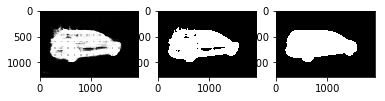

1669 0.0717574


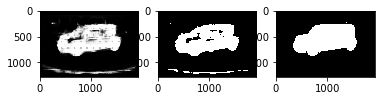

1670 0.0736613


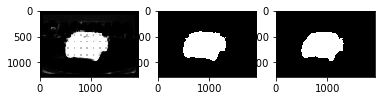

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1671 0.0612301


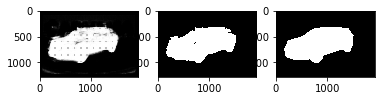

1672 0.0680444


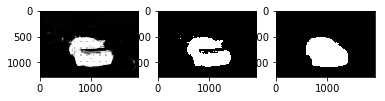

1673 0.0763071


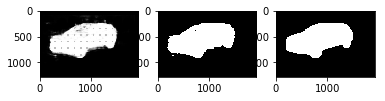

1674 0.0704028


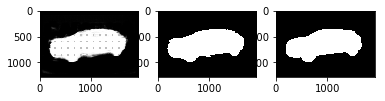

1675 0.0671349


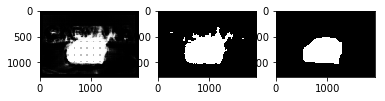

1676 0.0573978


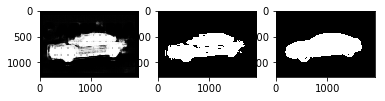

1677 0.0854707


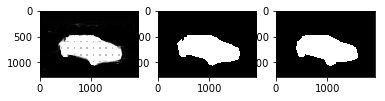

1678 0.0726491


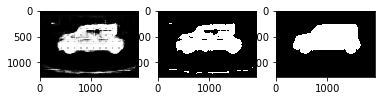

1679 0.0994154


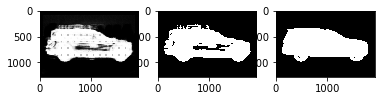

1680 0.0763804


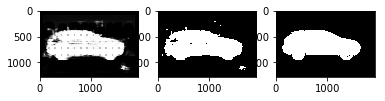

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1681 0.0693547


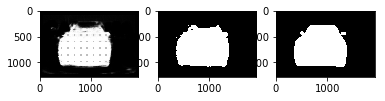

1682 0.0616197


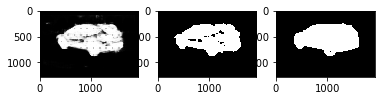

1683 0.0712019


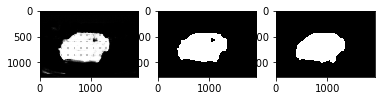

1684 0.0864712


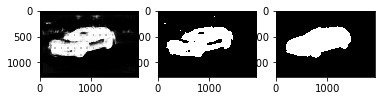

1685 0.105965


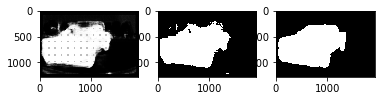

1686 0.159982


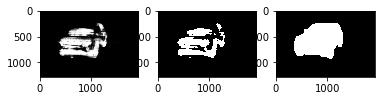

1687 0.236058


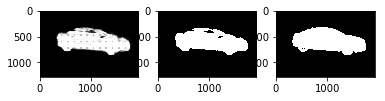

1688 0.125783


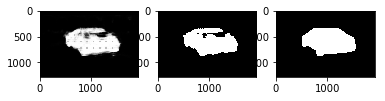

1689 0.132095


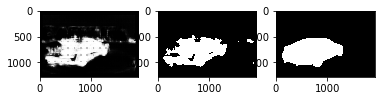

1690 0.173413


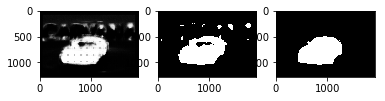

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1691 0.169473


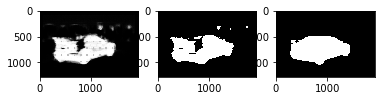

1692 0.168677


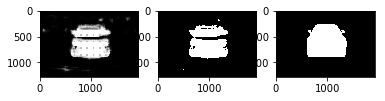

1693 0.170333


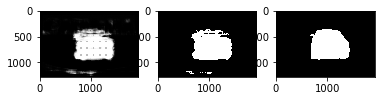

1694 0.125826


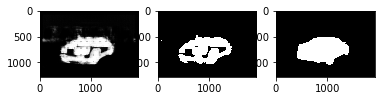

1695 0.123972


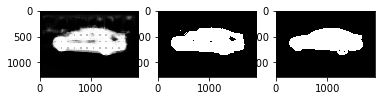

1696 0.12179


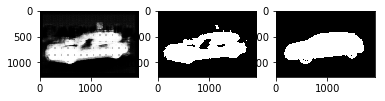

1697 0.135351


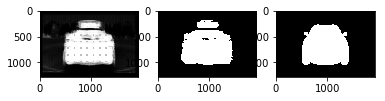

1698 0.135096


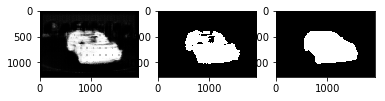

1699 0.136722


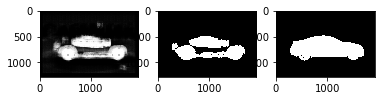

1700 0.138703


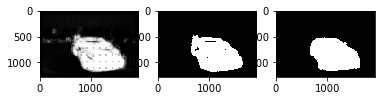

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1701 0.123297


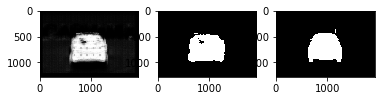

1702 0.108432


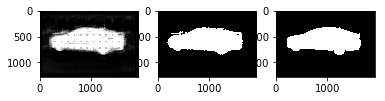

1703 0.143476


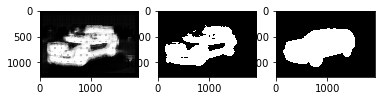

1704 0.140255


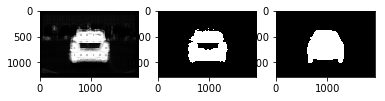

1705 0.121182


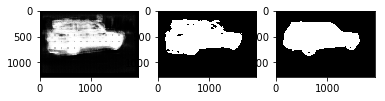

1706 0.0980856


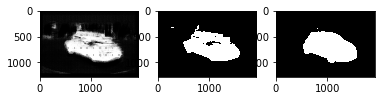

1707 0.122579


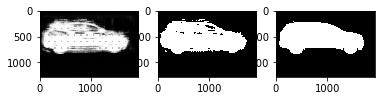

1708 0.160557


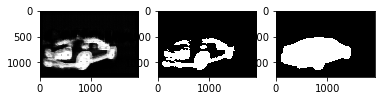

1709 0.120039


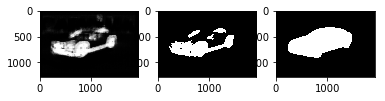

1710 0.114396


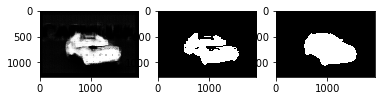

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1711 0.098709


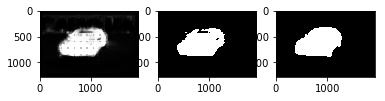

1712 0.0875284


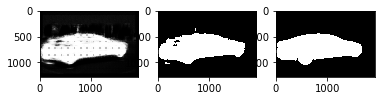

1713 0.0979331


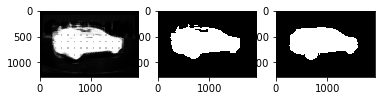

1714 0.0937113


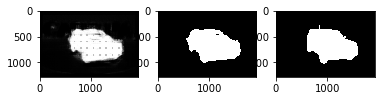

1715 0.141948


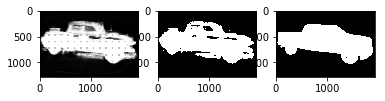

1716 0.119116


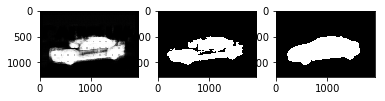

1717 0.114969


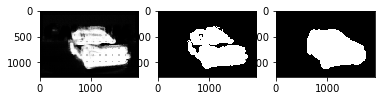

1718 0.127571


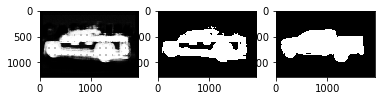

1719 0.1095


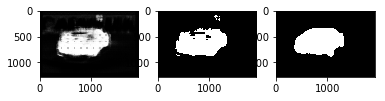

1720 0.109807


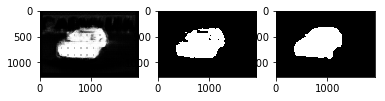

INFO:tensorflow:Restoring parameters from model/model
evaluating validation set
1721 0.0987758


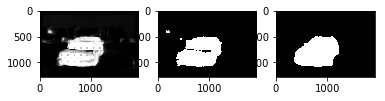

1722 0.0891519


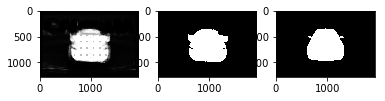

KeyboardInterrupt: 

In [161]:
for i in range(2000):
    metrics, pred_val, masks_val, loss_val, _ = sess.run([tf.get_collection('metrics'), pred, masks, loss, train])
    step = global_step.eval()
    summary = tf.Summary()
    summary.value.add(tag='loss', simple_value=metrics[0])
    summary.value.add(tag='precision', simple_value=metrics[1])
    summary.value.add(tag='recall', simple_value=metrics[2])
    summary.value.add(tag='f1', simple_value=metrics[3])
    summary.value.add(tag='accuracy', simple_value=metrics[4])
    train_writer.add_summary(summary, step)
    print(step, loss_val)
    plt.subplot(131)
    plt.imshow(np.squeeze(pred_val)[0])
    plt.subplot(132)
    plt.imshow(np.round(np.squeeze(pred_val)[0]))
    plt.subplot(133)
    plt.imshow(np.squeeze(masks_val[0]))
    plt.show()
    if step % 10 == 0:
        train_writer.flush()
        saver.save(sess, './model/model')
        log_validation()
train_writer.flush()

In [33]:
saver.save(sess, './model/model')

'./model/model'

## etc

1969578
2455040
0.822752786105
0.177247213895


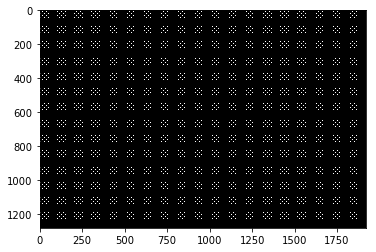

In [88]:
print(np.sum(mask == np.round(pred_val)))
print(mask.size)

print(np.sum(mask==0) / mask.size)
print(np.sum(mask==1) / mask.size)

plt.imshow(np.round(np.squeeze(pred_val)))

In [ ]:
with tf.Session() as val_sess:
    saver = tf.train.import_meta_graph('model/model.meta')

    saver.restore(val_sess, './model/model')
    print(sess.run('pred/pred:0', feed_dict={'images:0': np.zeros((1, 1280, 1918, 3))}))

In [26]:
pred_val.shape

(8, 1280, 1918)

In [20]:
imgs = np.array([imread(f) for f in glob.glob('train/00087a6bd4dc*')])
masks = np.array([imread(f)[:,:,0].astype(np.float32) / 255 for f in glob.glob('train_masks/00087a6bd4dc*')])

In [ ]:
for _ in range(100):
    pred_val, loss_val, _ = sess.run([pred, loss, optimize], feed_dict={input: imgs, label: masks})
    print(loss_val, np.sum(masks == np.round(pred_val)) / masks.size)


1.0
0.0


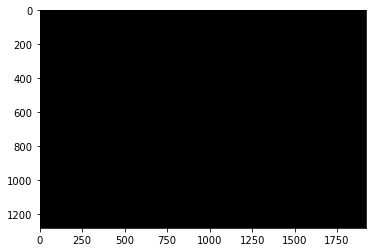

In [30]:
print(np.sum(np.round(pred_val)==0) / masks.size)
print(np.sum(np.round(pred_val)==1) / masks.size)

plt.imshow(np.round(pred_val[0]))

In [46]:
print(np.sum(masks==0))
print(np.sum(masks==1))

30103958
9176682
